# RBM training $ L=8$  - Dataset with 25 different temperatures

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split
import seaborn as sns

import torch
import torch.nn as nn
torch.manual_seed(12)

import sys
# sys.path.append('../modules')
from rbm_L8 import RBM
from mc_ising2d import IsingMC
import os

In [2]:
L = 8

## Dataset with $ T/J = 10^{-6}, 0.25, 0.5, ..., 5.5, 5.75, 6 $.

The first step is to load the Ising data generated by Monte Carlo procedure. The file `L8_Ising2D_MC.pkl` contains spins configurations for a square lattice $L\times L$, with $L=8$. There are 2000 spins configurations for each of 25 different temperatures $ T/J = 10^{-6}, 0.25, 0.5, ..., 5.5, 5.75, 6 $.

In [3]:
ising_data = pd.read_pickle(f'L{L}_Ising2D_MC.pkl')
ising_data.head()

,state,magn,energy,temp
0,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ...",-18,-32,6.0
1,"[1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, ...",4,-20,6.0
2,"[0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, ...",-8,-12,6.0
3,"[0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, ...",-2,-28,6.0
4,"[0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, ...",-12,-40,6.0


In [4]:
ising_data['temp'].value_counts()

temp
6.000000    2000
2.750000    2000
0.250000    2000
0.500000    2000
0.750000    2000
1.000000    2000
1.250000    2000
1.500000    2000
1.750000    2000
2.000000    2000
2.250000    2000
2.500000    2000
3.000000    2000
5.750000    2000
3.250000    2000
3.500000    2000
3.750000    2000
4.000000    2000
4.250000    2000
4.500000    2000
4.750000    2000
5.000000    2000
5.250000    2000
5.500000    2000
0.000001    2000
Name: count, dtype: int64

In the thermodynamic limit $( L^2 \rightarrow \infty )$, the isotropic Ising model in a square lattice was analytically solved by [Lars Onsager](https://en.wikipedia.org/wiki/Lars_Onsager) in [1944](https://journals.aps.org/pr/abstract/10.1103/PhysRev.65.117). In this limit, the model show spontaneous magnetization for $ T < T_c$, with $T_c$ given by 

$$ \frac{T_c}{J} = \frac{2}{\log\left(1 + \sqrt{ 2}\right)} \approx 2.269185  \;. $$

With the class `IsingMC` we can check some thermodynamics quantities.

Method fit will construct states to the following temperatures: 
[3.5        3.4        3.3        3.2        3.1        3.
 2.9        2.8        2.7        2.6        2.5        2.4
 2.3        2.27918531 2.26918531 2.25918531 2.2        2.1
 2.         1.9        1.8        1.7        1.6        1.5
 1.4        1.3        1.2        1.1        1.        ]


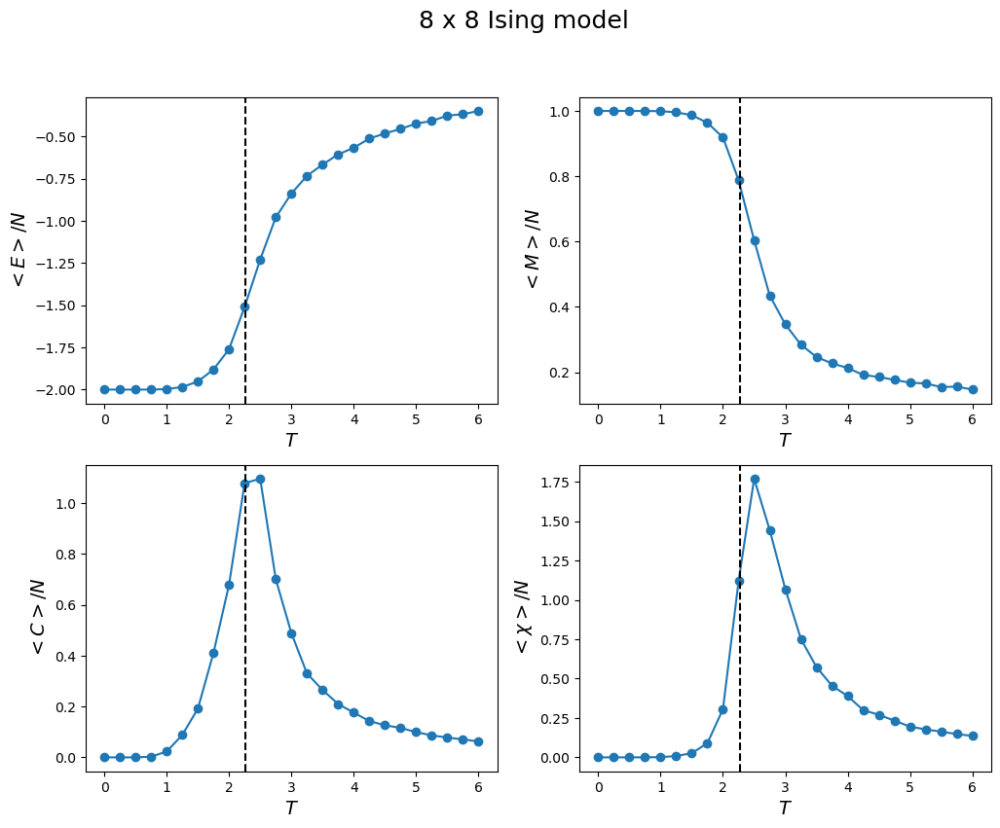

In [5]:
IsingMC(L= L).plot_thermodynamics(spin_MC= ising_data, Tc_scaled= False)

In [6]:
data = ising_data.drop(columns= ['energy', 'magn'])

### Constructing training and test sets

Using `train_test_split` from [`sklearn`](http://scikit-learn.org/) it is easy to split the data into training and test sets. Since `train_test_split` is a random process and our data has 1000 samples for each of the 25 temperatures values, we split the data for each temperature in order to avoid the possibility of a biased split towards some temperature value.

In [7]:
train_data_ = pd.DataFrame()
test_data_ = pd.DataFrame()

for _, temp in enumerate(data['temp'].value_counts().index.tolist()):
    
    train_data_T, test_data_T = train_test_split(data[data['temp'] == temp],
                                                 test_size= 0.2,
                                                 random_state= 12)
    
    train_data_ = pd.concat([train_data_, train_data_T])
    test_data_ = pd.concat([test_data_, test_data_T])

### Training the model

Our code implementing a Restricted Boltzmann Machine is written a python class called `RBM` which is imported from `rbm.py`.

For simplification, the units have no bias and the RBM stochasticity parameter, represented below by $T$ is set to unity, as usual in most practical applications. Note that we set `use_cuda=True`, which makes use of [CUDA tensor types](https://pytorch.org/docs/stable/cuda.html), implementing GPU computation. If a GPU is not available, one should just set `use_cuda=False`.

In [8]:
train_numpy_array = np.stack([np.array(elem, dtype=np.float32) for elem in train_data_['state']])
test_numpy_array = np.stack([np.array(elem, dtype=np.float32) for elem in test_data_['state']])

# Convert the numpy arrays to PyTorch tensors
training_set = torch.tensor(train_numpy_array)
test_set = torch.tensor(test_numpy_array)

# Randomly shuffle the training data
training_set = training_set[torch.randperm(training_set.size(0))]

In [9]:
training_set.shape[1]

64

Training RBM 1/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365838 (train), 0.366117 (test), Pseud_Lik: -25.731084, Time: 1.227771, 
Ep 20, Rec er: 0.348498 (train), 0.346619 (test), Pseud_Lik: -23.631233, Time: 1.172714, 
Ep 30, Rec er: 0.335734 (train), 0.335950 (test), Pseud_Lik: -22.507003, Time: 1.191860, 
Ep 40, Rec er: 0.329636 (train), 0.328822 (test), Pseud_Lik: -21.916169, Time: 1.194497, 
Ep 50, Rec er: 0.324068 (train), 0.324177 (test), Pseud_Lik: -21.356273, Time: 1.244036, 
Ep 60, Rec er: 0.319725 (train), 0.320352 (test), Pseud_Lik: -20.711291, Time: 1.240270, 
Ep 70, Rec er: 0.316075 (train), 0.316998 (test), Pseud_Lik: -20.269805, Time: 1.235698, 
Ep 80, Rec er: 0.312487 (train), 0.313331 (test), Pseud_Lik: -19.952421, Time: 1.273496, 
Ep 90, Rec er: 0.308560 (train), 0.309652 (test), Pseud_Lik: -19.361793, Time: 1.217924, 
Ep 100, Rec er: 0.306019 (train), 0.306513 (test), Pseu

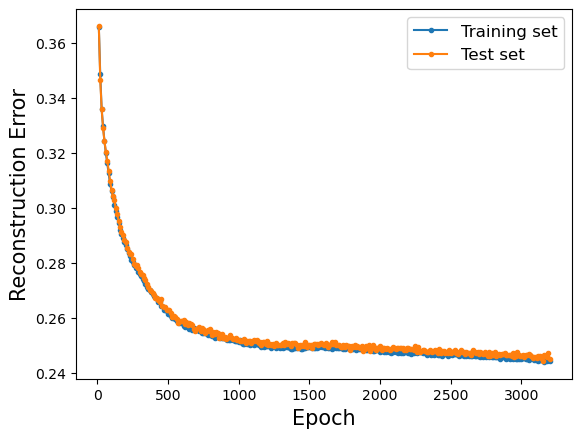

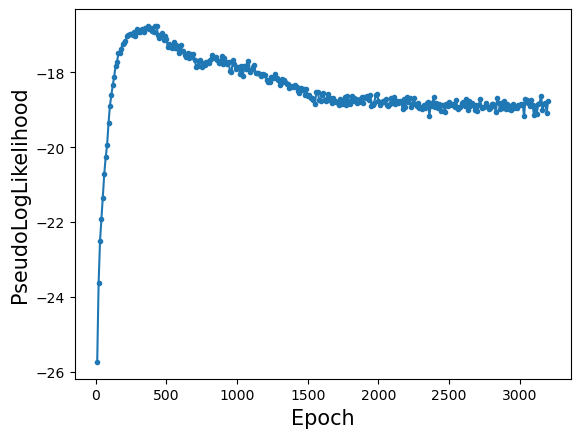

Training RBM 2/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366188 (train), 0.365444 (test), Pseud_Lik: -25.740582, Time: 1.188653, 
Ep 20, Rec er: 0.346830 (train), 0.347166 (test), Pseud_Lik: -23.625636, Time: 1.182522, 
Ep 30, Rec er: 0.334319 (train), 0.334473 (test), Pseud_Lik: -22.297451, Time: 1.198913, 
Ep 40, Rec er: 0.327641 (train), 0.328309 (test), Pseud_Lik: -21.478016, Time: 1.210217, 
Ep 50, Rec er: 0.322896 (train), 0.322036 (test), Pseud_Lik: -20.737574, Time: 1.208704, 
Ep 60, Rec er: 0.318766 (train), 0.318997 (test), Pseud_Lik: -20.431688, Time: 1.229098, 
Ep 70, Rec er: 0.315125 (train), 0.316033 (test), Pseud_Lik: -20.108525, Time: 1.215964, 
Ep 80, Rec er: 0.312361 (train), 0.313158 (test), Pseud_Lik: -19.581059, Time: 1.216451, 
Ep 90, Rec er: 0.310068 (train), 0.309997 (test), Pseud_Lik: -19.267869, Time: 1.219224, 
Ep 100, Rec er: 0.307911 (train), 0.308516 (test), Pseu

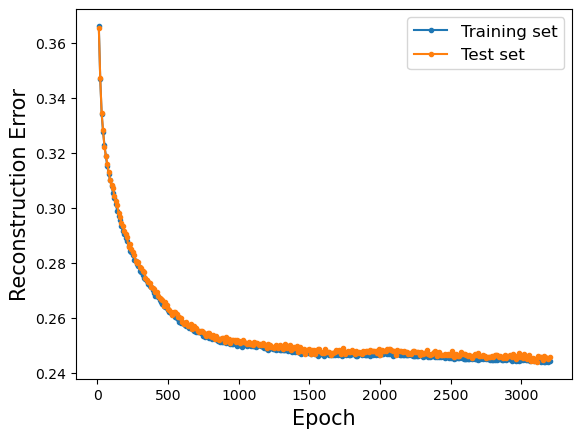

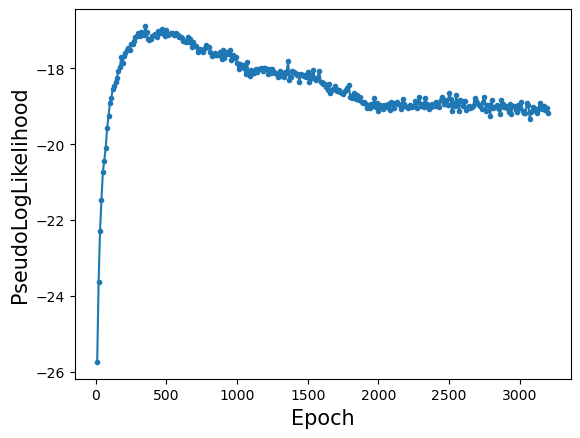

Training RBM 3/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366980 (train), 0.365958 (test), Pseud_Lik: -25.928579, Time: 1.177047, 
Ep 20, Rec er: 0.347686 (train), 0.347323 (test), Pseud_Lik: -23.630258, Time: 1.177505, 
Ep 30, Rec er: 0.335246 (train), 0.337184 (test), Pseud_Lik: -22.355103, Time: 1.189552, 
Ep 40, Rec er: 0.330171 (train), 0.331230 (test), Pseud_Lik: -21.895879, Time: 1.200265, 
Ep 50, Rec er: 0.326110 (train), 0.326094 (test), Pseud_Lik: -21.439649, Time: 1.224024, 
Ep 60, Rec er: 0.320991 (train), 0.321508 (test), Pseud_Lik: -20.798402, Time: 1.208772, 
Ep 70, Rec er: 0.316475 (train), 0.317534 (test), Pseud_Lik: -20.222172, Time: 1.211207, 
Ep 80, Rec er: 0.313071 (train), 0.313670 (test), Pseud_Lik: -19.720378, Time: 1.215021, 
Ep 90, Rec er: 0.309874 (train), 0.311652 (test), Pseud_Lik: -19.298095, Time: 1.221342, 
Ep 100, Rec er: 0.307445 (train), 0.307611 (test), Pseu

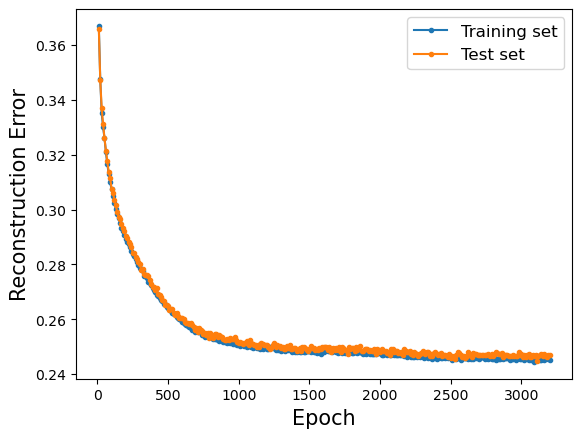

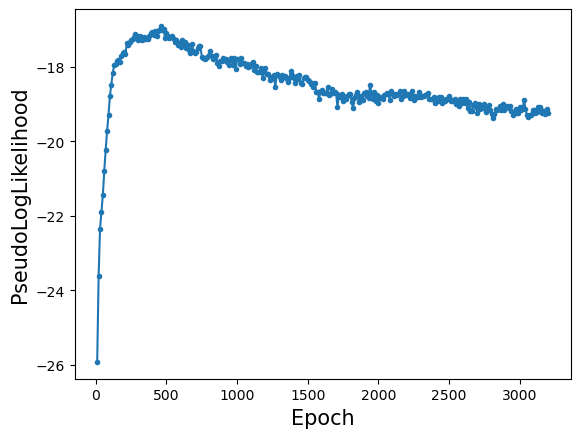

Training RBM 4/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365364 (train), 0.365427 (test), Pseud_Lik: -25.492169, Time: 1.177964, 
Ep 20, Rec er: 0.347555 (train), 0.346853 (test), Pseud_Lik: -23.608205, Time: 1.179624, 
Ep 30, Rec er: 0.335496 (train), 0.335395 (test), Pseud_Lik: -22.458970, Time: 1.186295, 
Ep 40, Rec er: 0.329495 (train), 0.330016 (test), Pseud_Lik: -21.803028, Time: 1.197075, 
Ep 50, Rec er: 0.323409 (train), 0.324047 (test), Pseud_Lik: -21.093267, Time: 1.206706, 
Ep 60, Rec er: 0.318782 (train), 0.318897 (test), Pseud_Lik: -20.581792, Time: 1.205664, 
Ep 70, Rec er: 0.313409 (train), 0.314213 (test), Pseud_Lik: -19.990709, Time: 1.224128, 
Ep 80, Rec er: 0.309340 (train), 0.312234 (test), Pseud_Lik: -19.470589, Time: 1.213397, 
Ep 90, Rec er: 0.306534 (train), 0.308084 (test), Pseud_Lik: -19.070832, Time: 1.218215, 
Ep 100, Rec er: 0.304419 (train), 0.306259 (test), Pseu

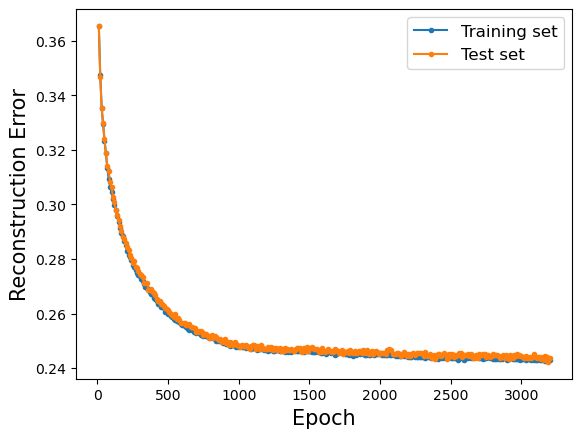

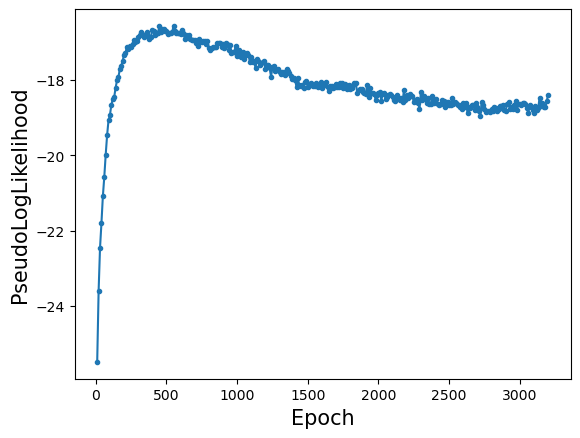

Training RBM 5/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366216 (train), 0.365823 (test), Pseud_Lik: -25.861375, Time: 1.175203, 
Ep 20, Rec er: 0.346671 (train), 0.347261 (test), Pseud_Lik: -23.489802, Time: 1.173419, 
Ep 30, Rec er: 0.335541 (train), 0.336597 (test), Pseud_Lik: -22.330193, Time: 1.187066, 
Ep 40, Rec er: 0.329573 (train), 0.331128 (test), Pseud_Lik: -21.774433, Time: 1.194771, 
Ep 50, Rec er: 0.324398 (train), 0.324750 (test), Pseud_Lik: -21.353208, Time: 1.202389, 
Ep 60, Rec er: 0.319848 (train), 0.321478 (test), Pseud_Lik: -20.793484, Time: 1.202616, 
Ep 70, Rec er: 0.315799 (train), 0.317672 (test), Pseud_Lik: -20.173476, Time: 1.209757, 
Ep 80, Rec er: 0.313032 (train), 0.312908 (test), Pseud_Lik: -19.533400, Time: 1.208135, 
Ep 90, Rec er: 0.309727 (train), 0.310591 (test), Pseud_Lik: -19.109928, Time: 1.211011, 
Ep 100, Rec er: 0.307227 (train), 0.308716 (test), Pseu

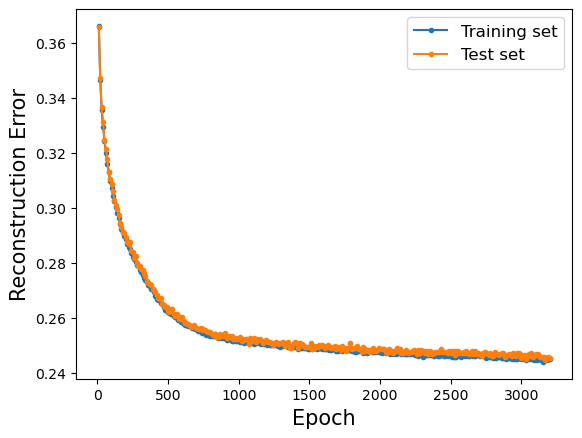

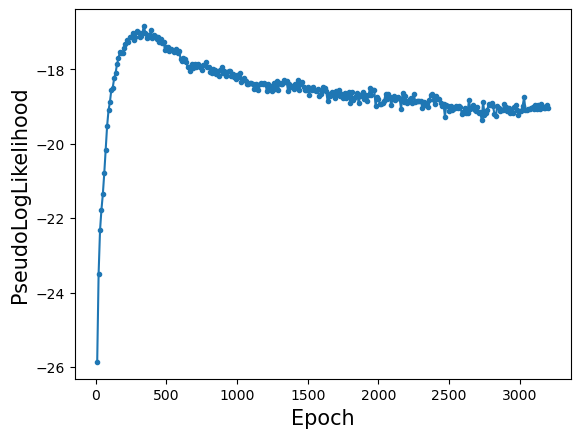

Training RBM 6/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366358 (train), 0.367897 (test), Pseud_Lik: -25.478578, Time: 1.165296, 
Ep 20, Rec er: 0.350870 (train), 0.351427 (test), Pseud_Lik: -23.691697, Time: 1.166922, 
Ep 30, Rec er: 0.336967 (train), 0.337508 (test), Pseud_Lik: -22.634737, Time: 1.177362, 
Ep 40, Rec er: 0.330434 (train), 0.330711 (test), Pseud_Lik: -22.047467, Time: 1.209335, 
Ep 50, Rec er: 0.324872 (train), 0.325744 (test), Pseud_Lik: -21.397063, Time: 1.214997, 
Ep 60, Rec er: 0.319504 (train), 0.320520 (test), Pseud_Lik: -20.853131, Time: 1.252430, 
Ep 70, Rec er: 0.314293 (train), 0.315170 (test), Pseud_Lik: -20.167779, Time: 1.241153, 
Ep 80, Rec er: 0.310153 (train), 0.309525 (test), Pseud_Lik: -19.521160, Time: 1.245407, 
Ep 90, Rec er: 0.306842 (train), 0.306936 (test), Pseud_Lik: -19.143415, Time: 1.238993, 
Ep 100, Rec er: 0.303505 (train), 0.304127 (test), Pseu

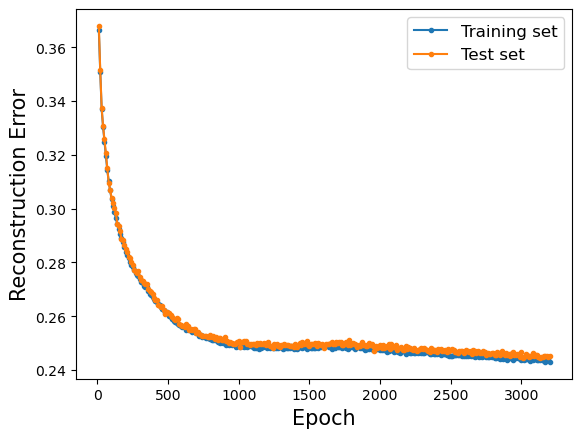

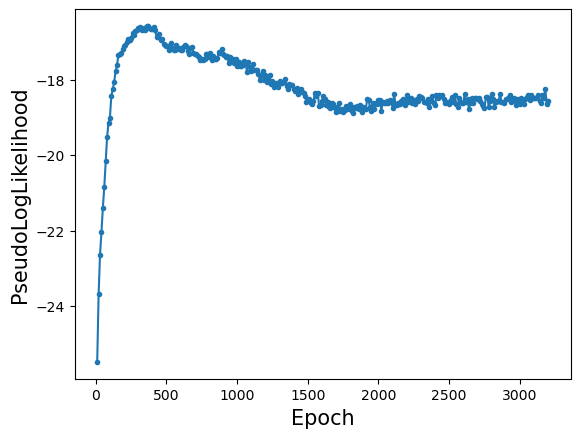

Training RBM 7/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366026 (train), 0.365003 (test), Pseud_Lik: -25.910618, Time: 1.179407, 
Ep 20, Rec er: 0.346445 (train), 0.347397 (test), Pseud_Lik: -23.587787, Time: 1.179965, 
Ep 30, Rec er: 0.335045 (train), 0.335300 (test), Pseud_Lik: -22.265644, Time: 1.188879, 
Ep 40, Rec er: 0.329141 (train), 0.331744 (test), Pseud_Lik: -21.563717, Time: 1.195296, 
Ep 50, Rec er: 0.323529 (train), 0.323916 (test), Pseud_Lik: -21.110979, Time: 1.203087, 
Ep 60, Rec er: 0.319226 (train), 0.320094 (test), Pseud_Lik: -20.626985, Time: 1.203742, 
Ep 70, Rec er: 0.315425 (train), 0.315758 (test), Pseud_Lik: -20.224817, Time: 1.213308, 
Ep 80, Rec er: 0.312721 (train), 0.313700 (test), Pseud_Lik: -19.689073, Time: 1.213431, 
Ep 90, Rec er: 0.310189 (train), 0.310395 (test), Pseud_Lik: -19.237957, Time: 1.224453, 
Ep 100, Rec er: 0.306952 (train), 0.307836 (test), Pseu

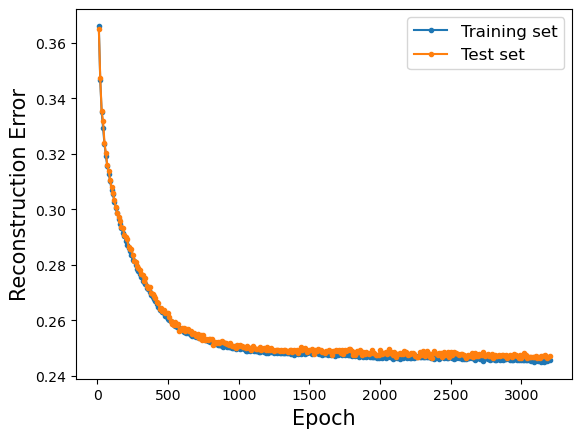

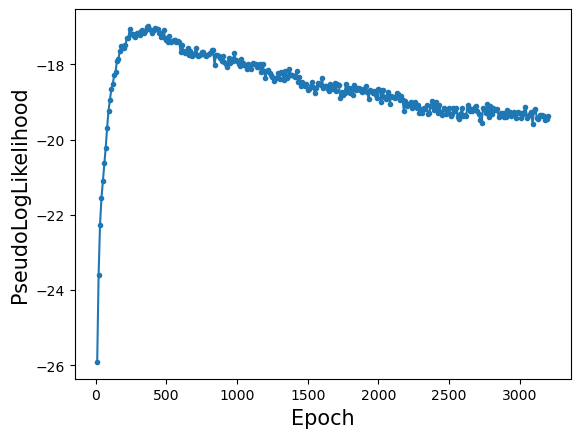

Training RBM 8/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365534 (train), 0.366291 (test), Pseud_Lik: -25.833413, Time: 1.177828, 
Ep 20, Rec er: 0.346556 (train), 0.345497 (test), Pseud_Lik: -23.490482, Time: 1.175893, 
Ep 30, Rec er: 0.335273 (train), 0.335498 (test), Pseud_Lik: -22.319517, Time: 1.195834, 
Ep 40, Rec er: 0.328993 (train), 0.330731 (test), Pseud_Lik: -21.691963, Time: 1.225149, 
Ep 50, Rec er: 0.323984 (train), 0.324372 (test), Pseud_Lik: -21.168947, Time: 1.210511, 
Ep 60, Rec er: 0.319809 (train), 0.320905 (test), Pseud_Lik: -20.556813, Time: 1.209581, 
Ep 70, Rec er: 0.316824 (train), 0.315784 (test), Pseud_Lik: -20.083514, Time: 1.210661, 
Ep 80, Rec er: 0.313079 (train), 0.314312 (test), Pseud_Lik: -19.569043, Time: 1.212211, 
Ep 90, Rec er: 0.310337 (train), 0.311011 (test), Pseud_Lik: -19.269033, Time: 1.218166, 
Ep 100, Rec er: 0.307775 (train), 0.308234 (test), Pseu

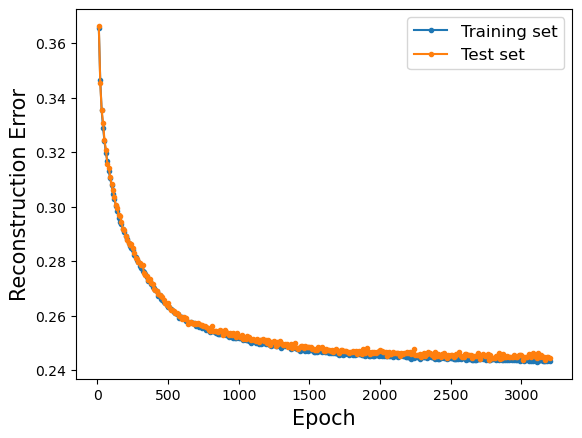

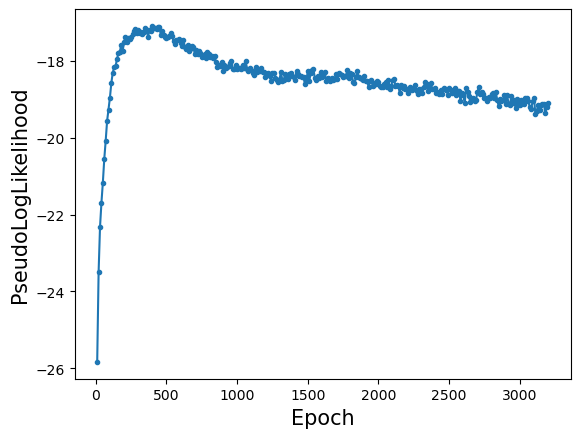

Training RBM 9/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365611 (train), 0.365711 (test), Pseud_Lik: -25.651391, Time: 1.178672, 
Ep 20, Rec er: 0.347778 (train), 0.347508 (test), Pseud_Lik: -23.634493, Time: 1.176337, 
Ep 30, Rec er: 0.335215 (train), 0.336508 (test), Pseud_Lik: -22.587666, Time: 1.198413, 
Ep 40, Rec er: 0.329969 (train), 0.330734 (test), Pseud_Lik: -21.836483, Time: 1.197340, 
Ep 50, Rec er: 0.324214 (train), 0.324750 (test), Pseud_Lik: -21.225373, Time: 1.202315, 
Ep 60, Rec er: 0.319022 (train), 0.320417 (test), Pseud_Lik: -20.501161, Time: 1.205848, 
Ep 70, Rec er: 0.314714 (train), 0.314625 (test), Pseud_Lik: -19.911894, Time: 1.209566, 
Ep 80, Rec er: 0.311143 (train), 0.311742 (test), Pseud_Lik: -19.566405, Time: 1.213960, 
Ep 90, Rec er: 0.308165 (train), 0.308736 (test), Pseud_Lik: -19.138612, Time: 1.213962, 
Ep 100, Rec er: 0.306295 (train), 0.306928 (test), Pseu

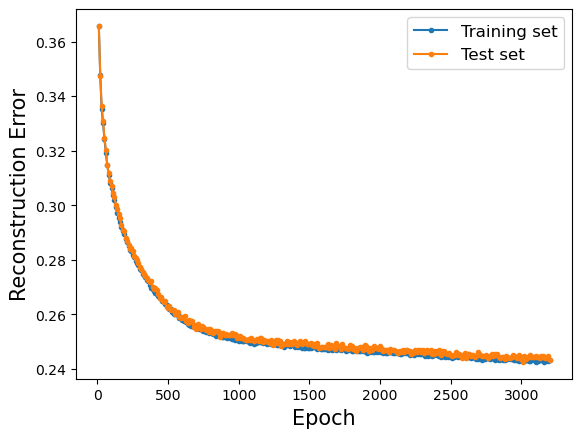

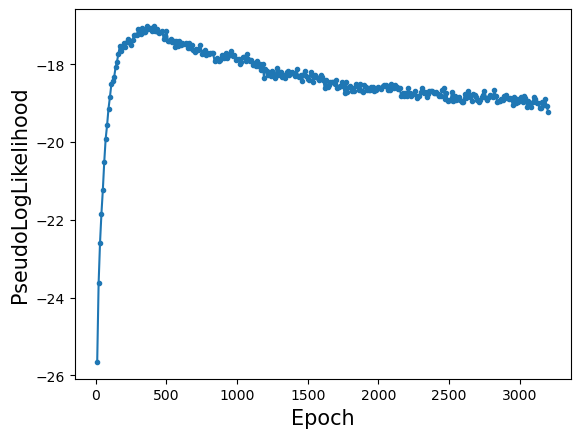

Training RBM 10/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365588 (train), 0.366445 (test), Pseud_Lik: -25.939892, Time: 1.181810, 
Ep 20, Rec er: 0.346670 (train), 0.346167 (test), Pseud_Lik: -23.640309, Time: 1.185610, 
Ep 30, Rec er: 0.335257 (train), 0.334698 (test), Pseud_Lik: -22.358966, Time: 1.191755, 
Ep 40, Rec er: 0.329550 (train), 0.330748 (test), Pseud_Lik: -21.668885, Time: 1.198508, 
Ep 50, Rec er: 0.324376 (train), 0.324584 (test), Pseud_Lik: -21.126017, Time: 1.210136, 
Ep 60, Rec er: 0.319913 (train), 0.321659 (test), Pseud_Lik: -20.482554, Time: 1.205598, 
Ep 70, Rec er: 0.316217 (train), 0.316611 (test), Pseud_Lik: -20.160905, Time: 1.210774, 
Ep 80, Rec er: 0.312630 (train), 0.313781 (test), Pseud_Lik: -19.604596, Time: 1.210501, 
Ep 90, Rec er: 0.310654 (train), 0.311503 (test), Pseud_Lik: -19.106049, Time: 1.216056, 
Ep 100, Rec er: 0.308029 (train), 0.308473 (test), Pse

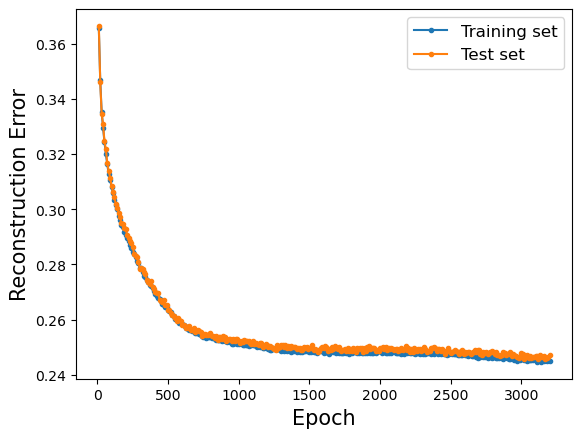

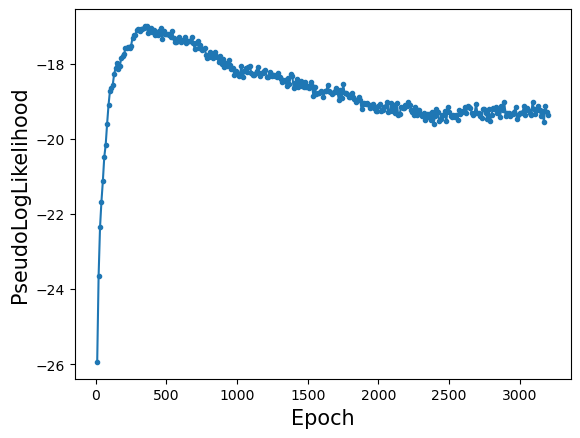

Training RBM 11/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365975 (train), 0.365831 (test), Pseud_Lik: -25.731159, Time: 1.169469, 
Ep 20, Rec er: 0.347689 (train), 0.347117 (test), Pseud_Lik: -23.541214, Time: 1.173456, 
Ep 30, Rec er: 0.335737 (train), 0.335697 (test), Pseud_Lik: -22.451849, Time: 1.184989, 
Ep 40, Rec er: 0.329432 (train), 0.329922 (test), Pseud_Lik: -21.747485, Time: 1.209056, 
Ep 50, Rec er: 0.322870 (train), 0.323478 (test), Pseud_Lik: -21.036733, Time: 1.221158, 
Ep 60, Rec er: 0.318296 (train), 0.317905 (test), Pseud_Lik: -20.430443, Time: 1.266450, 
Ep 70, Rec er: 0.313790 (train), 0.314737 (test), Pseud_Lik: -19.800971, Time: 1.254573, 
Ep 80, Rec er: 0.310500 (train), 0.311619 (test), Pseud_Lik: -19.394413, Time: 1.249841, 
Ep 90, Rec er: 0.307832 (train), 0.309289 (test), Pseud_Lik: -19.144957, Time: 1.243659, 
Ep 100, Rec er: 0.305513 (train), 0.305100 (test), Pse

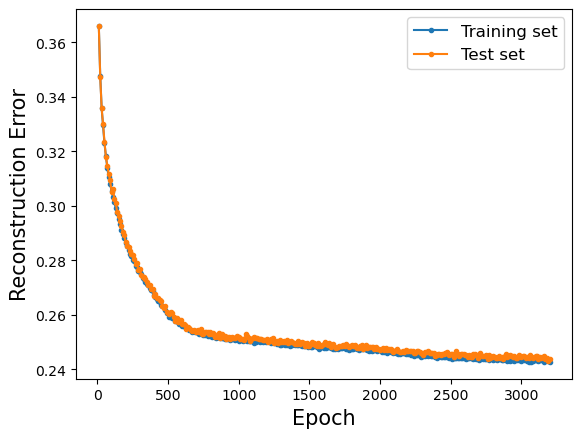

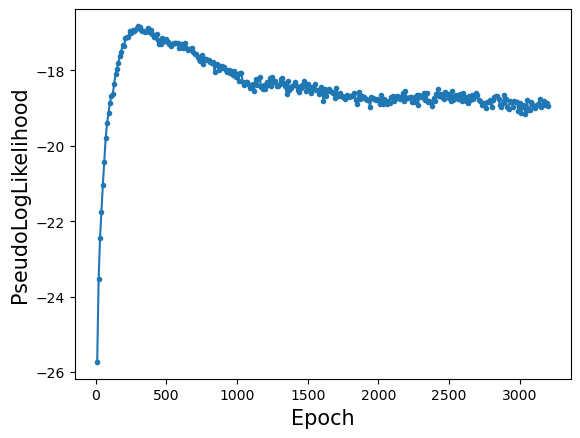

Training RBM 12/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366542 (train), 0.366367 (test), Pseud_Lik: -25.955938, Time: 1.170513, 
Ep 20, Rec er: 0.347548 (train), 0.346955 (test), Pseud_Lik: -23.640739, Time: 1.174181, 
Ep 30, Rec er: 0.336477 (train), 0.336819 (test), Pseud_Lik: -22.260730, Time: 1.187016, 
Ep 40, Rec er: 0.329227 (train), 0.332292 (test), Pseud_Lik: -21.366233, Time: 1.197340, 
Ep 50, Rec er: 0.324253 (train), 0.324808 (test), Pseud_Lik: -20.804304, Time: 1.205239, 
Ep 60, Rec er: 0.319702 (train), 0.320978 (test), Pseud_Lik: -20.402368, Time: 1.203672, 
Ep 70, Rec er: 0.316519 (train), 0.317392 (test), Pseud_Lik: -20.001853, Time: 1.202924, 
Ep 80, Rec er: 0.313875 (train), 0.314436 (test), Pseud_Lik: -19.616553, Time: 1.204435, 
Ep 90, Rec er: 0.311161 (train), 0.312408 (test), Pseud_Lik: -19.355206, Time: 1.203649, 
Ep 100, Rec er: 0.309484 (train), 0.310773 (test), Pse

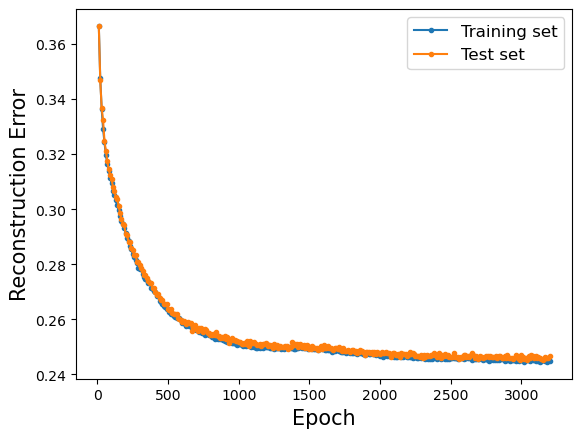

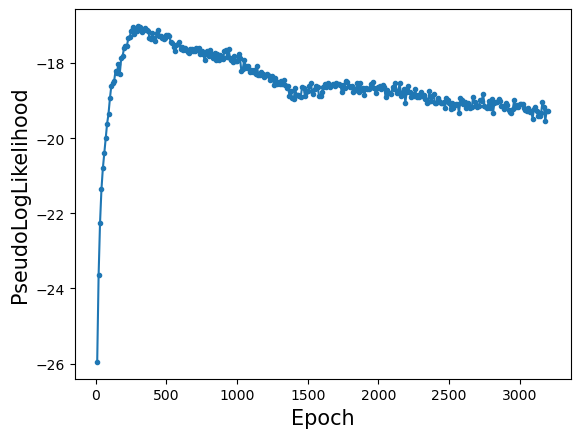

Training RBM 13/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365968 (train), 0.365305 (test), Pseud_Lik: -25.630075, Time: 1.174640, 
Ep 20, Rec er: 0.347349 (train), 0.346883 (test), Pseud_Lik: -23.574893, Time: 1.173780, 
Ep 30, Rec er: 0.334833 (train), 0.334586 (test), Pseud_Lik: -22.419726, Time: 1.189644, 
Ep 40, Rec er: 0.328588 (train), 0.328872 (test), Pseud_Lik: -21.689559, Time: 1.207351, 
Ep 50, Rec er: 0.323243 (train), 0.323561 (test), Pseud_Lik: -21.017842, Time: 1.214857, 
Ep 60, Rec er: 0.318013 (train), 0.317712 (test), Pseud_Lik: -20.572317, Time: 1.213524, 
Ep 70, Rec er: 0.314384 (train), 0.315087 (test), Pseud_Lik: -19.989684, Time: 1.211675, 
Ep 80, Rec er: 0.310155 (train), 0.311202 (test), Pseud_Lik: -19.580349, Time: 1.216369, 
Ep 90, Rec er: 0.307079 (train), 0.309058 (test), Pseud_Lik: -19.030838, Time: 1.218950, 
Ep 100, Rec er: 0.304800 (train), 0.305206 (test), Pse

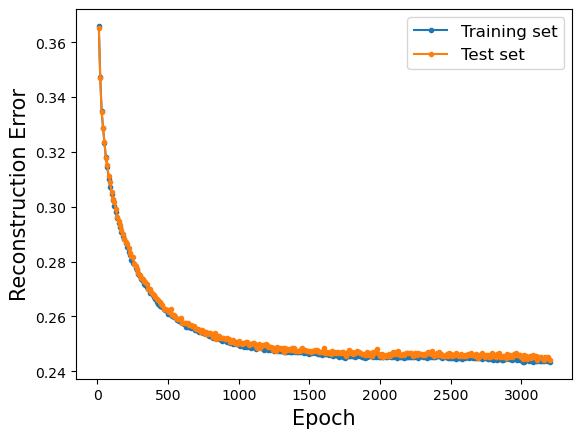

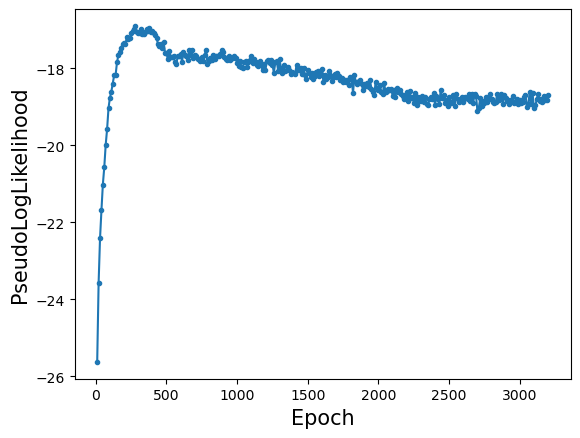

Training RBM 14/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366393 (train), 0.365113 (test), Pseud_Lik: -25.692910, Time: 1.171056, 
Ep 20, Rec er: 0.347491 (train), 0.347212 (test), Pseud_Lik: -23.574930, Time: 1.173926, 
Ep 30, Rec er: 0.334917 (train), 0.335219 (test), Pseud_Lik: -22.389667, Time: 1.187490, 
Ep 40, Rec er: 0.328526 (train), 0.329120 (test), Pseud_Lik: -21.583132, Time: 1.197548, 
Ep 50, Rec er: 0.323011 (train), 0.324205 (test), Pseud_Lik: -21.096162, Time: 1.206550, 
Ep 60, Rec er: 0.317799 (train), 0.318247 (test), Pseud_Lik: -20.616073, Time: 1.213266, 
Ep 70, Rec er: 0.313791 (train), 0.314581 (test), Pseud_Lik: -20.022488, Time: 1.220725, 
Ep 80, Rec er: 0.310915 (train), 0.311130 (test), Pseud_Lik: -19.420994, Time: 1.232276, 
Ep 90, Rec er: 0.307652 (train), 0.309097 (test), Pseud_Lik: -19.048203, Time: 1.220185, 
Ep 100, Rec er: 0.305083 (train), 0.305309 (test), Pse

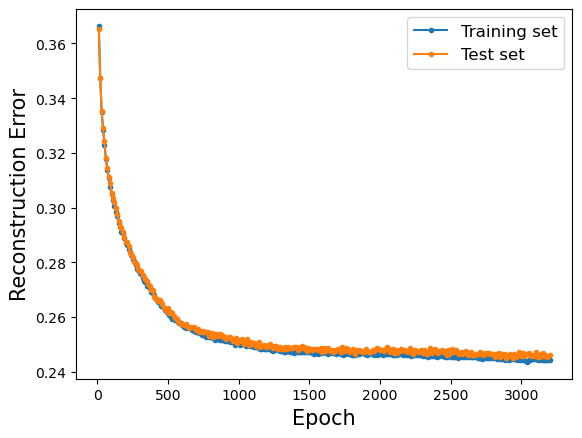

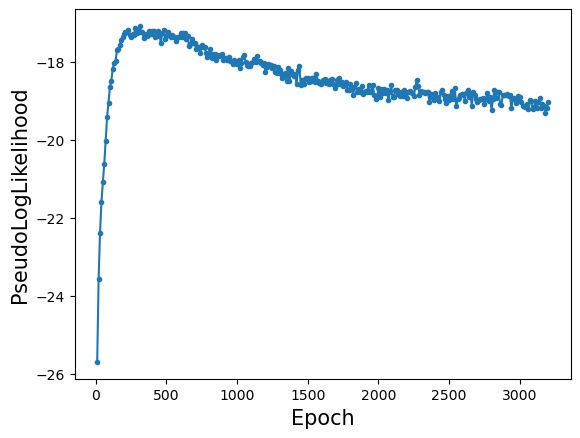

Training RBM 15/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365462 (train), 0.365891 (test), Pseud_Lik: -25.951625, Time: 1.187517, 
Ep 20, Rec er: 0.346712 (train), 0.345163 (test), Pseud_Lik: -23.624716, Time: 1.175960, 
Ep 30, Rec er: 0.335206 (train), 0.336636 (test), Pseud_Lik: -22.344615, Time: 1.188865, 
Ep 40, Rec er: 0.329577 (train), 0.329806 (test), Pseud_Lik: -21.874942, Time: 1.200828, 
Ep 50, Rec er: 0.324494 (train), 0.324892 (test), Pseud_Lik: -21.377491, Time: 1.202064, 
Ep 60, Rec er: 0.320083 (train), 0.321855 (test), Pseud_Lik: -20.949093, Time: 1.208077, 
Ep 70, Rec er: 0.316036 (train), 0.316286 (test), Pseud_Lik: -20.399907, Time: 1.215704, 
Ep 80, Rec er: 0.312739 (train), 0.313091 (test), Pseud_Lik: -19.915970, Time: 1.213699, 
Ep 90, Rec er: 0.309753 (train), 0.310269 (test), Pseud_Lik: -19.333895, Time: 1.215559, 
Ep 100, Rec er: 0.306414 (train), 0.307772 (test), Pse

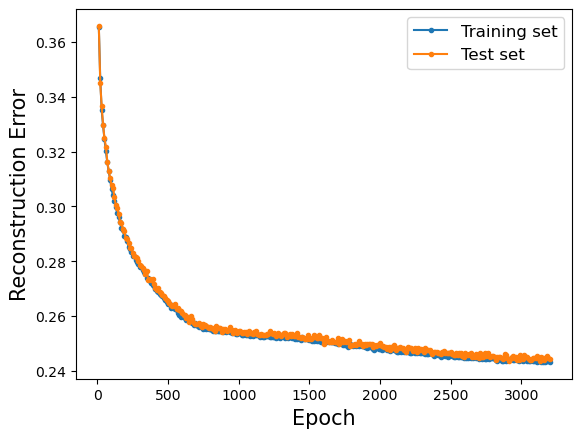

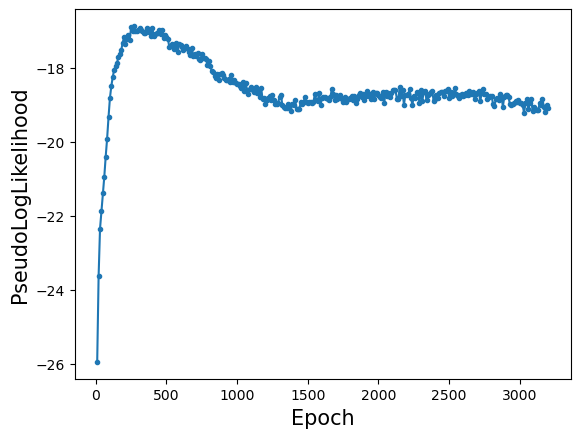

Training RBM 16/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365941 (train), 0.365711 (test), Pseud_Lik: -25.926234, Time: 1.171672, 
Ep 20, Rec er: 0.346864 (train), 0.345616 (test), Pseud_Lik: -23.508822, Time: 1.170552, 
Ep 30, Rec er: 0.335902 (train), 0.336255 (test), Pseud_Lik: -22.285454, Time: 1.189002, 
Ep 40, Rec er: 0.329843 (train), 0.330802 (test), Pseud_Lik: -21.811230, Time: 1.192992, 
Ep 50, Rec er: 0.324442 (train), 0.324648 (test), Pseud_Lik: -21.193514, Time: 1.201839, 
Ep 60, Rec er: 0.319845 (train), 0.319759 (test), Pseud_Lik: -20.548647, Time: 1.244451, 
Ep 70, Rec er: 0.315951 (train), 0.316122 (test), Pseud_Lik: -20.017340, Time: 1.244111, 
Ep 80, Rec er: 0.313048 (train), 0.313200 (test), Pseud_Lik: -19.545864, Time: 1.268779, 
Ep 90, Rec er: 0.310437 (train), 0.310772 (test), Pseud_Lik: -19.225357, Time: 1.253797, 
Ep 100, Rec er: 0.307866 (train), 0.309075 (test), Pse

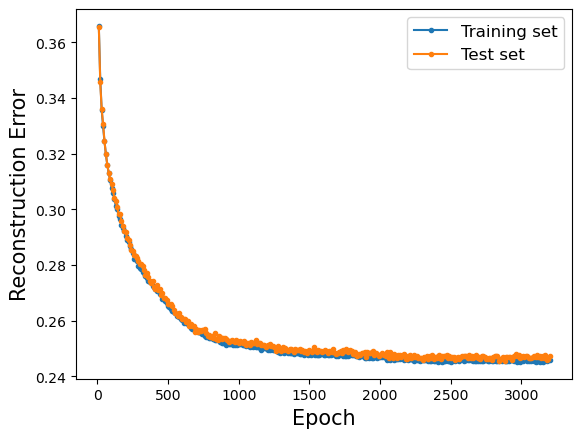

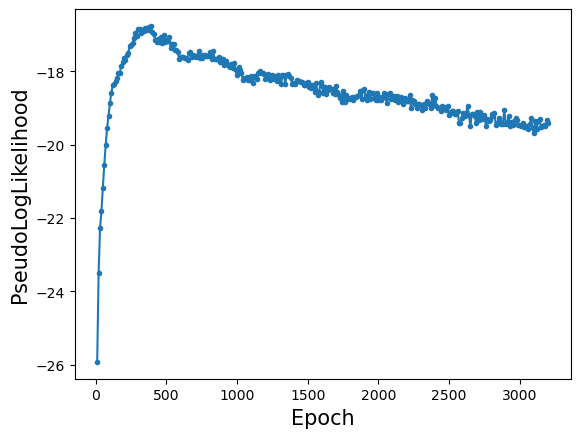

Training RBM 17/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.364761 (train), 0.364962 (test), Pseud_Lik: -25.226953, Time: 1.173021, 
Ep 20, Rec er: 0.351541 (train), 0.350863 (test), Pseud_Lik: -23.717848, Time: 1.167479, 
Ep 30, Rec er: 0.336714 (train), 0.335936 (test), Pseud_Lik: -22.587603, Time: 1.191362, 
Ep 40, Rec er: 0.328099 (train), 0.328373 (test), Pseud_Lik: -21.816859, Time: 1.191860, 
Ep 50, Rec er: 0.322906 (train), 0.323462 (test), Pseud_Lik: -21.327770, Time: 1.196833, 
Ep 60, Rec er: 0.316589 (train), 0.316213 (test), Pseud_Lik: -20.772225, Time: 1.202703, 
Ep 70, Rec er: 0.312204 (train), 0.312072 (test), Pseud_Lik: -20.134596, Time: 1.205086, 
Ep 80, Rec er: 0.307933 (train), 0.309397 (test), Pseud_Lik: -19.341191, Time: 1.212212, 
Ep 90, Rec er: 0.305348 (train), 0.305795 (test), Pseud_Lik: -19.086526, Time: 1.213516, 
Ep 100, Rec er: 0.302494 (train), 0.302934 (test), Pse

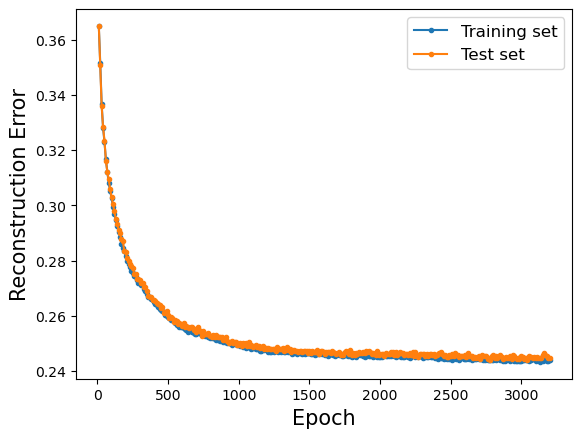

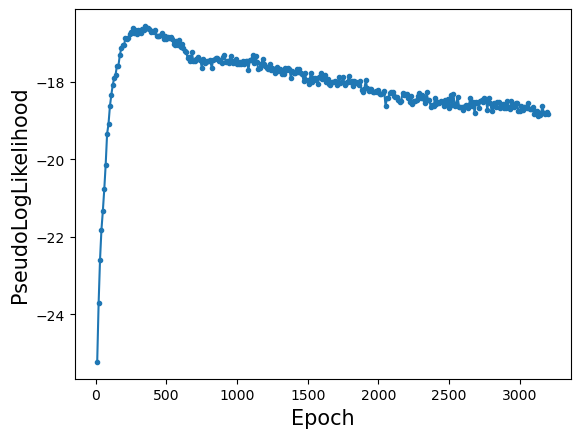

Training RBM 18/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366513 (train), 0.364994 (test), Pseud_Lik: -25.793521, Time: 1.173552, 
Ep 20, Rec er: 0.348653 (train), 0.347161 (test), Pseud_Lik: -23.661979, Time: 1.178865, 
Ep 30, Rec er: 0.334946 (train), 0.335917 (test), Pseud_Lik: -22.290276, Time: 1.207596, 
Ep 40, Rec er: 0.329172 (train), 0.329156 (test), Pseud_Lik: -21.602451, Time: 1.213866, 
Ep 50, Rec er: 0.323432 (train), 0.324244 (test), Pseud_Lik: -21.328210, Time: 1.206846, 
Ep 60, Rec er: 0.319225 (train), 0.320034 (test), Pseud_Lik: -20.710465, Time: 1.211539, 
Ep 70, Rec er: 0.315506 (train), 0.316609 (test), Pseud_Lik: -20.019794, Time: 1.209223, 
Ep 80, Rec er: 0.311973 (train), 0.313061 (test), Pseud_Lik: -19.733536, Time: 1.211779, 
Ep 90, Rec er: 0.309315 (train), 0.309994 (test), Pseud_Lik: -19.503959, Time: 1.213427, 
Ep 100, Rec er: 0.306519 (train), 0.307783 (test), Pse

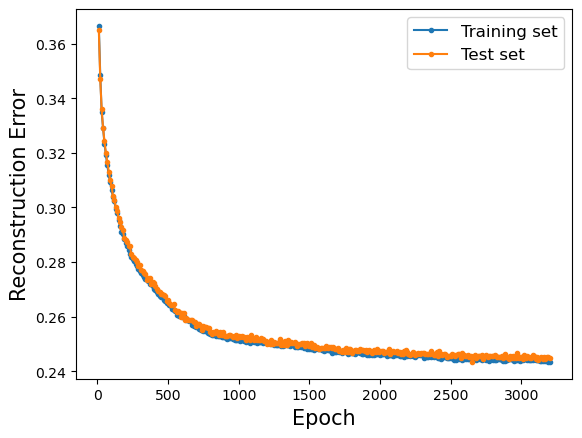

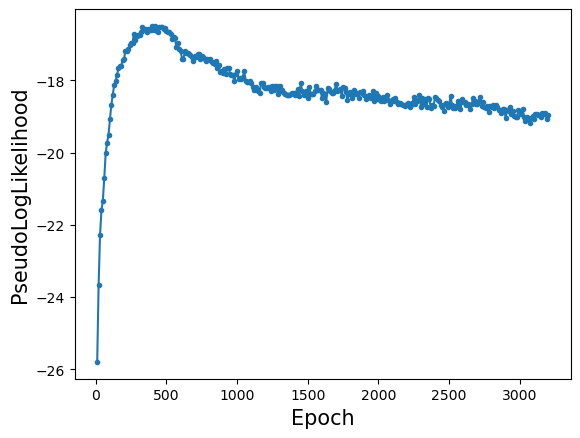

Training RBM 19/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366127 (train), 0.365266 (test), Pseud_Lik: -25.778531, Time: 1.180286, 
Ep 20, Rec er: 0.347681 (train), 0.346733 (test), Pseud_Lik: -23.625495, Time: 1.178512, 
Ep 30, Rec er: 0.335038 (train), 0.334717 (test), Pseud_Lik: -22.365018, Time: 1.185610, 
Ep 40, Rec er: 0.328947 (train), 0.328705 (test), Pseud_Lik: -21.622300, Time: 1.201153, 
Ep 50, Rec er: 0.322892 (train), 0.323658 (test), Pseud_Lik: -21.027488, Time: 1.201530, 
Ep 60, Rec er: 0.318607 (train), 0.319314 (test), Pseud_Lik: -20.457002, Time: 1.202769, 
Ep 70, Rec er: 0.314902 (train), 0.315322 (test), Pseud_Lik: -19.913810, Time: 1.203943, 
Ep 80, Rec er: 0.311342 (train), 0.312261 (test), Pseud_Lik: -19.390501, Time: 1.207560, 
Ep 90, Rec er: 0.309023 (train), 0.309900 (test), Pseud_Lik: -19.003047, Time: 1.219006, 
Ep 100, Rec er: 0.306850 (train), 0.306731 (test), Pse

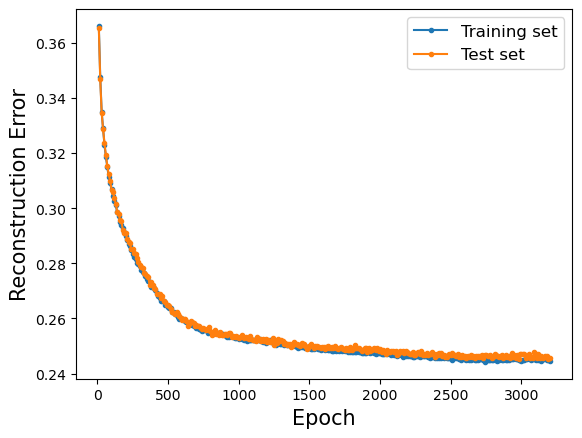

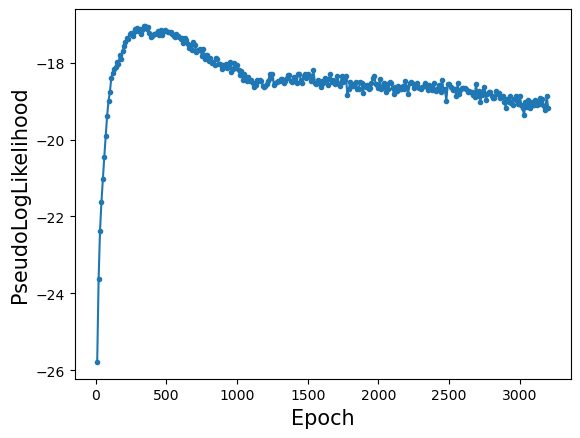

Training RBM 20/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366059 (train), 0.365661 (test), Pseud_Lik: -25.596898, Time: 1.170000, 
Ep 20, Rec er: 0.348164 (train), 0.347059 (test), Pseud_Lik: -23.530700, Time: 1.168985, 
Ep 30, Rec er: 0.334719 (train), 0.335919 (test), Pseud_Lik: -22.319788, Time: 1.189024, 
Ep 40, Rec er: 0.329486 (train), 0.330559 (test), Pseud_Lik: -21.608300, Time: 1.189341, 
Ep 50, Rec er: 0.324598 (train), 0.324998 (test), Pseud_Lik: -21.132183, Time: 1.194944, 
Ep 60, Rec er: 0.319687 (train), 0.319308 (test), Pseud_Lik: -20.816077, Time: 1.199884, 
Ep 70, Rec er: 0.314927 (train), 0.316580 (test), Pseud_Lik: -20.328941, Time: 1.204943, 
Ep 80, Rec er: 0.311823 (train), 0.312297 (test), Pseud_Lik: -19.886967, Time: 1.207396, 
Ep 90, Rec er: 0.308466 (train), 0.309753 (test), Pseud_Lik: -19.428700, Time: 1.207194, 
Ep 100, Rec er: 0.306082 (train), 0.307000 (test), Pse

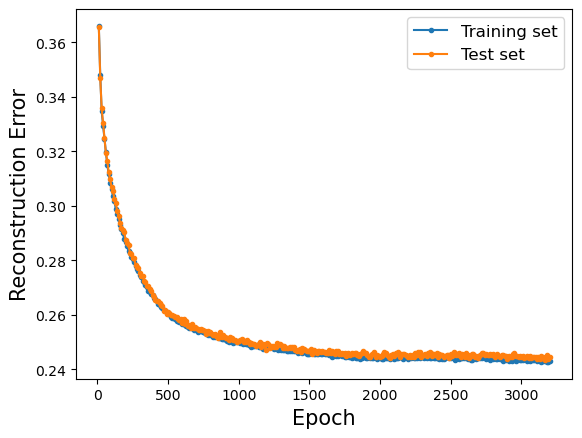

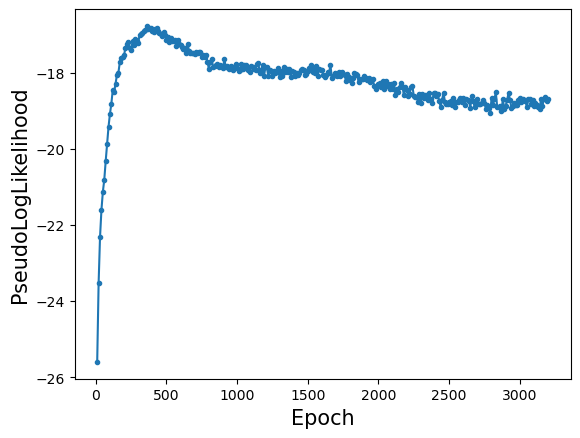

Training RBM 21/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366306 (train), 0.366280 (test), Pseud_Lik: -25.813291, Time: 1.173108, 
Ep 20, Rec er: 0.346254 (train), 0.345853 (test), Pseud_Lik: -23.537377, Time: 1.182429, 
Ep 30, Rec er: 0.334536 (train), 0.334592 (test), Pseud_Lik: -22.214716, Time: 1.194461, 
Ep 40, Rec er: 0.329192 (train), 0.330380 (test), Pseud_Lik: -21.546281, Time: 1.216638, 
Ep 50, Rec er: 0.324387 (train), 0.325292 (test), Pseud_Lik: -21.040330, Time: 1.234459, 
Ep 60, Rec er: 0.320554 (train), 0.321317 (test), Pseud_Lik: -20.617066, Time: 1.209878, 
Ep 70, Rec er: 0.317641 (train), 0.318966 (test), Pseud_Lik: -20.289959, Time: 1.232018, 
Ep 80, Rec er: 0.314623 (train), 0.316427 (test), Pseud_Lik: -20.012403, Time: 1.243968, 
Ep 90, Rec er: 0.312713 (train), 0.314319 (test), Pseud_Lik: -19.656192, Time: 1.251985, 
Ep 100, Rec er: 0.310248 (train), 0.310625 (test), Pse

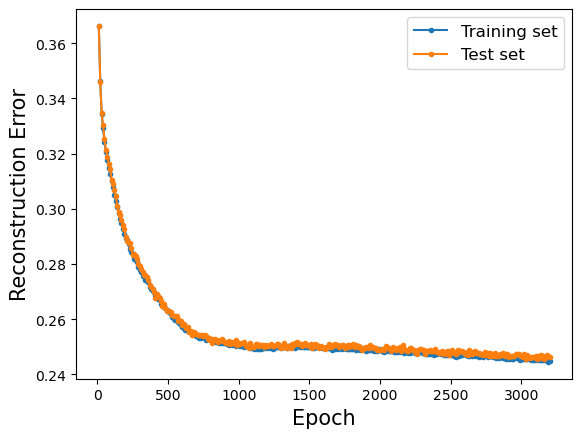

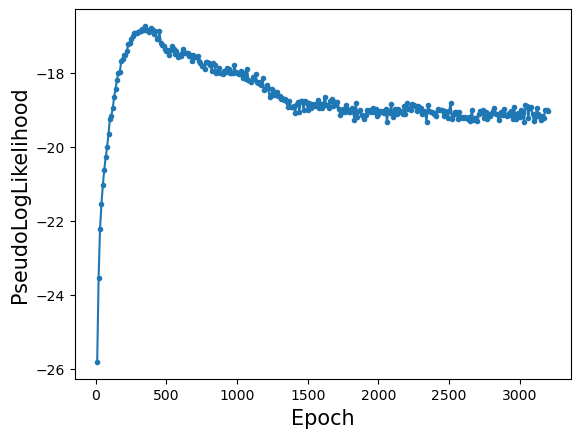

Training RBM 22/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365634 (train), 0.365206 (test), Pseud_Lik: -25.625079, Time: 1.173150, 
Ep 20, Rec er: 0.349994 (train), 0.350353 (test), Pseud_Lik: -23.611995, Time: 1.172731, 
Ep 30, Rec er: 0.336538 (train), 0.336230 (test), Pseud_Lik: -22.531490, Time: 1.185950, 
Ep 40, Rec er: 0.329927 (train), 0.330033 (test), Pseud_Lik: -21.684110, Time: 1.201484, 
Ep 50, Rec er: 0.323359 (train), 0.324119 (test), Pseud_Lik: -21.296022, Time: 1.210312, 
Ep 60, Rec er: 0.318835 (train), 0.319150 (test), Pseud_Lik: -20.856755, Time: 1.206255, 
Ep 70, Rec er: 0.314945 (train), 0.315405 (test), Pseud_Lik: -20.294905, Time: 1.231256, 
Ep 80, Rec er: 0.311492 (train), 0.312802 (test), Pseud_Lik: -19.777047, Time: 1.210143, 
Ep 90, Rec er: 0.308579 (train), 0.309573 (test), Pseud_Lik: -19.302929, Time: 1.215555, 
Ep 100, Rec er: 0.306307 (train), 0.308070 (test), Pse

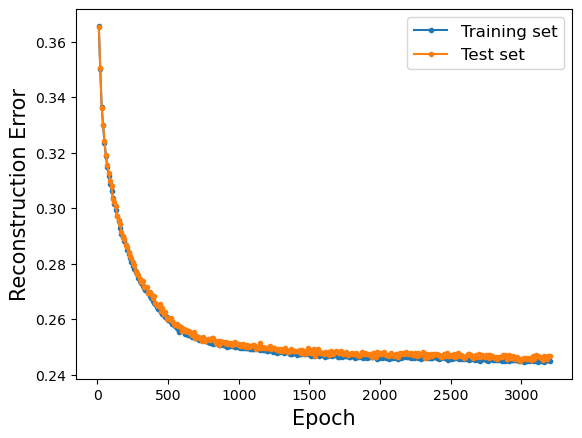

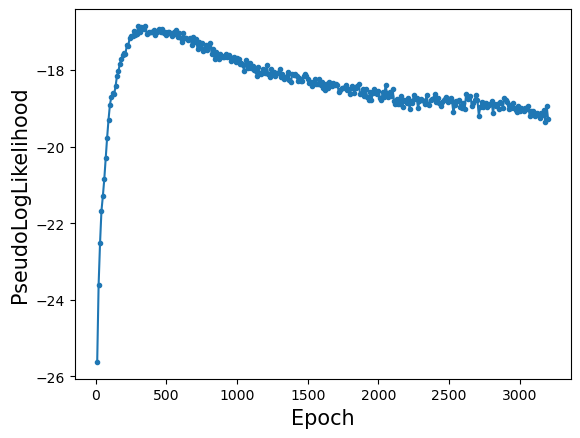

Training RBM 23/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365877 (train), 0.366303 (test), Pseud_Lik: -25.645662, Time: 1.178805, 
Ep 20, Rec er: 0.347985 (train), 0.347236 (test), Pseud_Lik: -23.679000, Time: 1.172628, 
Ep 30, Rec er: 0.335942 (train), 0.335908 (test), Pseud_Lik: -22.407583, Time: 1.189278, 
Ep 40, Rec er: 0.329432 (train), 0.329970 (test), Pseud_Lik: -21.870547, Time: 1.195594, 
Ep 50, Rec er: 0.323892 (train), 0.324508 (test), Pseud_Lik: -21.134940, Time: 1.200430, 
Ep 60, Rec er: 0.318830 (train), 0.319442 (test), Pseud_Lik: -20.468958, Time: 1.202779, 
Ep 70, Rec er: 0.314467 (train), 0.315300 (test), Pseud_Lik: -19.953573, Time: 1.205517, 
Ep 80, Rec er: 0.311110 (train), 0.311402 (test), Pseud_Lik: -19.441384, Time: 1.211395, 
Ep 90, Rec er: 0.308059 (train), 0.308895 (test), Pseud_Lik: -19.076855, Time: 1.210579, 
Ep 100, Rec er: 0.305371 (train), 0.307033 (test), Pse

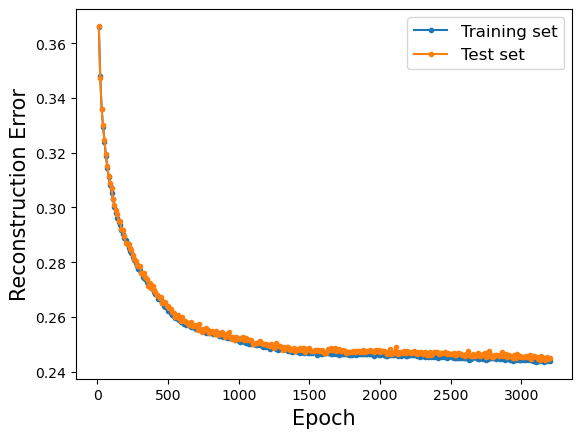

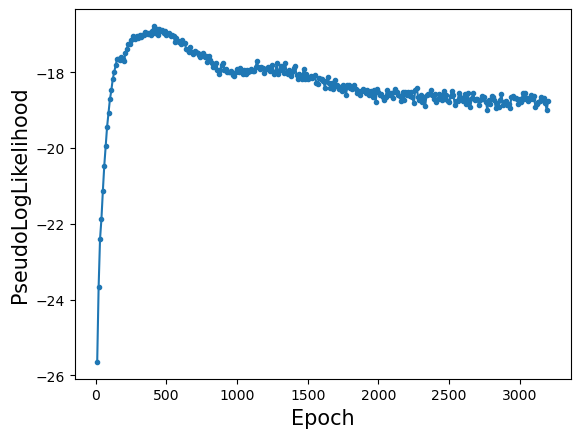

Training RBM 24/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365445 (train), 0.365438 (test), Pseud_Lik: -25.867491, Time: 1.173328, 
Ep 20, Rec er: 0.345757 (train), 0.345686 (test), Pseud_Lik: -23.503440, Time: 1.175630, 
Ep 30, Rec er: 0.334798 (train), 0.335853 (test), Pseud_Lik: -22.306582, Time: 1.190455, 
Ep 40, Rec er: 0.329132 (train), 0.329944 (test), Pseud_Lik: -21.650794, Time: 1.196363, 
Ep 50, Rec er: 0.324812 (train), 0.325538 (test), Pseud_Lik: -21.139117, Time: 1.202435, 
Ep 60, Rec er: 0.320355 (train), 0.320705 (test), Pseud_Lik: -20.716580, Time: 1.208445, 
Ep 70, Rec er: 0.317161 (train), 0.318639 (test), Pseud_Lik: -20.318130, Time: 1.237625, 
Ep 80, Rec er: 0.313484 (train), 0.313780 (test), Pseud_Lik: -19.752500, Time: 1.250198, 
Ep 90, Rec er: 0.310454 (train), 0.312620 (test), Pseud_Lik: -19.401649, Time: 1.217868, 
Ep 100, Rec er: 0.307651 (train), 0.309019 (test), Pse

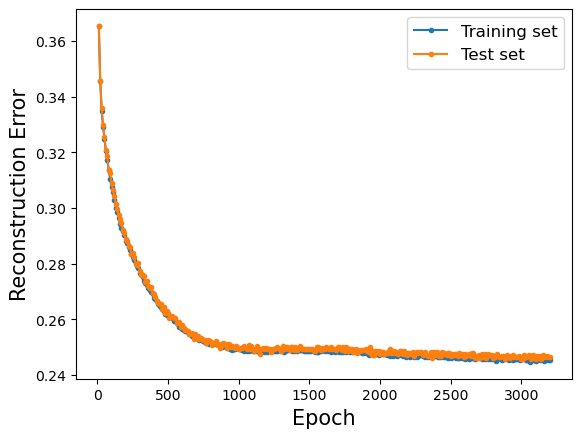

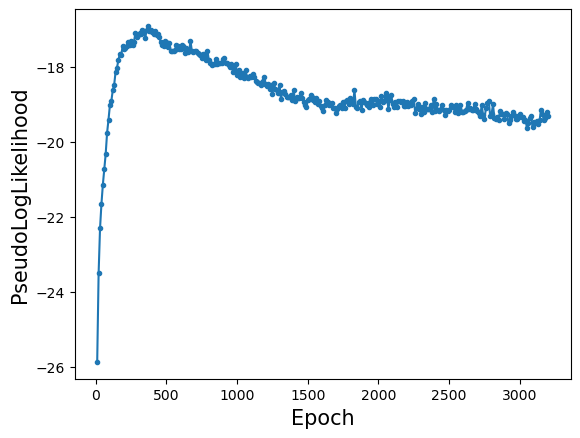

Training RBM 25/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365615 (train), 0.364922 (test), Pseud_Lik: -25.745800, Time: 1.173209, 
Ep 20, Rec er: 0.347678 (train), 0.347995 (test), Pseud_Lik: -23.574800, Time: 1.170104, 
Ep 30, Rec er: 0.335108 (train), 0.336656 (test), Pseud_Lik: -22.389612, Time: 1.187867, 
Ep 40, Rec er: 0.329595 (train), 0.330423 (test), Pseud_Lik: -21.737856, Time: 1.196316, 
Ep 50, Rec er: 0.324093 (train), 0.324483 (test), Pseud_Lik: -21.138891, Time: 1.200965, 
Ep 60, Rec er: 0.319814 (train), 0.319827 (test), Pseud_Lik: -20.843754, Time: 1.210237, 
Ep 70, Rec er: 0.314922 (train), 0.315808 (test), Pseud_Lik: -20.350089, Time: 1.208277, 
Ep 80, Rec er: 0.311595 (train), 0.312208 (test), Pseud_Lik: -19.859580, Time: 1.212535, 
Ep 90, Rec er: 0.308682 (train), 0.309422 (test), Pseud_Lik: -19.491339, Time: 1.212780, 
Ep 100, Rec er: 0.306180 (train), 0.307723 (test), Pse

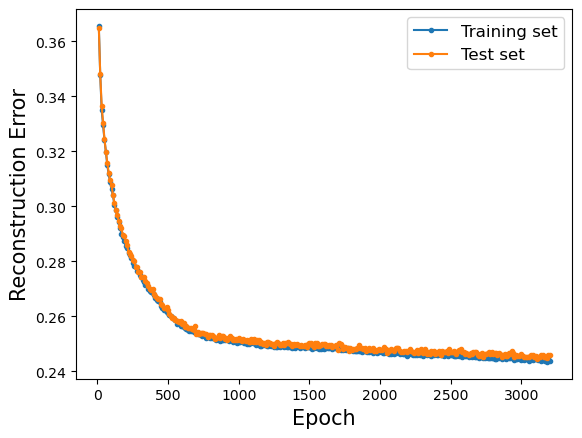

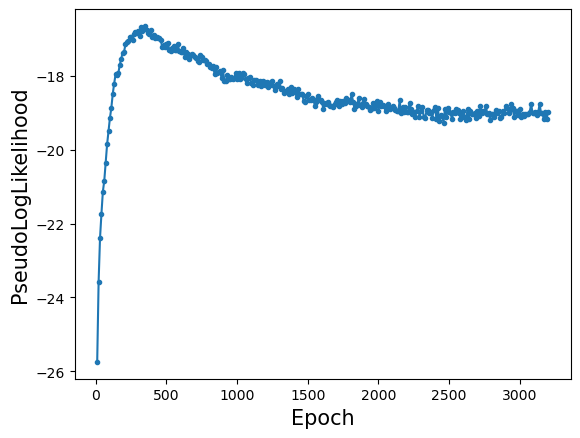

Training RBM 26/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365896 (train), 0.365813 (test), Pseud_Lik: -26.012884, Time: 1.179076, 
Ep 20, Rec er: 0.345978 (train), 0.346422 (test), Pseud_Lik: -23.529704, Time: 1.195147, 
Ep 30, Rec er: 0.335469 (train), 0.334620 (test), Pseud_Lik: -22.287763, Time: 1.222347, 
Ep 40, Rec er: 0.329188 (train), 0.330091 (test), Pseud_Lik: -21.500431, Time: 1.207331, 
Ep 50, Rec er: 0.323856 (train), 0.325080 (test), Pseud_Lik: -20.955760, Time: 1.214769, 
Ep 60, Rec er: 0.320088 (train), 0.320908 (test), Pseud_Lik: -20.472729, Time: 1.215259, 
Ep 70, Rec er: 0.315620 (train), 0.317028 (test), Pseud_Lik: -19.887215, Time: 1.211510, 
Ep 80, Rec er: 0.312427 (train), 0.313611 (test), Pseud_Lik: -19.542891, Time: 1.209035, 
Ep 90, Rec er: 0.310569 (train), 0.312037 (test), Pseud_Lik: -19.121767, Time: 1.228557, 
Ep 100, Rec er: 0.308044 (train), 0.308936 (test), Pse

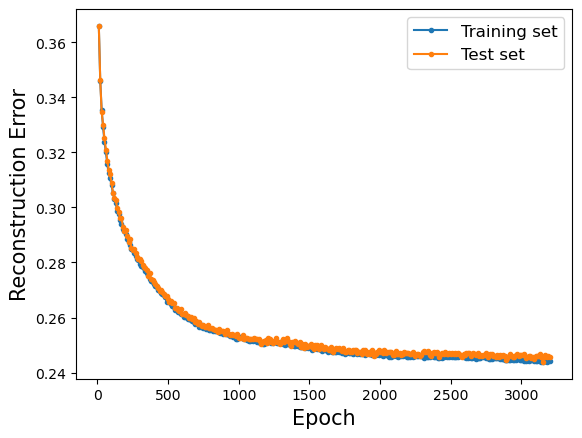

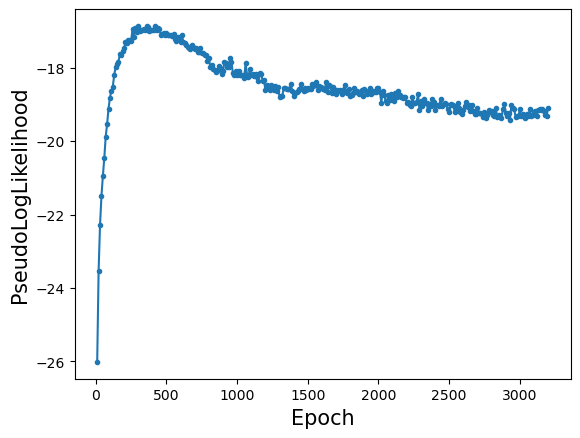

Training RBM 27/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365252 (train), 0.365300 (test), Pseud_Lik: -25.556783, Time: 1.174692, 
Ep 20, Rec er: 0.346125 (train), 0.346078 (test), Pseud_Lik: -23.629491, Time: 1.175293, 
Ep 30, Rec er: 0.334837 (train), 0.334750 (test), Pseud_Lik: -22.442138, Time: 1.185447, 
Ep 40, Rec er: 0.329690 (train), 0.329220 (test), Pseud_Lik: -21.829298, Time: 1.190983, 
Ep 50, Rec er: 0.323774 (train), 0.324602 (test), Pseud_Lik: -21.163083, Time: 1.197936, 
Ep 60, Rec er: 0.318495 (train), 0.319834 (test), Pseud_Lik: -20.572589, Time: 1.238565, 
Ep 70, Rec er: 0.313746 (train), 0.314142 (test), Pseud_Lik: -20.096868, Time: 1.225518, 
Ep 80, Rec er: 0.309763 (train), 0.310858 (test), Pseud_Lik: -19.634170, Time: 1.210035, 
Ep 90, Rec er: 0.307051 (train), 0.307992 (test), Pseud_Lik: -19.207903, Time: 1.209418, 
Ep 100, Rec er: 0.304377 (train), 0.305056 (test), Pse

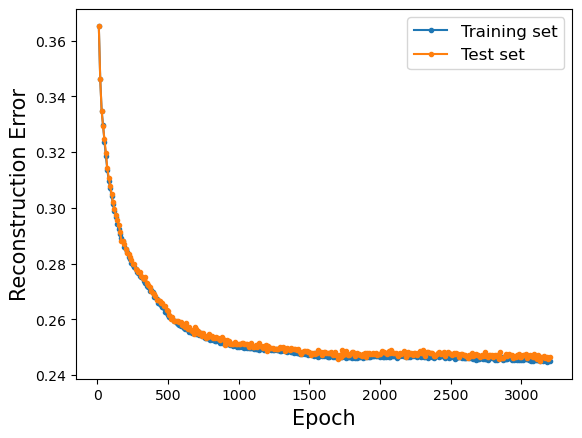

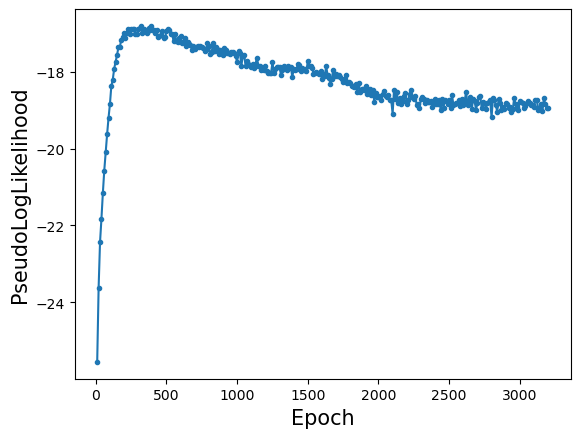

Training RBM 28/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365367 (train), 0.364419 (test), Pseud_Lik: -25.553686, Time: 1.180633, 
Ep 20, Rec er: 0.347646 (train), 0.347628 (test), Pseud_Lik: -23.492647, Time: 1.171760, 
Ep 30, Rec er: 0.335677 (train), 0.334906 (test), Pseud_Lik: -22.560262, Time: 1.184666, 
Ep 40, Rec er: 0.329289 (train), 0.329008 (test), Pseud_Lik: -21.857214, Time: 1.200165, 
Ep 50, Rec er: 0.323229 (train), 0.324406 (test), Pseud_Lik: -21.296248, Time: 1.202739, 
Ep 60, Rec er: 0.317688 (train), 0.317448 (test), Pseud_Lik: -20.556884, Time: 1.202892, 
Ep 70, Rec er: 0.313073 (train), 0.313725 (test), Pseud_Lik: -19.877924, Time: 1.211690, 
Ep 80, Rec er: 0.309648 (train), 0.310350 (test), Pseud_Lik: -19.269608, Time: 1.214043, 
Ep 90, Rec er: 0.306354 (train), 0.307014 (test), Pseud_Lik: -18.809046, Time: 1.219511, 
Ep 100, Rec er: 0.304153 (train), 0.305883 (test), Pse

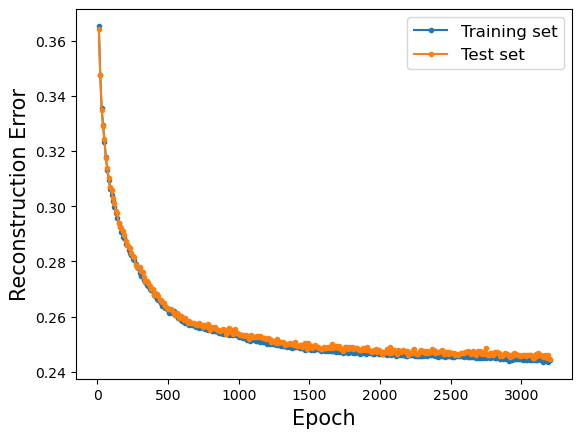

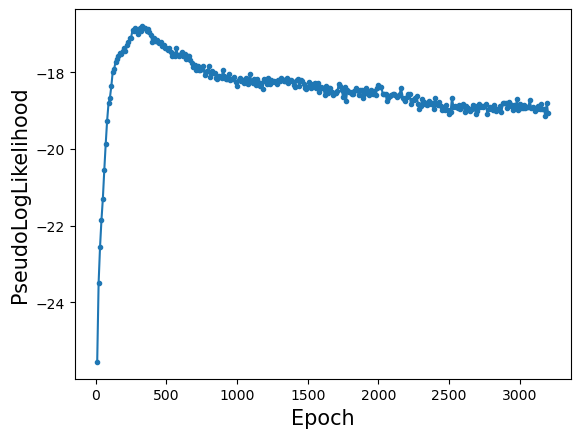

Training RBM 29/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366975 (train), 0.367141 (test), Pseud_Lik: -25.663901, Time: 1.167774, 
Ep 20, Rec er: 0.350030 (train), 0.349838 (test), Pseud_Lik: -23.713403, Time: 1.170021, 
Ep 30, Rec er: 0.336089 (train), 0.336000 (test), Pseud_Lik: -22.391110, Time: 1.185997, 
Ep 40, Rec er: 0.329934 (train), 0.330134 (test), Pseud_Lik: -21.956700, Time: 1.196525, 
Ep 50, Rec er: 0.324855 (train), 0.324689 (test), Pseud_Lik: -21.546994, Time: 1.202894, 
Ep 60, Rec er: 0.320197 (train), 0.319814 (test), Pseud_Lik: -21.130387, Time: 1.206783, 
Ep 70, Rec er: 0.315154 (train), 0.316347 (test), Pseud_Lik: -20.593165, Time: 1.205717, 
Ep 80, Rec er: 0.311234 (train), 0.313609 (test), Pseud_Lik: -20.093692, Time: 1.215148, 
Ep 90, Rec er: 0.307760 (train), 0.310086 (test), Pseud_Lik: -19.720691, Time: 1.217807, 
Ep 100, Rec er: 0.305428 (train), 0.306200 (test), Pse

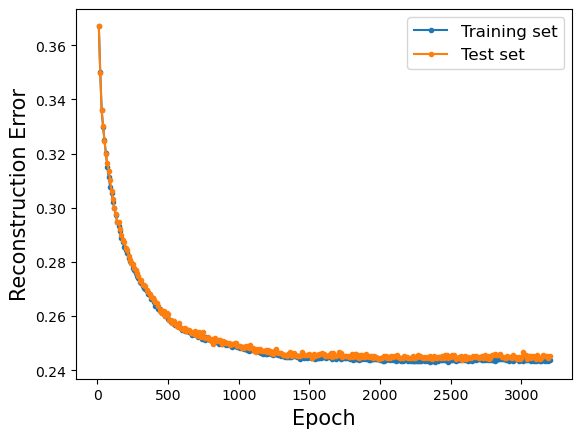

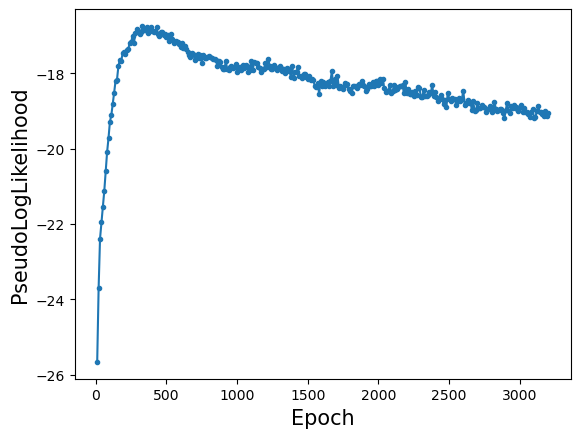

Training RBM 30/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.364940 (train), 0.365492 (test), Pseud_Lik: -25.592195, Time: 1.178930, 
Ep 20, Rec er: 0.346706 (train), 0.347875 (test), Pseud_Lik: -23.576439, Time: 1.175504, 
Ep 30, Rec er: 0.334909 (train), 0.335427 (test), Pseud_Lik: -22.300287, Time: 1.187099, 
Ep 40, Rec er: 0.327832 (train), 0.329013 (test), Pseud_Lik: -21.502084, Time: 1.195941, 
Ep 50, Rec er: 0.322387 (train), 0.322802 (test), Pseud_Lik: -20.935304, Time: 1.197477, 
Ep 60, Rec er: 0.317486 (train), 0.318508 (test), Pseud_Lik: -20.298953, Time: 1.205875, 
Ep 70, Rec er: 0.313616 (train), 0.315222 (test), Pseud_Lik: -19.769160, Time: 1.207751, 
Ep 80, Rec er: 0.310516 (train), 0.311308 (test), Pseud_Lik: -19.335659, Time: 1.209511, 
Ep 90, Rec er: 0.307373 (train), 0.307825 (test), Pseud_Lik: -19.123444, Time: 1.236989, 
Ep 100, Rec er: 0.304846 (train), 0.305830 (test), Pse

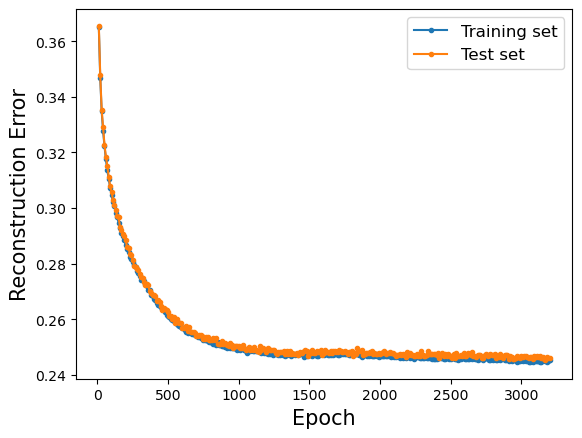

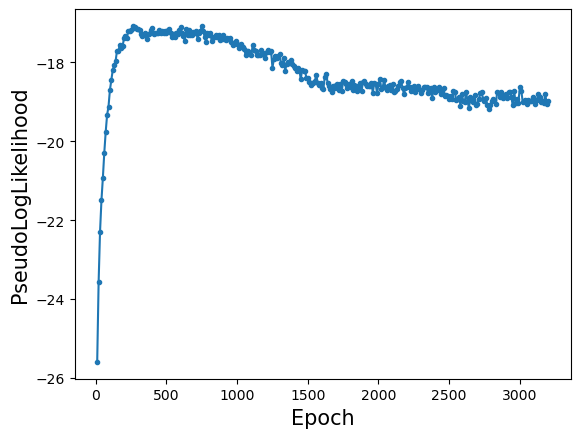

Training RBM 31/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367066 (train), 0.366316 (test), Pseud_Lik: -26.224059, Time: 1.173704, 
Ep 20, Rec er: 0.348360 (train), 0.347550 (test), Pseud_Lik: -23.726063, Time: 1.209385, 
Ep 30, Rec er: 0.336392 (train), 0.335728 (test), Pseud_Lik: -22.265821, Time: 1.213448, 
Ep 40, Rec er: 0.329979 (train), 0.329956 (test), Pseud_Lik: -21.594065, Time: 1.201365, 
Ep 50, Rec er: 0.324917 (train), 0.325267 (test), Pseud_Lik: -20.797724, Time: 1.205142, 
Ep 60, Rec er: 0.321117 (train), 0.322934 (test), Pseud_Lik: -20.396818, Time: 1.231061, 
Ep 70, Rec er: 0.319200 (train), 0.319789 (test), Pseud_Lik: -20.051940, Time: 1.232571, 
Ep 80, Rec er: 0.316521 (train), 0.318441 (test), Pseud_Lik: -19.780705, Time: 1.244365, 
Ep 90, Rec er: 0.314560 (train), 0.316059 (test), Pseud_Lik: -19.479490, Time: 1.239891, 
Ep 100, Rec er: 0.312860 (train), 0.314339 (test), Pse

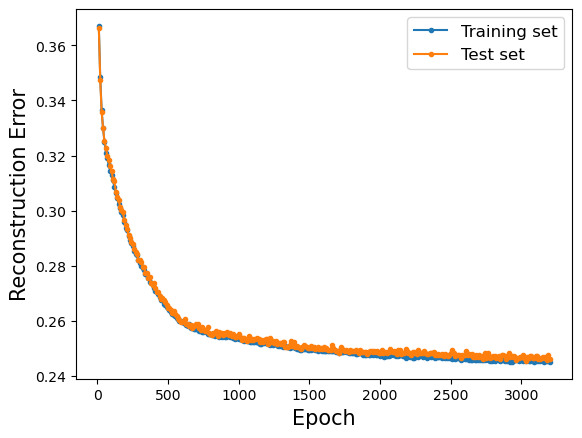

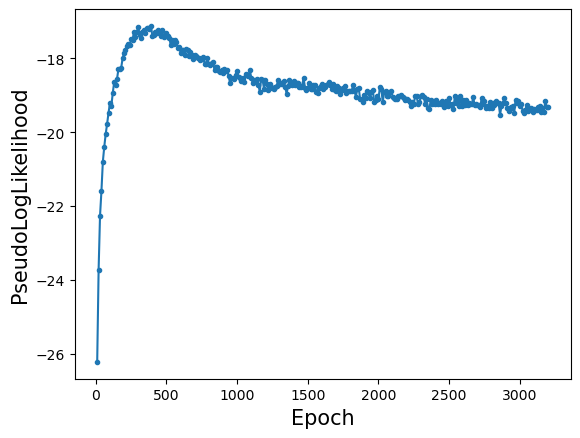

Training RBM 32/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366991 (train), 0.365927 (test), Pseud_Lik: -25.693401, Time: 1.177101, 
Ep 20, Rec er: 0.349514 (train), 0.348784 (test), Pseud_Lik: -23.569922, Time: 1.168779, 
Ep 30, Rec er: 0.336165 (train), 0.336488 (test), Pseud_Lik: -22.396652, Time: 1.187090, 
Ep 40, Rec er: 0.329923 (train), 0.329848 (test), Pseud_Lik: -21.735699, Time: 1.190469, 
Ep 50, Rec er: 0.325476 (train), 0.326486 (test), Pseud_Lik: -21.170203, Time: 1.199228, 
Ep 60, Rec er: 0.320555 (train), 0.321511 (test), Pseud_Lik: -20.950913, Time: 1.199010, 
Ep 70, Rec er: 0.316119 (train), 0.316687 (test), Pseud_Lik: -20.318557, Time: 1.203942, 
Ep 80, Rec er: 0.312232 (train), 0.313614 (test), Pseud_Lik: -20.063187, Time: 1.208146, 
Ep 90, Rec er: 0.309348 (train), 0.310412 (test), Pseud_Lik: -19.479809, Time: 1.209954, 
Ep 100, Rec er: 0.306104 (train), 0.307717 (test), Pse

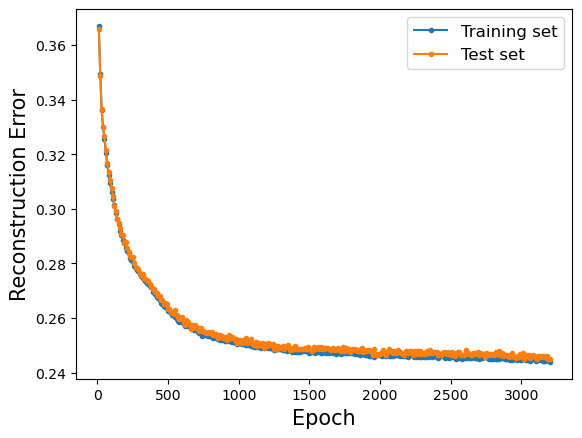

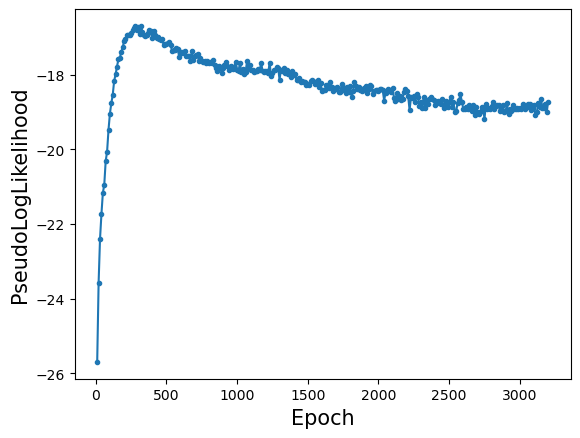

Training RBM 33/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365834 (train), 0.365222 (test), Pseud_Lik: -25.920396, Time: 1.174564, 
Ep 20, Rec er: 0.347258 (train), 0.346292 (test), Pseud_Lik: -23.520548, Time: 1.182634, 
Ep 30, Rec er: 0.334768 (train), 0.333795 (test), Pseud_Lik: -22.358717, Time: 1.197522, 
Ep 40, Rec er: 0.329274 (train), 0.329520 (test), Pseud_Lik: -21.737670, Time: 1.204358, 
Ep 50, Rec er: 0.324018 (train), 0.325564 (test), Pseud_Lik: -21.115176, Time: 1.229414, 
Ep 60, Rec er: 0.320039 (train), 0.320556 (test), Pseud_Lik: -20.779208, Time: 1.219318, 
Ep 70, Rec er: 0.316014 (train), 0.317142 (test), Pseud_Lik: -20.261998, Time: 1.215994, 
Ep 80, Rec er: 0.313035 (train), 0.314991 (test), Pseud_Lik: -19.781177, Time: 1.217583, 
Ep 90, Rec er: 0.310063 (train), 0.311125 (test), Pseud_Lik: -19.382697, Time: 1.225203, 
Ep 100, Rec er: 0.308769 (train), 0.309719 (test), Pse

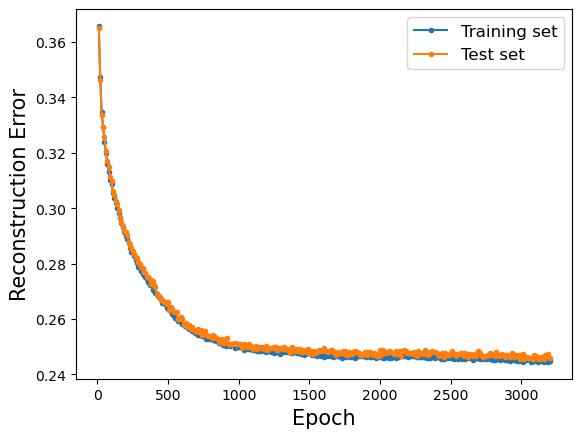

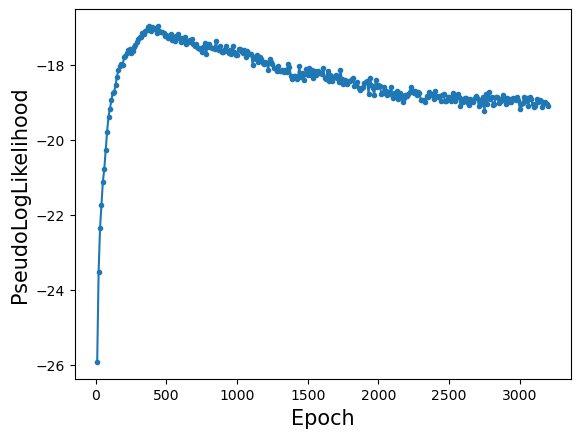

Training RBM 34/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366021 (train), 0.365058 (test), Pseud_Lik: -25.697196, Time: 1.176687, 
Ep 20, Rec er: 0.349225 (train), 0.349117 (test), Pseud_Lik: -23.705328, Time: 1.177565, 
Ep 30, Rec er: 0.336085 (train), 0.335805 (test), Pseud_Lik: -22.423717, Time: 1.203841, 
Ep 40, Rec er: 0.329602 (train), 0.330786 (test), Pseud_Lik: -21.917243, Time: 1.212772, 
Ep 50, Rec er: 0.324007 (train), 0.322873 (test), Pseud_Lik: -21.551303, Time: 1.204117, 
Ep 60, Rec er: 0.318476 (train), 0.319905 (test), Pseud_Lik: -20.842842, Time: 1.212240, 
Ep 70, Rec er: 0.313811 (train), 0.314858 (test), Pseud_Lik: -20.120153, Time: 1.209584, 
Ep 80, Rec er: 0.309859 (train), 0.310045 (test), Pseud_Lik: -19.429664, Time: 1.210208, 
Ep 90, Rec er: 0.306885 (train), 0.307842 (test), Pseud_Lik: -19.010170, Time: 1.208187, 
Ep 100, Rec er: 0.304619 (train), 0.304841 (test), Pse

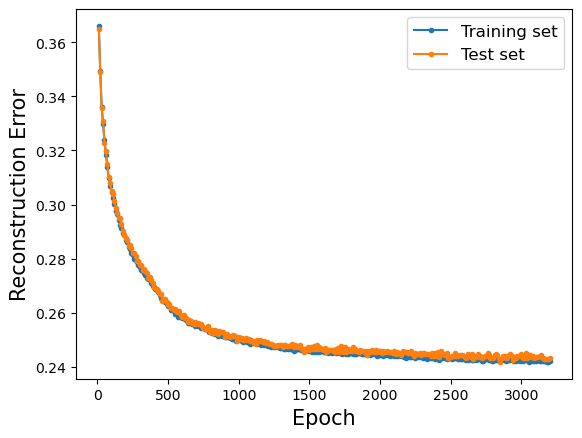

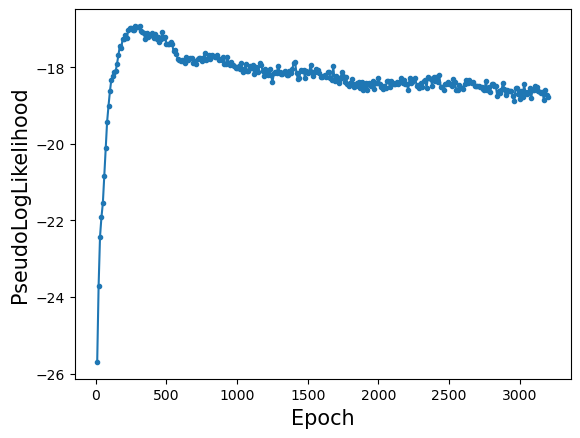

Training RBM 35/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366271 (train), 0.366616 (test), Pseud_Lik: -25.878842, Time: 1.170876, 
Ep 20, Rec er: 0.346988 (train), 0.347008 (test), Pseud_Lik: -23.564011, Time: 1.178839, 
Ep 30, Rec er: 0.334896 (train), 0.336425 (test), Pseud_Lik: -22.401595, Time: 1.190952, 
Ep 40, Rec er: 0.328825 (train), 0.329183 (test), Pseud_Lik: -21.766563, Time: 1.199039, 
Ep 50, Rec er: 0.323017 (train), 0.324703 (test), Pseud_Lik: -21.008808, Time: 1.208320, 
Ep 60, Rec er: 0.318445 (train), 0.320067 (test), Pseud_Lik: -20.505704, Time: 1.209788, 
Ep 70, Rec er: 0.314850 (train), 0.314861 (test), Pseud_Lik: -19.747199, Time: 1.215258, 
Ep 80, Rec er: 0.312627 (train), 0.312614 (test), Pseud_Lik: -19.550581, Time: 1.215674, 
Ep 90, Rec er: 0.309947 (train), 0.311591 (test), Pseud_Lik: -19.303494, Time: 1.216250, 
Ep 100, Rec er: 0.307539 (train), 0.308389 (test), Pse

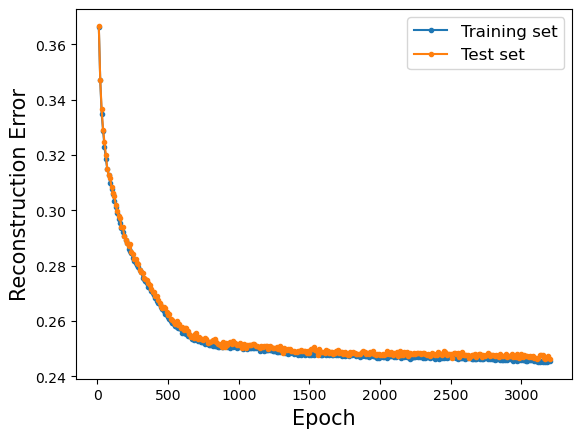

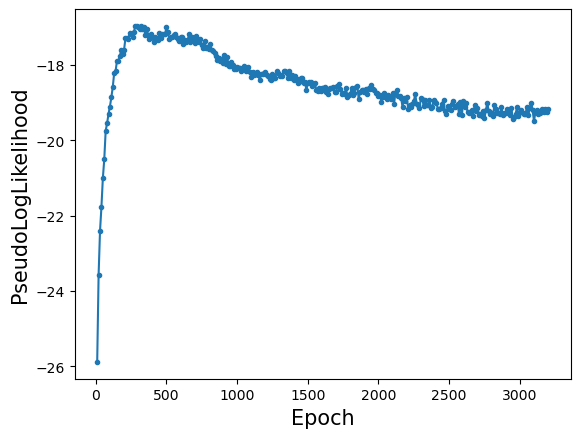

Training RBM 36/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367254 (train), 0.367105 (test), Pseud_Lik: -25.977374, Time: 1.174876, 
Ep 20, Rec er: 0.348972 (train), 0.348500 (test), Pseud_Lik: -23.642458, Time: 1.175164, 
Ep 30, Rec er: 0.335979 (train), 0.336298 (test), Pseud_Lik: -22.453003, Time: 1.188331, 
Ep 40, Rec er: 0.329669 (train), 0.330194 (test), Pseud_Lik: -21.757747, Time: 1.197644, 
Ep 50, Rec er: 0.324383 (train), 0.325289 (test), Pseud_Lik: -21.250029, Time: 1.208216, 
Ep 60, Rec er: 0.319180 (train), 0.320002 (test), Pseud_Lik: -20.668139, Time: 1.207160, 
Ep 70, Rec er: 0.315517 (train), 0.317039 (test), Pseud_Lik: -20.005747, Time: 1.229839, 
Ep 80, Rec er: 0.312683 (train), 0.312527 (test), Pseud_Lik: -19.547886, Time: 1.232474, 
Ep 90, Rec er: 0.309151 (train), 0.310714 (test), Pseud_Lik: -19.243135, Time: 1.251483, 
Ep 100, Rec er: 0.306919 (train), 0.307289 (test), Pse

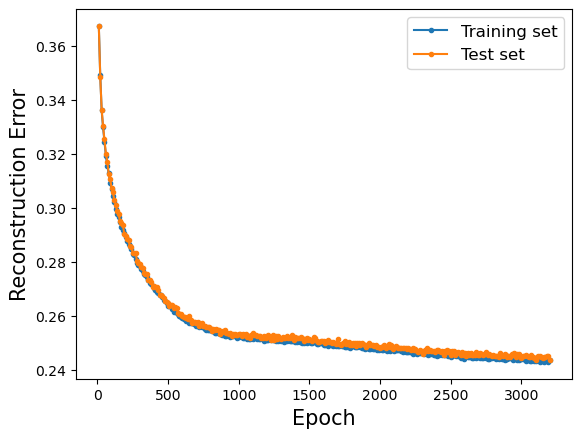

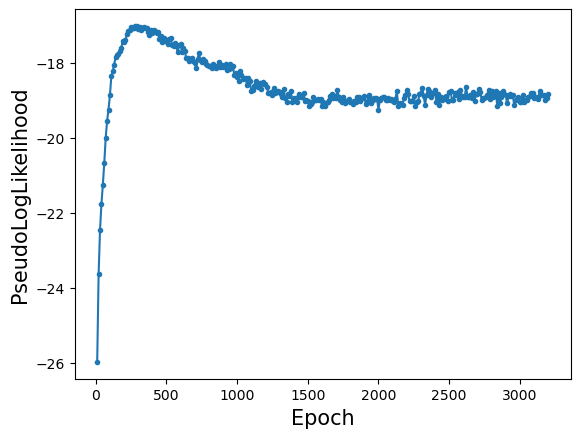

Training RBM 37/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365377 (train), 0.364814 (test), Pseud_Lik: -25.545200, Time: 1.174992, 
Ep 20, Rec er: 0.347461 (train), 0.345809 (test), Pseud_Lik: -23.476351, Time: 1.182471, 
Ep 30, Rec er: 0.333784 (train), 0.333759 (test), Pseud_Lik: -22.486397, Time: 1.220014, 
Ep 40, Rec er: 0.326687 (train), 0.328014 (test), Pseud_Lik: -21.671541, Time: 1.197665, 
Ep 50, Rec er: 0.322175 (train), 0.323731 (test), Pseud_Lik: -21.061279, Time: 1.200452, 
Ep 60, Rec er: 0.317928 (train), 0.318041 (test), Pseud_Lik: -20.684092, Time: 1.210271, 
Ep 70, Rec er: 0.313923 (train), 0.315328 (test), Pseud_Lik: -20.053326, Time: 1.208765, 
Ep 80, Rec er: 0.310397 (train), 0.311358 (test), Pseud_Lik: -19.685952, Time: 1.208682, 
Ep 90, Rec er: 0.307647 (train), 0.308117 (test), Pseud_Lik: -19.278353, Time: 1.208781, 
Ep 100, Rec er: 0.305125 (train), 0.306802 (test), Pse

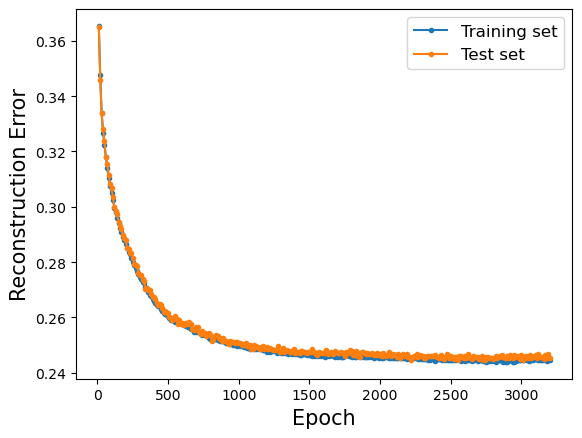

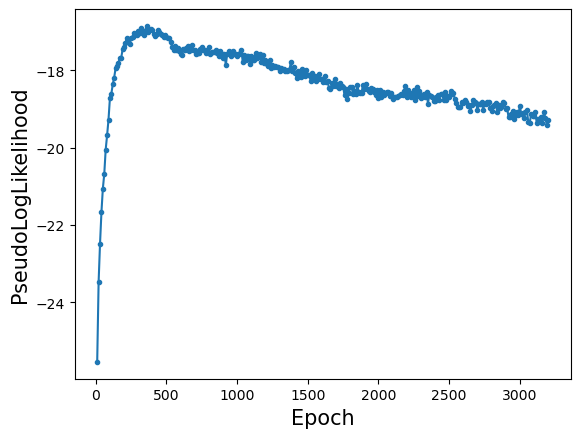

Training RBM 38/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367321 (train), 0.366681 (test), Pseud_Lik: -26.151795, Time: 1.179781, 
Ep 20, Rec er: 0.346093 (train), 0.346087 (test), Pseud_Lik: -23.591908, Time: 1.181873, 
Ep 30, Rec er: 0.335862 (train), 0.337320 (test), Pseud_Lik: -22.397396, Time: 1.201750, 
Ep 40, Rec er: 0.329674 (train), 0.331352 (test), Pseud_Lik: -21.551788, Time: 1.205684, 
Ep 50, Rec er: 0.324769 (train), 0.326203 (test), Pseud_Lik: -20.866058, Time: 1.213293, 
Ep 60, Rec er: 0.321412 (train), 0.322475 (test), Pseud_Lik: -20.253083, Time: 1.217452, 
Ep 70, Rec er: 0.318211 (train), 0.319742 (test), Pseud_Lik: -19.994197, Time: 1.219137, 
Ep 80, Rec er: 0.315775 (train), 0.317172 (test), Pseud_Lik: -19.558452, Time: 1.217244, 
Ep 90, Rec er: 0.313741 (train), 0.314542 (test), Pseud_Lik: -19.211693, Time: 1.220545, 
Ep 100, Rec er: 0.311019 (train), 0.313280 (test), Pse

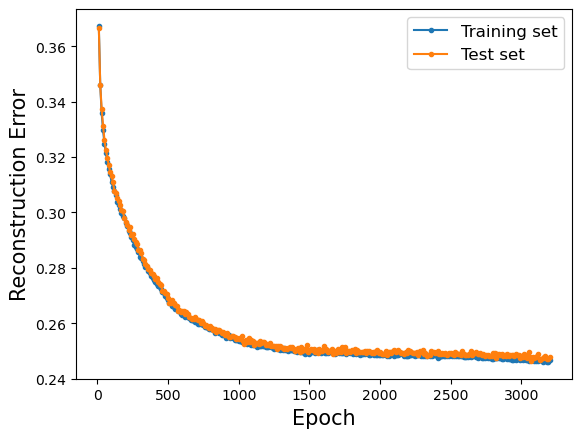

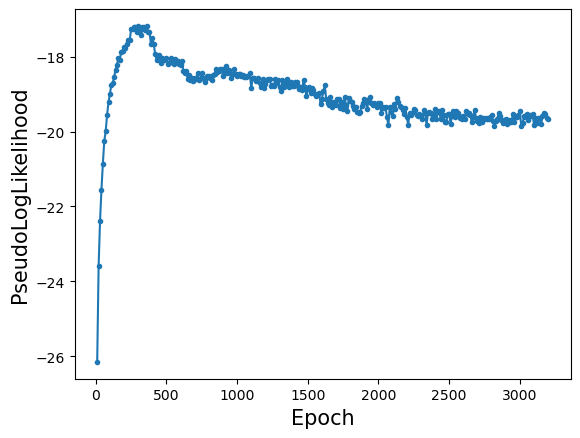

Training RBM 39/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365816 (train), 0.365105 (test), Pseud_Lik: -25.684026, Time: 1.178605, 
Ep 20, Rec er: 0.347239 (train), 0.345580 (test), Pseud_Lik: -23.496779, Time: 1.182659, 
Ep 30, Rec er: 0.334451 (train), 0.334680 (test), Pseud_Lik: -22.387553, Time: 1.197200, 
Ep 40, Rec er: 0.328755 (train), 0.329069 (test), Pseud_Lik: -21.990150, Time: 1.199344, 
Ep 50, Rec er: 0.323557 (train), 0.323186 (test), Pseud_Lik: -21.317058, Time: 1.211597, 
Ep 60, Rec er: 0.318880 (train), 0.318883 (test), Pseud_Lik: -20.723561, Time: 1.223632, 
Ep 70, Rec er: 0.314511 (train), 0.316091 (test), Pseud_Lik: -20.278645, Time: 1.210992, 
Ep 80, Rec er: 0.311581 (train), 0.312384 (test), Pseud_Lik: -19.881741, Time: 1.206462, 
Ep 90, Rec er: 0.307830 (train), 0.309405 (test), Pseud_Lik: -19.380535, Time: 1.216393, 
Ep 100, Rec er: 0.305711 (train), 0.306839 (test), Pse

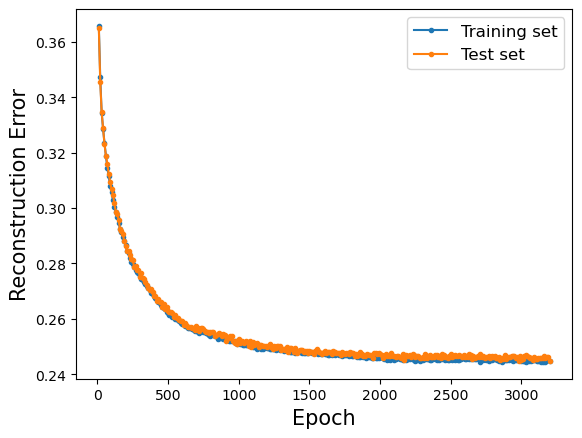

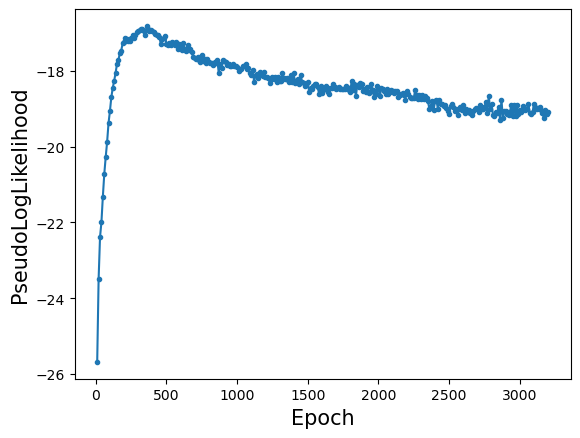

Training RBM 40/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365229 (train), 0.365634 (test), Pseud_Lik: -25.451043, Time: 1.173751, 
Ep 20, Rec er: 0.349502 (train), 0.349178 (test), Pseud_Lik: -23.714289, Time: 1.174352, 
Ep 30, Rec er: 0.336083 (train), 0.335277 (test), Pseud_Lik: -22.627297, Time: 1.226549, 
Ep 40, Rec er: 0.328109 (train), 0.329095 (test), Pseud_Lik: -21.896509, Time: 1.198042, 
Ep 50, Rec er: 0.321935 (train), 0.322706 (test), Pseud_Lik: -21.140560, Time: 1.205254, 
Ep 60, Rec er: 0.316190 (train), 0.316794 (test), Pseud_Lik: -20.444827, Time: 1.218255, 
Ep 70, Rec er: 0.311748 (train), 0.312778 (test), Pseud_Lik: -19.992147, Time: 1.214925, 
Ep 80, Rec er: 0.307992 (train), 0.309100 (test), Pseud_Lik: -19.400652, Time: 1.210611, 
Ep 90, Rec er: 0.305352 (train), 0.306722 (test), Pseud_Lik: -18.999520, Time: 1.212024, 
Ep 100, Rec er: 0.302837 (train), 0.303708 (test), Pse

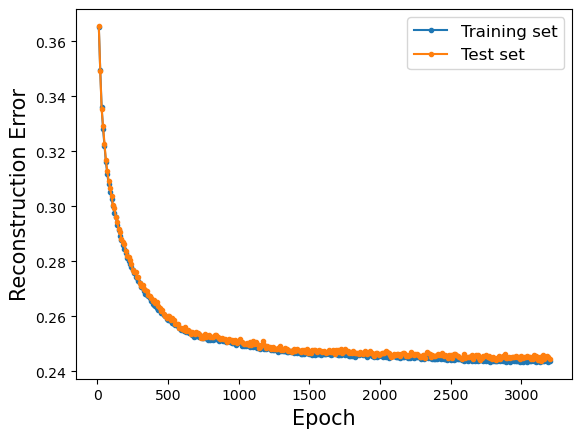

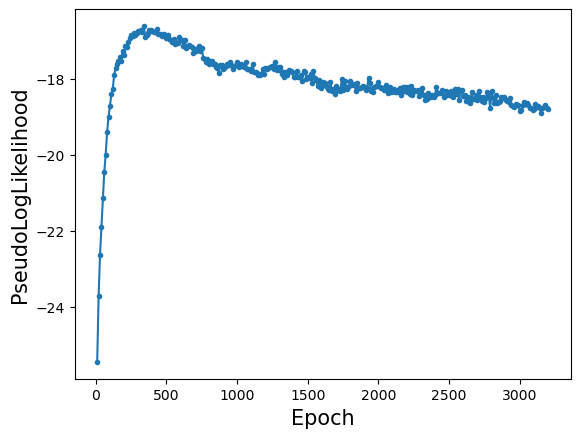

Training RBM 41/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366204 (train), 0.365908 (test), Pseud_Lik: -25.737166, Time: 1.179029, 
Ep 20, Rec er: 0.347438 (train), 0.347700 (test), Pseud_Lik: -23.592141, Time: 1.176445, 
Ep 30, Rec er: 0.335658 (train), 0.335186 (test), Pseud_Lik: -22.437879, Time: 1.204924, 
Ep 40, Rec er: 0.329888 (train), 0.330395 (test), Pseud_Lik: -21.767390, Time: 1.213789, 
Ep 50, Rec er: 0.324621 (train), 0.324022 (test), Pseud_Lik: -21.284577, Time: 1.228726, 
Ep 60, Rec er: 0.320011 (train), 0.320578 (test), Pseud_Lik: -20.682655, Time: 1.251985, 
Ep 70, Rec er: 0.315761 (train), 0.316197 (test), Pseud_Lik: -20.477031, Time: 1.241911, 
Ep 80, Rec er: 0.312538 (train), 0.312558 (test), Pseud_Lik: -19.747683, Time: 1.241641, 
Ep 90, Rec er: 0.309641 (train), 0.311019 (test), Pseud_Lik: -19.442297, Time: 1.238844, 
Ep 100, Rec er: 0.306218 (train), 0.308591 (test), Pse

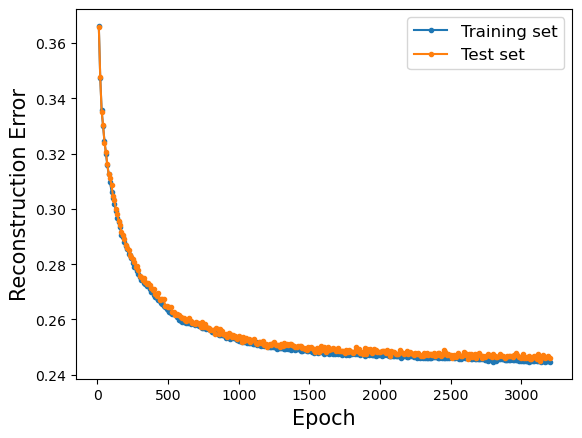

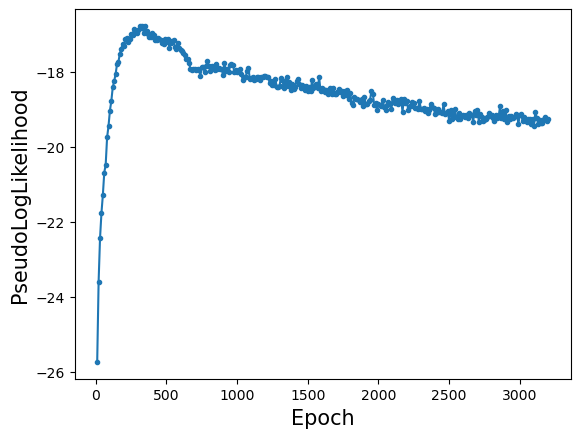

Training RBM 42/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367055 (train), 0.366694 (test), Pseud_Lik: -25.833963, Time: 1.188935, 
Ep 20, Rec er: 0.348545 (train), 0.347245 (test), Pseud_Lik: -23.589929, Time: 1.181918, 
Ep 30, Rec er: 0.334829 (train), 0.334909 (test), Pseud_Lik: -22.363828, Time: 1.195126, 
Ep 40, Rec er: 0.328530 (train), 0.329242 (test), Pseud_Lik: -21.740114, Time: 1.204474, 
Ep 50, Rec er: 0.322986 (train), 0.324636 (test), Pseud_Lik: -21.087788, Time: 1.209402, 
Ep 60, Rec er: 0.318996 (train), 0.319488 (test), Pseud_Lik: -20.549408, Time: 1.209172, 
Ep 70, Rec er: 0.316025 (train), 0.316241 (test), Pseud_Lik: -20.016781, Time: 1.216228, 
Ep 80, Rec er: 0.312636 (train), 0.313831 (test), Pseud_Lik: -19.504177, Time: 1.219549, 
Ep 90, Rec er: 0.310503 (train), 0.311053 (test), Pseud_Lik: -19.060098, Time: 1.217298, 
Ep 100, Rec er: 0.307119 (train), 0.308267 (test), Pse

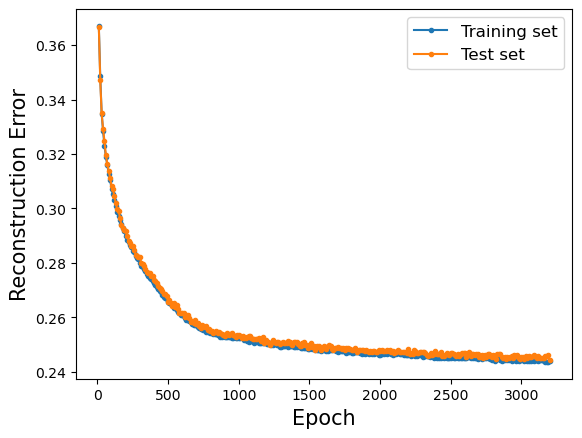

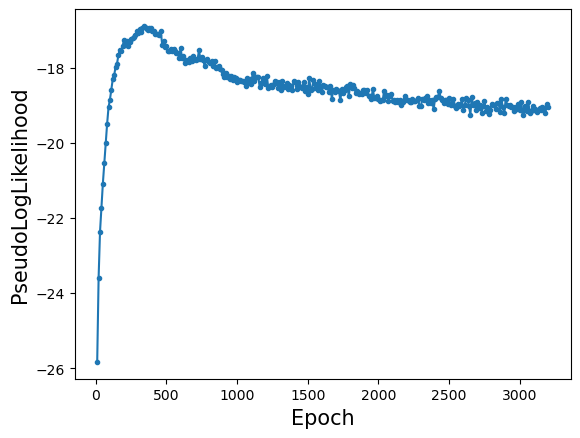

Training RBM 43/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366007 (train), 0.367669 (test), Pseud_Lik: -25.537813, Time: 1.172955, 
Ep 20, Rec er: 0.349657 (train), 0.348136 (test), Pseud_Lik: -23.720411, Time: 1.169281, 
Ep 30, Rec er: 0.335656 (train), 0.335625 (test), Pseud_Lik: -22.398605, Time: 1.239805, 
Ep 40, Rec er: 0.328958 (train), 0.329320 (test), Pseud_Lik: -21.771847, Time: 1.201003, 
Ep 50, Rec er: 0.323805 (train), 0.323425 (test), Pseud_Lik: -21.316058, Time: 1.200469, 
Ep 60, Rec er: 0.319367 (train), 0.319558 (test), Pseud_Lik: -20.660795, Time: 1.204963, 
Ep 70, Rec er: 0.315064 (train), 0.314552 (test), Pseud_Lik: -20.065911, Time: 1.211626, 
Ep 80, Rec er: 0.311184 (train), 0.311756 (test), Pseud_Lik: -19.583793, Time: 1.217877, 
Ep 90, Rec er: 0.307744 (train), 0.308478 (test), Pseud_Lik: -19.239476, Time: 1.212633, 
Ep 100, Rec er: 0.305316 (train), 0.306234 (test), Pse

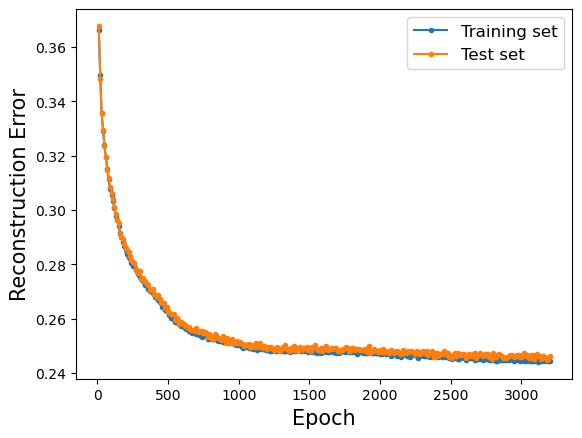

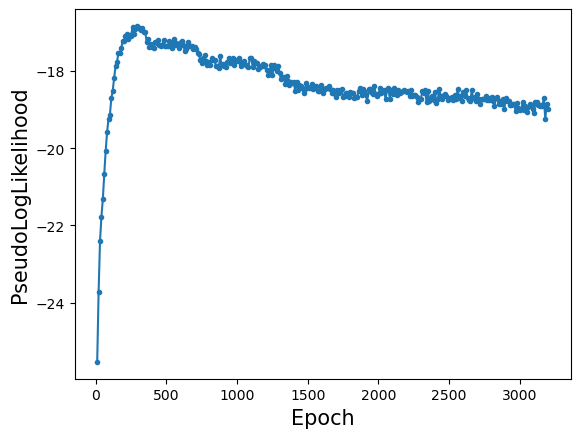

Training RBM 44/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366407 (train), 0.365730 (test), Pseud_Lik: -25.645961, Time: 1.175377, 
Ep 20, Rec er: 0.348695 (train), 0.348427 (test), Pseud_Lik: -23.696041, Time: 1.169176, 
Ep 30, Rec er: 0.336047 (train), 0.336987 (test), Pseud_Lik: -22.604270, Time: 1.186128, 
Ep 40, Rec er: 0.328507 (train), 0.328295 (test), Pseud_Lik: -21.983121, Time: 1.192424, 
Ep 50, Rec er: 0.322639 (train), 0.322756 (test), Pseud_Lik: -21.114901, Time: 1.196401, 
Ep 60, Rec er: 0.316700 (train), 0.317836 (test), Pseud_Lik: -20.456013, Time: 1.200704, 
Ep 70, Rec er: 0.311908 (train), 0.313469 (test), Pseud_Lik: -19.704640, Time: 1.205378, 
Ep 80, Rec er: 0.308887 (train), 0.310083 (test), Pseud_Lik: -19.243629, Time: 1.209499, 
Ep 90, Rec er: 0.305495 (train), 0.306627 (test), Pseud_Lik: -18.860680, Time: 1.208552, 
Ep 100, Rec er: 0.302332 (train), 0.303111 (test), Pse

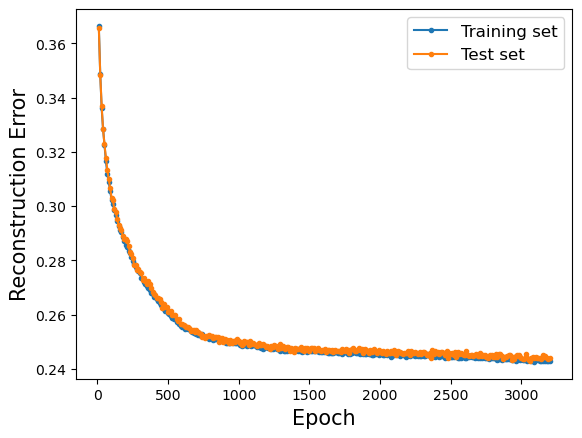

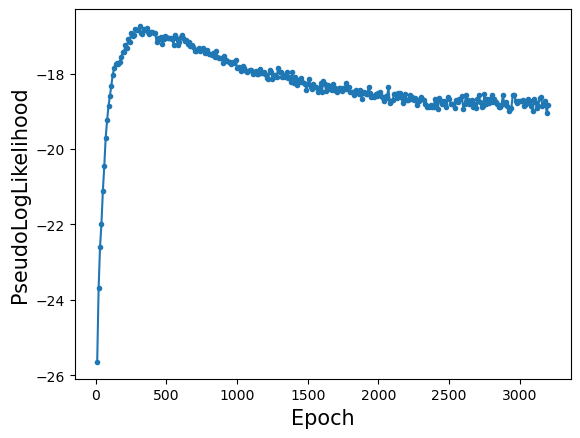

Training RBM 45/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365785 (train), 0.365661 (test), Pseud_Lik: -25.582092, Time: 1.256213, 
Ep 20, Rec er: 0.348914 (train), 0.348778 (test), Pseud_Lik: -23.669263, Time: 1.323345, 
Ep 30, Rec er: 0.335738 (train), 0.336600 (test), Pseud_Lik: -22.432662, Time: 1.287331, 
Ep 40, Rec er: 0.328771 (train), 0.329612 (test), Pseud_Lik: -21.595033, Time: 1.287913, 
Ep 50, Rec er: 0.322824 (train), 0.322214 (test), Pseud_Lik: -20.948910, Time: 1.342933, 
Ep 60, Rec er: 0.317531 (train), 0.318105 (test), Pseud_Lik: -20.481926, Time: 1.310397, 
Ep 70, Rec er: 0.313576 (train), 0.314619 (test), Pseud_Lik: -20.279030, Time: 1.206807, 
Ep 80, Rec er: 0.310874 (train), 0.311795 (test), Pseud_Lik: -19.817156, Time: 1.209481, 
Ep 90, Rec er: 0.307600 (train), 0.307773 (test), Pseud_Lik: -19.544582, Time: 1.250207, 
Ep 100, Rec er: 0.304611 (train), 0.305902 (test), Pse

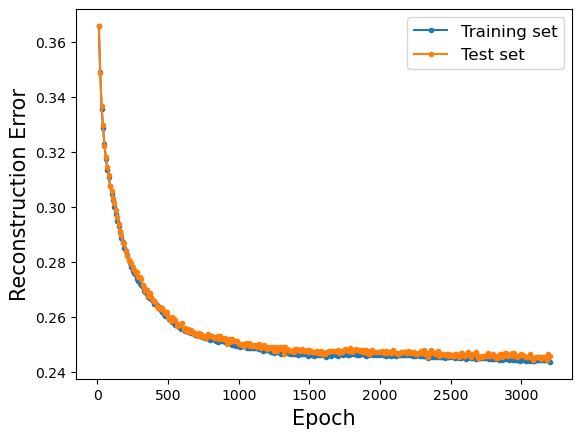

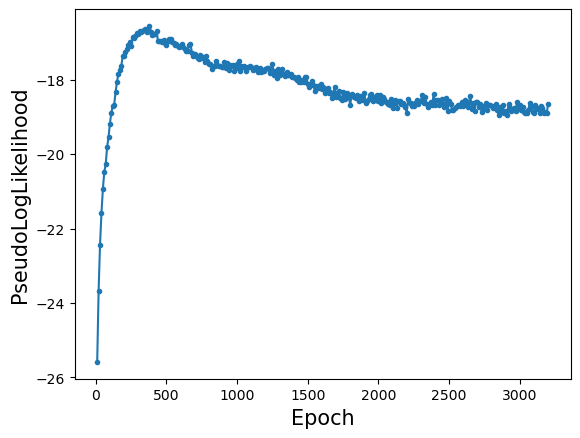

Training RBM 46/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365405 (train), 0.364962 (test), Pseud_Lik: -25.610126, Time: 1.173366, 
Ep 20, Rec er: 0.346979 (train), 0.345936 (test), Pseud_Lik: -23.502311, Time: 1.167065, 
Ep 30, Rec er: 0.335359 (train), 0.334839 (test), Pseud_Lik: -22.323031, Time: 1.200914, 
Ep 40, Rec er: 0.328871 (train), 0.330375 (test), Pseud_Lik: -21.845388, Time: 1.191070, 
Ep 50, Rec er: 0.324255 (train), 0.325045 (test), Pseud_Lik: -21.616386, Time: 1.191940, 
Ep 60, Rec er: 0.319329 (train), 0.320428 (test), Pseud_Lik: -20.821060, Time: 1.220802, 
Ep 70, Rec er: 0.315235 (train), 0.315477 (test), Pseud_Lik: -20.335365, Time: 1.292450, 
Ep 80, Rec er: 0.312088 (train), 0.313158 (test), Pseud_Lik: -19.929579, Time: 1.324060, 
Ep 90, Rec er: 0.309292 (train), 0.309989 (test), Pseud_Lik: -19.460067, Time: 1.324864, 
Ep 100, Rec er: 0.306051 (train), 0.306948 (test), Pse

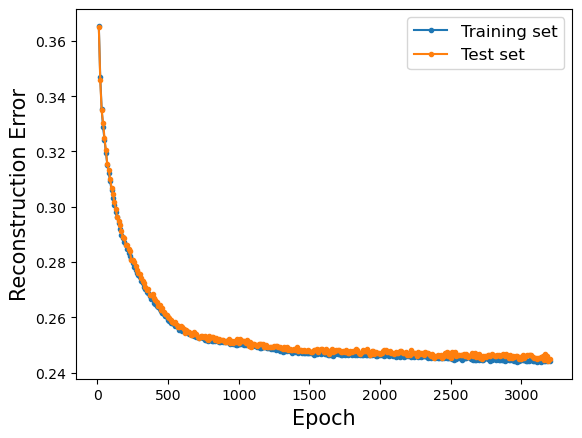

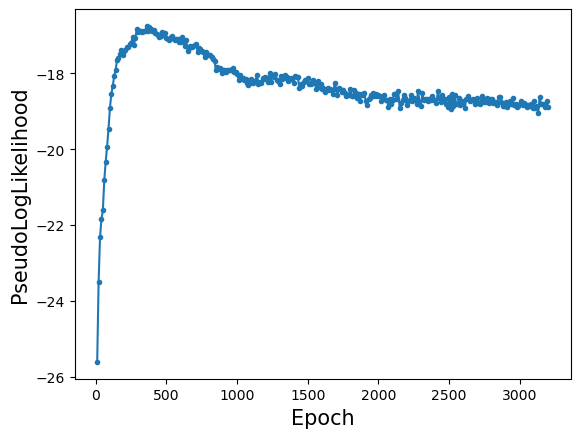

Training RBM 47/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365293 (train), 0.364619 (test), Pseud_Lik: -25.637320, Time: 1.182325, 
Ep 20, Rec er: 0.347819 (train), 0.346687 (test), Pseud_Lik: -23.579833, Time: 1.177511, 
Ep 30, Rec er: 0.334546 (train), 0.334905 (test), Pseud_Lik: -22.310782, Time: 1.238910, 
Ep 40, Rec er: 0.329628 (train), 0.329214 (test), Pseud_Lik: -21.722754, Time: 1.245074, 
Ep 50, Rec er: 0.323937 (train), 0.325155 (test), Pseud_Lik: -21.312085, Time: 1.216920, 
Ep 60, Rec er: 0.319551 (train), 0.320617 (test), Pseud_Lik: -21.209429, Time: 1.201660, 
Ep 70, Rec er: 0.315860 (train), 0.317123 (test), Pseud_Lik: -20.931174, Time: 1.227702, 
Ep 80, Rec er: 0.312478 (train), 0.312683 (test), Pseud_Lik: -20.394411, Time: 1.271138, 
Ep 90, Rec er: 0.308735 (train), 0.308517 (test), Pseud_Lik: -19.822812, Time: 1.232154, 
Ep 100, Rec er: 0.304869 (train), 0.305433 (test), Pse

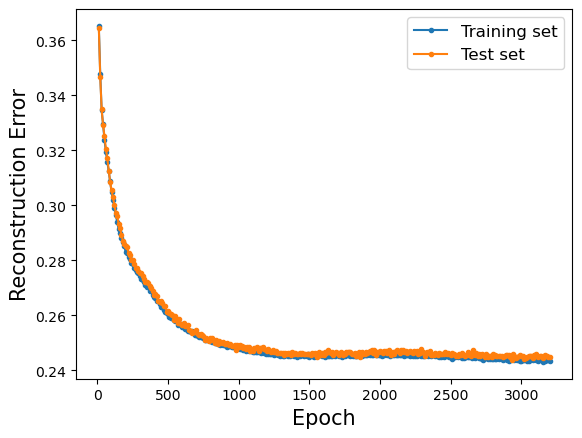

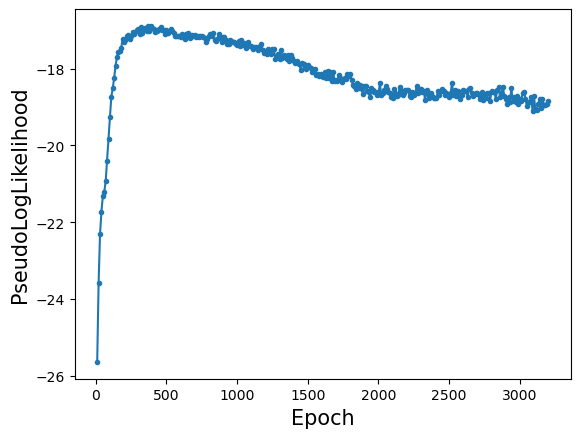

Training RBM 48/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366273 (train), 0.365745 (test), Pseud_Lik: -25.839022, Time: 1.175687, 
Ep 20, Rec er: 0.347156 (train), 0.346213 (test), Pseud_Lik: -23.675286, Time: 1.178238, 
Ep 30, Rec er: 0.334564 (train), 0.335137 (test), Pseud_Lik: -22.202939, Time: 1.193261, 
Ep 40, Rec er: 0.329133 (train), 0.328930 (test), Pseud_Lik: -21.579642, Time: 1.209151, 
Ep 50, Rec er: 0.323988 (train), 0.325086 (test), Pseud_Lik: -20.983476, Time: 1.202091, 
Ep 60, Rec er: 0.318907 (train), 0.320272 (test), Pseud_Lik: -20.692162, Time: 1.219251, 
Ep 70, Rec er: 0.316398 (train), 0.317083 (test), Pseud_Lik: -20.224697, Time: 1.232039, 
Ep 80, Rec er: 0.312964 (train), 0.313059 (test), Pseud_Lik: -19.775581, Time: 1.352102, 
Ep 90, Rec er: 0.310663 (train), 0.311728 (test), Pseud_Lik: -19.339187, Time: 1.222459, 
Ep 100, Rec er: 0.307629 (train), 0.308373 (test), Pse

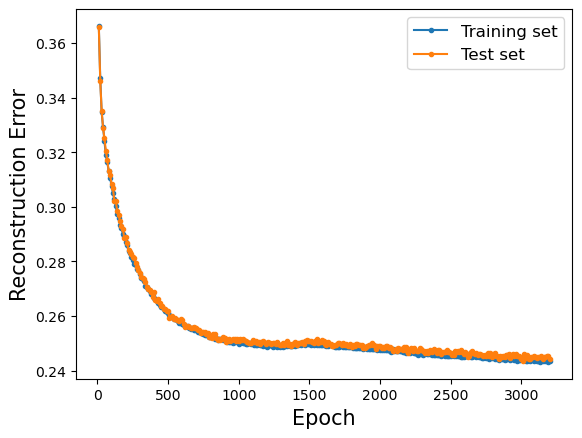

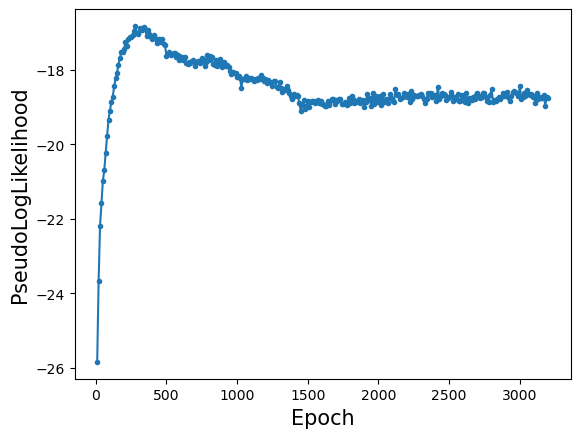

Training RBM 49/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366218 (train), 0.364269 (test), Pseud_Lik: -25.719365, Time: 1.172580, 
Ep 20, Rec er: 0.348493 (train), 0.347734 (test), Pseud_Lik: -23.629379, Time: 1.172066, 
Ep 30, Rec er: 0.336401 (train), 0.336316 (test), Pseud_Lik: -22.369178, Time: 1.185172, 
Ep 40, Rec er: 0.329223 (train), 0.330142 (test), Pseud_Lik: -21.817889, Time: 1.205392, 
Ep 50, Rec er: 0.324414 (train), 0.325322 (test), Pseud_Lik: -21.296553, Time: 1.198180, 
Ep 60, Rec er: 0.319381 (train), 0.320998 (test), Pseud_Lik: -20.896137, Time: 1.201943, 
Ep 70, Rec er: 0.315417 (train), 0.316123 (test), Pseud_Lik: -20.254777, Time: 1.217592, 
Ep 80, Rec er: 0.311798 (train), 0.312314 (test), Pseud_Lik: -19.936071, Time: 1.207011, 
Ep 90, Rec er: 0.308513 (train), 0.309805 (test), Pseud_Lik: -19.225485, Time: 1.206674, 
Ep 100, Rec er: 0.306181 (train), 0.306786 (test), Pse

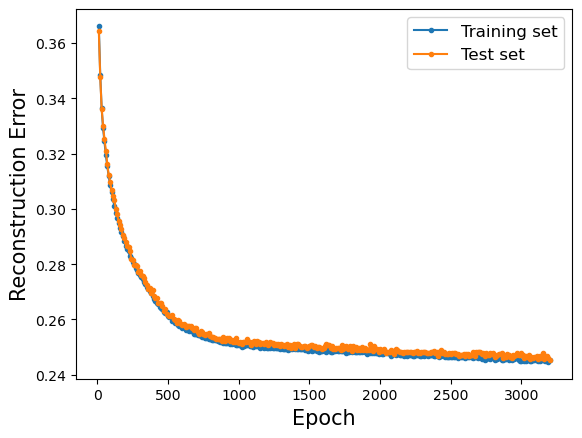

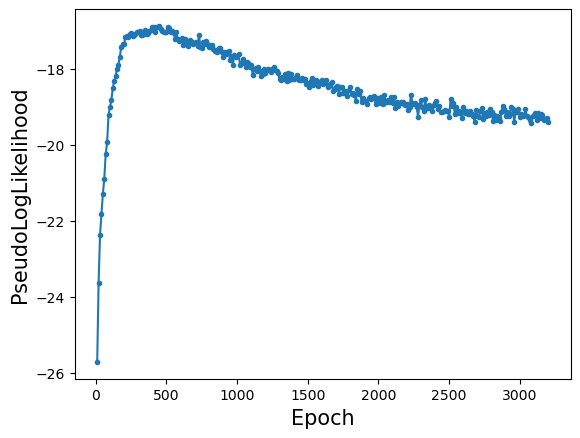

Training RBM 50/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366990 (train), 0.366364 (test), Pseud_Lik: -25.803426, Time: 1.251751, 
Ep 20, Rec er: 0.346323 (train), 0.346572 (test), Pseud_Lik: -23.553711, Time: 1.211598, 
Ep 30, Rec er: 0.334568 (train), 0.334820 (test), Pseud_Lik: -22.322166, Time: 1.226247, 
Ep 40, Rec er: 0.329599 (train), 0.330058 (test), Pseud_Lik: -21.562961, Time: 1.201141, 
Ep 50, Rec er: 0.324300 (train), 0.325427 (test), Pseud_Lik: -21.097504, Time: 1.204094, 
Ep 60, Rec er: 0.320511 (train), 0.320908 (test), Pseud_Lik: -20.870617, Time: 1.210163, 
Ep 70, Rec er: 0.317059 (train), 0.318069 (test), Pseud_Lik: -20.415995, Time: 1.210724, 
Ep 80, Rec er: 0.314089 (train), 0.314714 (test), Pseud_Lik: -19.941538, Time: 1.211477, 
Ep 90, Rec er: 0.311929 (train), 0.312717 (test), Pseud_Lik: -19.437247, Time: 1.218201, 
Ep 100, Rec er: 0.309400 (train), 0.310766 (test), Pse

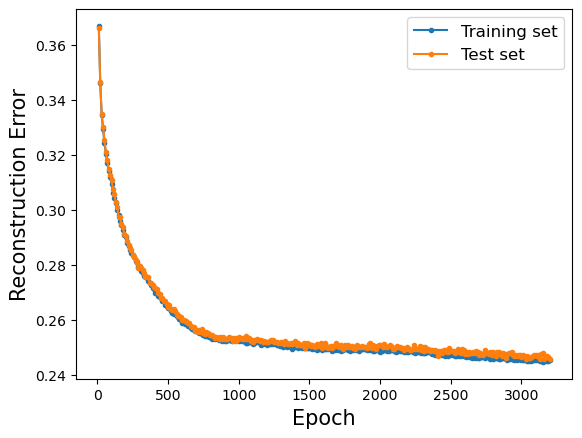

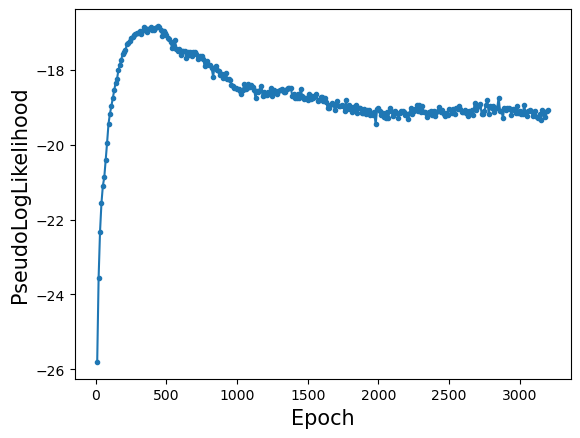

Training RBM 51/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365529 (train), 0.366147 (test), Pseud_Lik: -25.581040, Time: 1.200915, 
Ep 20, Rec er: 0.348573 (train), 0.349669 (test), Pseud_Lik: -23.601052, Time: 1.321796, 
Ep 30, Rec er: 0.335377 (train), 0.334644 (test), Pseud_Lik: -22.496793, Time: 1.190034, 
Ep 40, Rec er: 0.328771 (train), 0.329641 (test), Pseud_Lik: -21.895292, Time: 1.197460, 
Ep 50, Rec er: 0.323268 (train), 0.323906 (test), Pseud_Lik: -21.261800, Time: 1.193399, 
Ep 60, Rec er: 0.317899 (train), 0.317858 (test), Pseud_Lik: -20.524454, Time: 1.213492, 
Ep 70, Rec er: 0.312453 (train), 0.313280 (test), Pseud_Lik: -19.839549, Time: 1.241134, 
Ep 80, Rec er: 0.308432 (train), 0.310583 (test), Pseud_Lik: -19.227660, Time: 1.247823, 
Ep 90, Rec er: 0.305934 (train), 0.305988 (test), Pseud_Lik: -19.033083, Time: 1.258145, 
Ep 100, Rec er: 0.302903 (train), 0.303572 (test), Pse

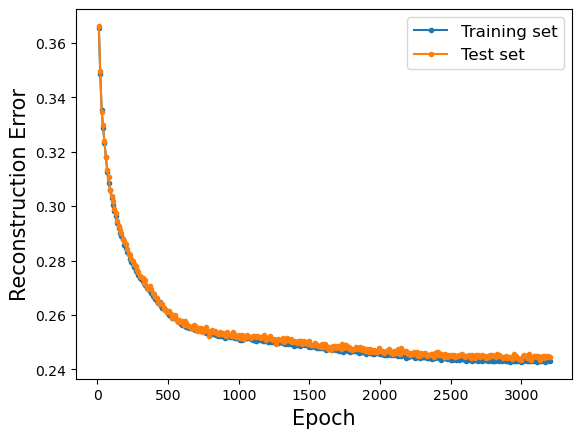

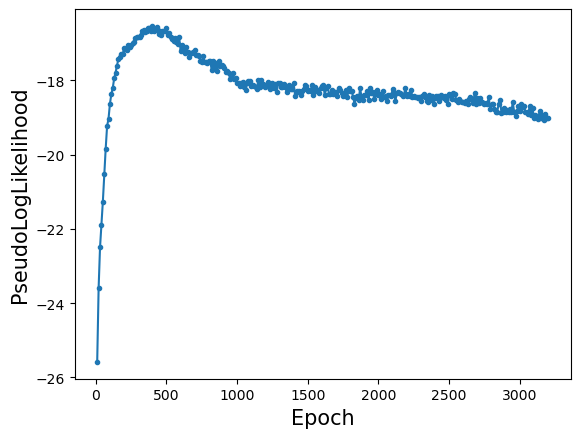

Training RBM 52/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366901 (train), 0.367827 (test), Pseud_Lik: -25.865881, Time: 1.171224, 
Ep 20, Rec er: 0.347525 (train), 0.347520 (test), Pseud_Lik: -23.538479, Time: 1.173239, 
Ep 30, Rec er: 0.335107 (train), 0.335941 (test), Pseud_Lik: -22.330084, Time: 1.196526, 
Ep 40, Rec er: 0.329289 (train), 0.330081 (test), Pseud_Lik: -21.613216, Time: 1.198728, 
Ep 50, Rec er: 0.323442 (train), 0.324605 (test), Pseud_Lik: -20.897939, Time: 1.231518, 
Ep 60, Rec er: 0.319829 (train), 0.319541 (test), Pseud_Lik: -20.276124, Time: 1.214542, 
Ep 70, Rec er: 0.316164 (train), 0.316847 (test), Pseud_Lik: -19.999679, Time: 1.207546, 
Ep 80, Rec er: 0.313408 (train), 0.312789 (test), Pseud_Lik: -19.710347, Time: 1.213579, 
Ep 90, Rec er: 0.310569 (train), 0.311312 (test), Pseud_Lik: -19.337524, Time: 1.214200, 
Ep 100, Rec er: 0.308547 (train), 0.308014 (test), Pse

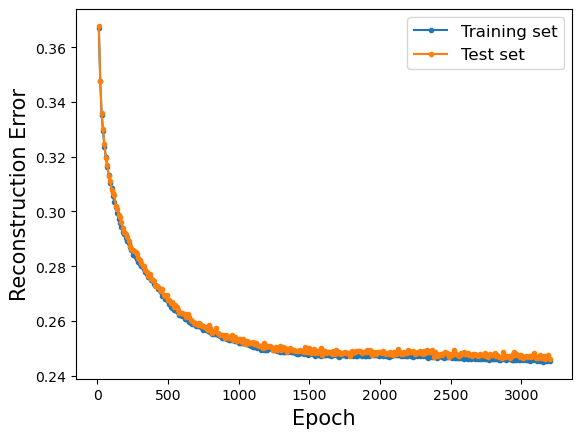

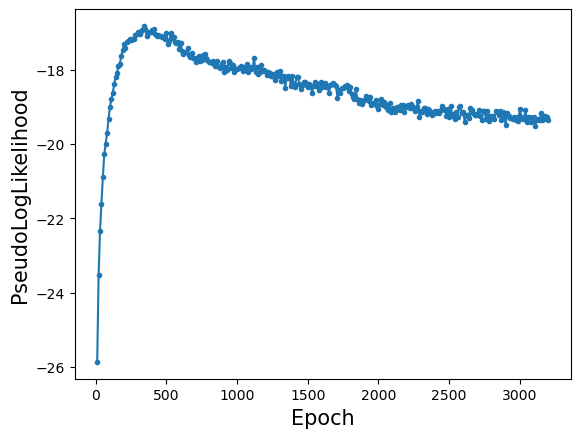

Training RBM 53/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365540 (train), 0.366789 (test), Pseud_Lik: -25.569054, Time: 1.180083, 
Ep 20, Rec er: 0.347229 (train), 0.346470 (test), Pseud_Lik: -23.536426, Time: 1.174302, 
Ep 30, Rec er: 0.334572 (train), 0.335431 (test), Pseud_Lik: -22.462186, Time: 1.188230, 
Ep 40, Rec er: 0.328374 (train), 0.329236 (test), Pseud_Lik: -21.717166, Time: 1.192503, 
Ep 50, Rec er: 0.323014 (train), 0.323169 (test), Pseud_Lik: -21.129692, Time: 1.197144, 
Ep 60, Rec er: 0.317934 (train), 0.318795 (test), Pseud_Lik: -20.612477, Time: 1.213999, 
Ep 70, Rec er: 0.313818 (train), 0.314278 (test), Pseud_Lik: -19.994005, Time: 1.210897, 
Ep 80, Rec er: 0.310741 (train), 0.311956 (test), Pseud_Lik: -19.556653, Time: 1.222720, 
Ep 90, Rec er: 0.307808 (train), 0.308545 (test), Pseud_Lik: -19.353189, Time: 1.261989, 
Ep 100, Rec er: 0.305286 (train), 0.307263 (test), Pse

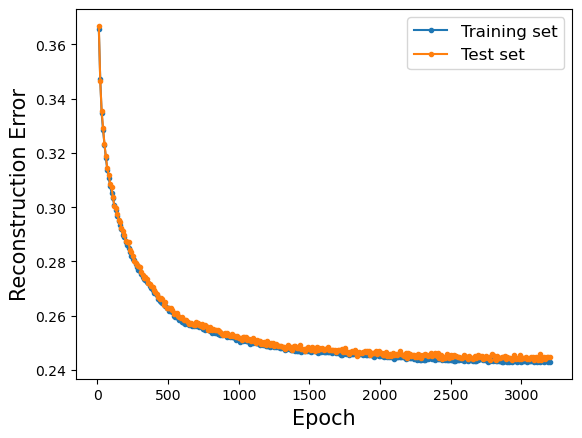

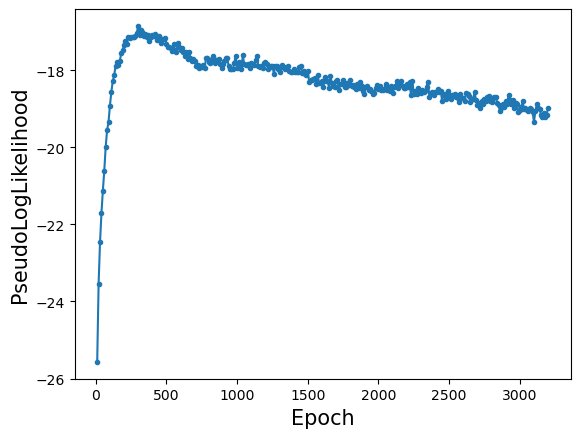

Training RBM 54/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367095 (train), 0.368017 (test), Pseud_Lik: -25.983698, Time: 1.197732, 
Ep 20, Rec er: 0.347923 (train), 0.346803 (test), Pseud_Lik: -23.618791, Time: 1.272849, 
Ep 30, Rec er: 0.336003 (train), 0.336878 (test), Pseud_Lik: -22.420134, Time: 1.187692, 
Ep 40, Rec er: 0.330488 (train), 0.329769 (test), Pseud_Lik: -21.795036, Time: 1.193776, 
Ep 50, Rec er: 0.324679 (train), 0.325127 (test), Pseud_Lik: -21.119031, Time: 1.210035, 
Ep 60, Rec er: 0.320484 (train), 0.320478 (test), Pseud_Lik: -20.649743, Time: 1.205950, 
Ep 70, Rec er: 0.316505 (train), 0.316870 (test), Pseud_Lik: -20.218572, Time: 1.220238, 
Ep 80, Rec er: 0.313520 (train), 0.314288 (test), Pseud_Lik: -19.840916, Time: 1.208267, 
Ep 90, Rec er: 0.310670 (train), 0.311830 (test), Pseud_Lik: -19.426443, Time: 1.213442, 
Ep 100, Rec er: 0.307504 (train), 0.309164 (test), Pse

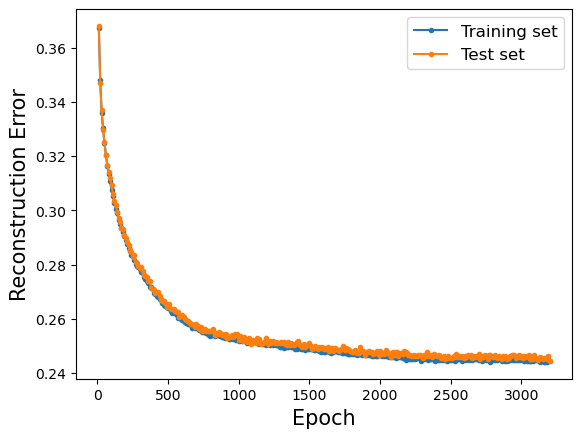

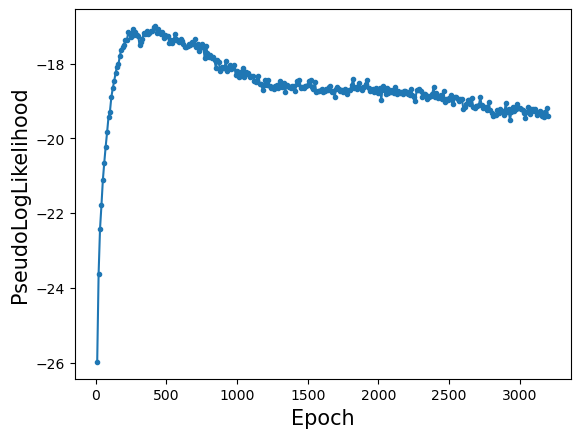

Training RBM 55/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366593 (train), 0.366861 (test), Pseud_Lik: -25.929071, Time: 1.183975, 
Ep 20, Rec er: 0.348188 (train), 0.347653 (test), Pseud_Lik: -23.510243, Time: 1.180844, 
Ep 30, Rec er: 0.335726 (train), 0.335250 (test), Pseud_Lik: -22.339793, Time: 1.197813, 
Ep 40, Rec er: 0.329393 (train), 0.329047 (test), Pseud_Lik: -21.646767, Time: 1.201165, 
Ep 50, Rec er: 0.323819 (train), 0.324752 (test), Pseud_Lik: -20.936374, Time: 1.209459, 
Ep 60, Rec er: 0.319729 (train), 0.319877 (test), Pseud_Lik: -20.516218, Time: 1.209220, 
Ep 70, Rec er: 0.316561 (train), 0.317714 (test), Pseud_Lik: -19.934586, Time: 1.217581, 
Ep 80, Rec er: 0.313352 (train), 0.314737 (test), Pseud_Lik: -19.587666, Time: 1.225459, 
Ep 90, Rec er: 0.311107 (train), 0.311666 (test), Pseud_Lik: -19.316617, Time: 1.221026, 
Ep 100, Rec er: 0.309157 (train), 0.310347 (test), Pse

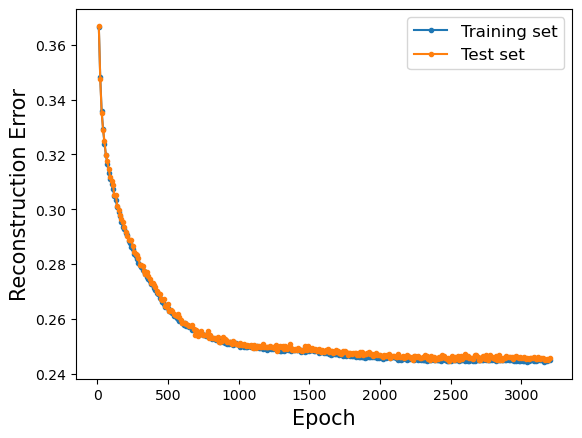

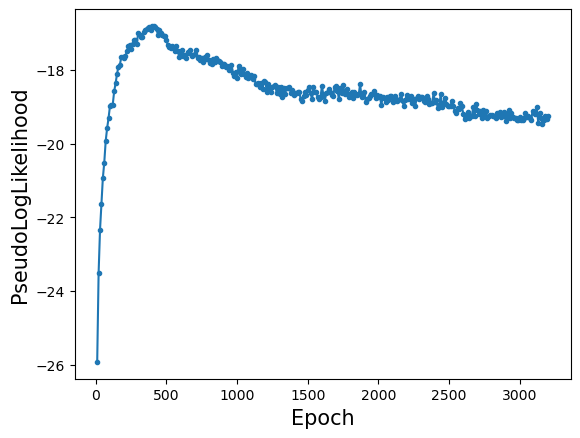

Training RBM 56/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365696 (train), 0.365975 (test), Pseud_Lik: -25.830558, Time: 1.187422, 
Ep 20, Rec er: 0.346911 (train), 0.347412 (test), Pseud_Lik: -23.604139, Time: 1.187013, 
Ep 30, Rec er: 0.335375 (train), 0.336372 (test), Pseud_Lik: -22.181331, Time: 1.190215, 
Ep 40, Rec er: 0.329572 (train), 0.331261 (test), Pseud_Lik: -21.496739, Time: 1.207563, 
Ep 50, Rec er: 0.324594 (train), 0.325767 (test), Pseud_Lik: -20.940766, Time: 1.221740, 
Ep 60, Rec er: 0.320037 (train), 0.320653 (test), Pseud_Lik: -20.499460, Time: 1.242745, 
Ep 70, Rec er: 0.316840 (train), 0.318142 (test), Pseud_Lik: -20.077875, Time: 1.237931, 
Ep 80, Rec er: 0.313934 (train), 0.315173 (test), Pseud_Lik: -19.888495, Time: 1.247506, 
Ep 90, Rec er: 0.312164 (train), 0.312770 (test), Pseud_Lik: -19.761632, Time: 1.293240, 
Ep 100, Rec er: 0.309796 (train), 0.310925 (test), Pse

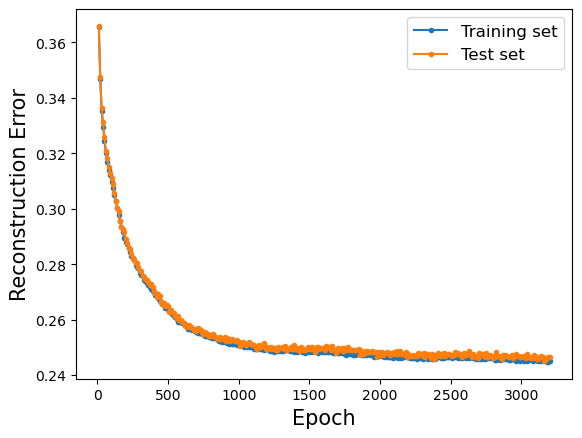

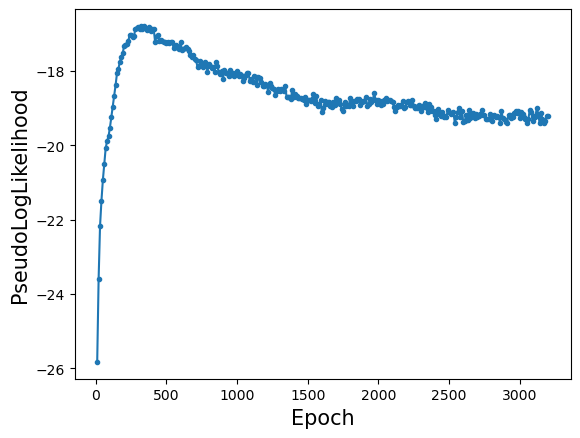

Training RBM 57/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367965 (train), 0.366361 (test), Pseud_Lik: -25.940365, Time: 1.192543, 
Ep 20, Rec er: 0.349594 (train), 0.349813 (test), Pseud_Lik: -23.854200, Time: 1.229555, 
Ep 30, Rec er: 0.335559 (train), 0.336047 (test), Pseud_Lik: -22.318916, Time: 1.195213, 
Ep 40, Rec er: 0.327938 (train), 0.328853 (test), Pseud_Lik: -21.417717, Time: 1.202825, 
Ep 50, Rec er: 0.322787 (train), 0.322212 (test), Pseud_Lik: -20.807420, Time: 1.206229, 
Ep 60, Rec er: 0.318239 (train), 0.318936 (test), Pseud_Lik: -20.286797, Time: 1.211137, 
Ep 70, Rec er: 0.314986 (train), 0.315378 (test), Pseud_Lik: -19.837072, Time: 1.226196, 
Ep 80, Rec er: 0.312048 (train), 0.313753 (test), Pseud_Lik: -19.575832, Time: 1.220356, 
Ep 90, Rec er: 0.309907 (train), 0.309913 (test), Pseud_Lik: -19.175755, Time: 1.220027, 
Ep 100, Rec er: 0.307118 (train), 0.308812 (test), Pse

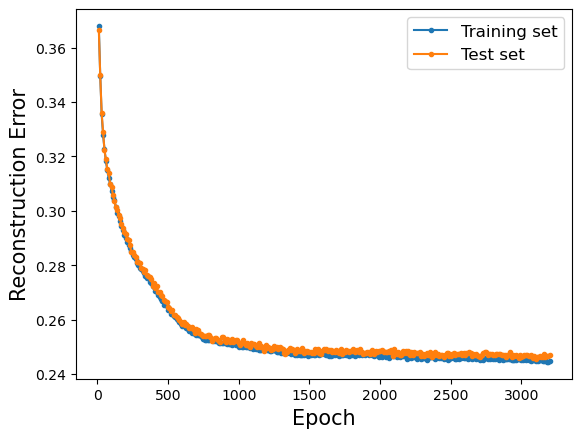

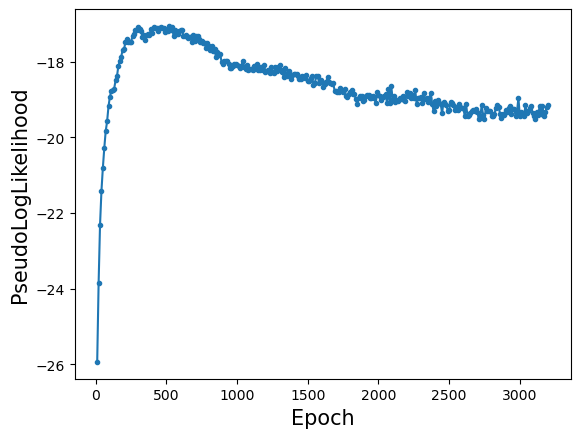

Training RBM 58/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366107 (train), 0.365183 (test), Pseud_Lik: -25.757061, Time: 1.173857, 
Ep 20, Rec er: 0.349431 (train), 0.347891 (test), Pseud_Lik: -23.634967, Time: 1.175291, 
Ep 30, Rec er: 0.335814 (train), 0.336653 (test), Pseud_Lik: -22.551662, Time: 1.186626, 
Ep 40, Rec er: 0.330947 (train), 0.332213 (test), Pseud_Lik: -21.768633, Time: 1.190539, 
Ep 50, Rec er: 0.326539 (train), 0.325809 (test), Pseud_Lik: -21.429650, Time: 1.196972, 
Ep 60, Rec er: 0.320903 (train), 0.321703 (test), Pseud_Lik: -20.679243, Time: 1.202872, 
Ep 70, Rec er: 0.315544 (train), 0.316566 (test), Pseud_Lik: -20.224723, Time: 1.206267, 
Ep 80, Rec er: 0.312054 (train), 0.313639 (test), Pseud_Lik: -19.671214, Time: 1.206246, 
Ep 90, Rec er: 0.308568 (train), 0.310241 (test), Pseud_Lik: -19.243741, Time: 1.209499, 
Ep 100, Rec er: 0.305749 (train), 0.307319 (test), Pse

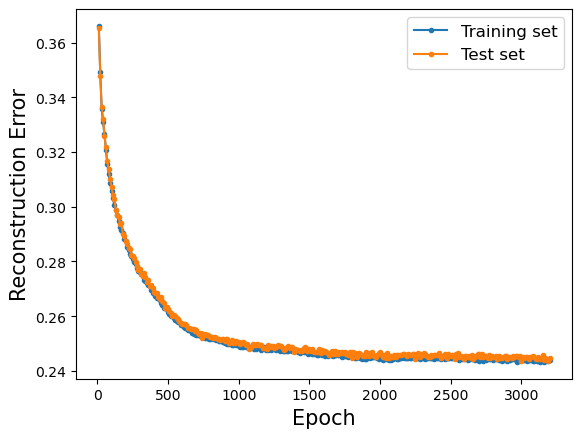

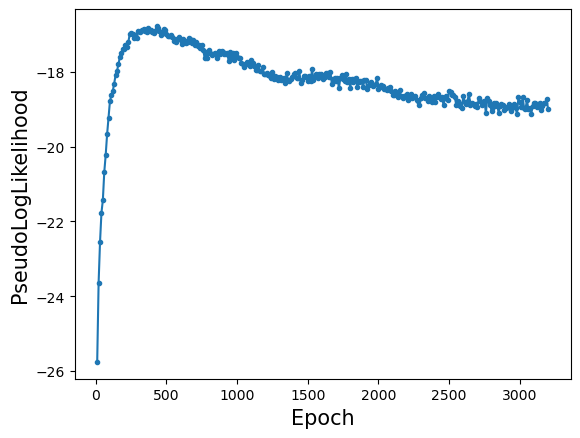

Training RBM 59/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366256 (train), 0.365495 (test), Pseud_Lik: -25.619174, Time: 1.221327, 
Ep 20, Rec er: 0.350246 (train), 0.349189 (test), Pseud_Lik: -23.674154, Time: 1.238936, 
Ep 30, Rec er: 0.336514 (train), 0.335967 (test), Pseud_Lik: -22.521958, Time: 1.295480, 
Ep 40, Rec er: 0.329364 (train), 0.330263 (test), Pseud_Lik: -21.873712, Time: 1.206116, 
Ep 50, Rec er: 0.323604 (train), 0.323883 (test), Pseud_Lik: -21.173814, Time: 1.204800, 
Ep 60, Rec er: 0.318143 (train), 0.319948 (test), Pseud_Lik: -20.442718, Time: 1.211814, 
Ep 70, Rec er: 0.313849 (train), 0.314923 (test), Pseud_Lik: -19.939805, Time: 1.250992, 
Ep 80, Rec er: 0.310783 (train), 0.311648 (test), Pseud_Lik: -19.355941, Time: 1.256957, 
Ep 90, Rec er: 0.307788 (train), 0.309209 (test), Pseud_Lik: -19.055317, Time: 1.271363, 
Ep 100, Rec er: 0.305130 (train), 0.305705 (test), Pse

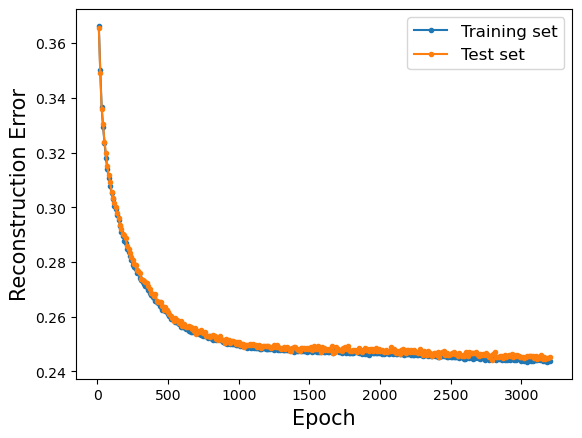

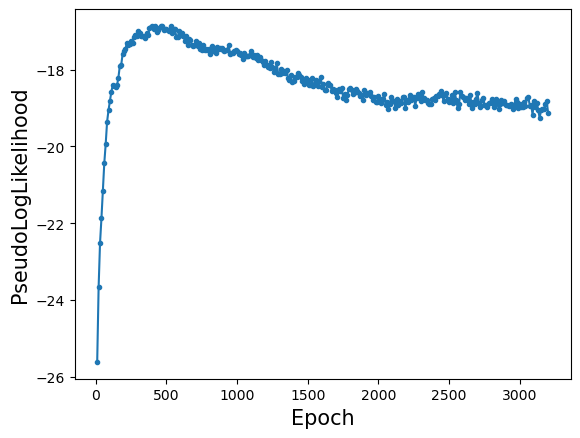

Training RBM 60/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366461 (train), 0.366895 (test), Pseud_Lik: -25.604543, Time: 1.174669, 
Ep 20, Rec er: 0.348739 (train), 0.348803 (test), Pseud_Lik: -23.588128, Time: 1.179155, 
Ep 30, Rec er: 0.335875 (train), 0.336962 (test), Pseud_Lik: -22.427624, Time: 1.187008, 
Ep 40, Rec er: 0.329839 (train), 0.331391 (test), Pseud_Lik: -21.842362, Time: 1.207732, 
Ep 50, Rec er: 0.325267 (train), 0.324864 (test), Pseud_Lik: -21.358913, Time: 1.201654, 
Ep 60, Rec er: 0.319452 (train), 0.319848 (test), Pseud_Lik: -21.184378, Time: 1.207037, 
Ep 70, Rec er: 0.315058 (train), 0.315402 (test), Pseud_Lik: -20.520173, Time: 1.208269, 
Ep 80, Rec er: 0.311301 (train), 0.311298 (test), Pseud_Lik: -19.864841, Time: 1.210323, 
Ep 90, Rec er: 0.307851 (train), 0.308159 (test), Pseud_Lik: -19.303487, Time: 1.214811, 
Ep 100, Rec er: 0.304481 (train), 0.306081 (test), Pse

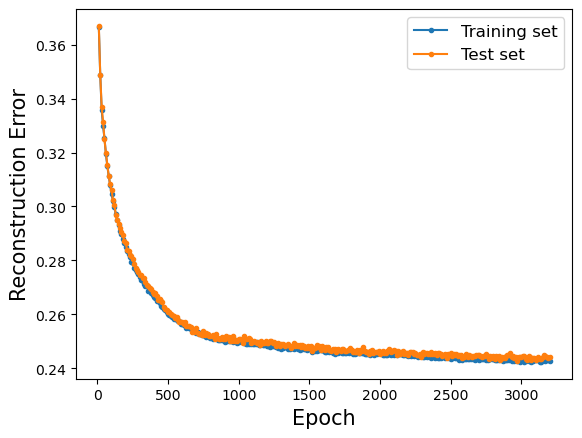

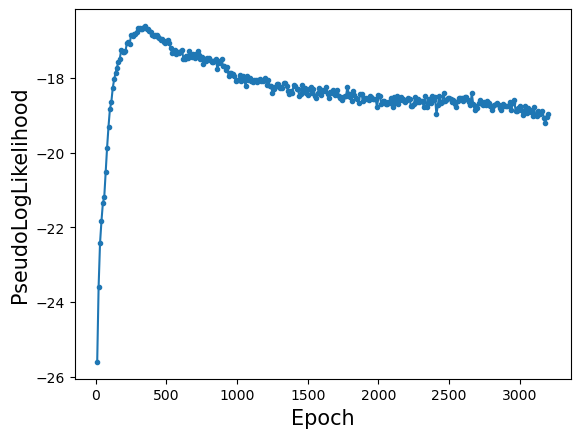

Training RBM 61/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365953 (train), 0.365547 (test), Pseud_Lik: -25.828277, Time: 1.170321, 
Ep 20, Rec er: 0.345918 (train), 0.345722 (test), Pseud_Lik: -23.614235, Time: 1.171698, 
Ep 30, Rec er: 0.333968 (train), 0.334636 (test), Pseud_Lik: -22.207983, Time: 1.200477, 
Ep 40, Rec er: 0.327648 (train), 0.328663 (test), Pseud_Lik: -21.339168, Time: 1.258114, 
Ep 50, Rec er: 0.322075 (train), 0.323125 (test), Pseud_Lik: -20.804663, Time: 1.319971, 
Ep 60, Rec er: 0.318639 (train), 0.318959 (test), Pseud_Lik: -20.258627, Time: 1.242597, 
Ep 70, Rec er: 0.315085 (train), 0.316142 (test), Pseud_Lik: -19.696134, Time: 1.240734, 
Ep 80, Rec er: 0.312347 (train), 0.314100 (test), Pseud_Lik: -19.431844, Time: 1.248307, 
Ep 90, Rec er: 0.310345 (train), 0.310253 (test), Pseud_Lik: -19.246291, Time: 1.243903, 
Ep 100, Rec er: 0.307809 (train), 0.307984 (test), Pse

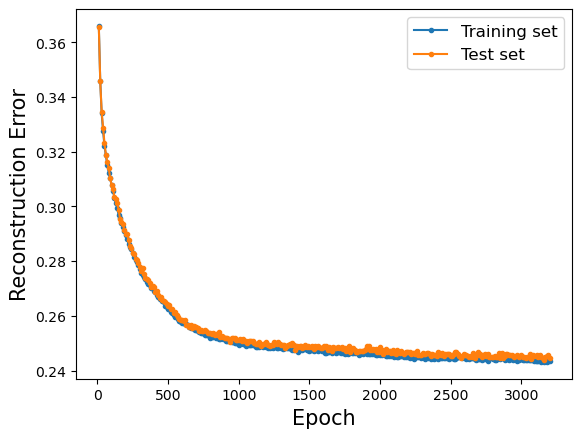

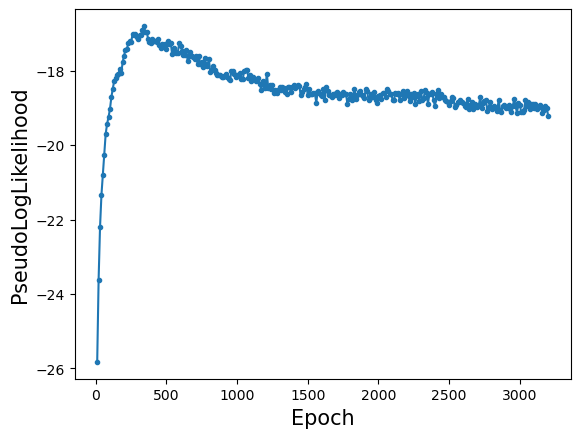

Training RBM 62/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366897 (train), 0.367430 (test), Pseud_Lik: -25.875199, Time: 1.173593, 
Ep 20, Rec er: 0.346927 (train), 0.345795 (test), Pseud_Lik: -23.641568, Time: 1.190442, 
Ep 30, Rec er: 0.334600 (train), 0.335595 (test), Pseud_Lik: -22.152761, Time: 1.193514, 
Ep 40, Rec er: 0.327947 (train), 0.329334 (test), Pseud_Lik: -21.519737, Time: 1.199031, 
Ep 50, Rec er: 0.323731 (train), 0.323233 (test), Pseud_Lik: -21.186298, Time: 1.199256, 
Ep 60, Rec er: 0.319881 (train), 0.320555 (test), Pseud_Lik: -20.782865, Time: 1.203446, 
Ep 70, Rec er: 0.316853 (train), 0.316384 (test), Pseud_Lik: -20.183545, Time: 1.214955, 
Ep 80, Rec er: 0.313037 (train), 0.314678 (test), Pseud_Lik: -19.807204, Time: 1.213376, 
Ep 90, Rec er: 0.310722 (train), 0.310455 (test), Pseud_Lik: -19.347014, Time: 1.212664, 
Ep 100, Rec er: 0.308034 (train), 0.309105 (test), Pse

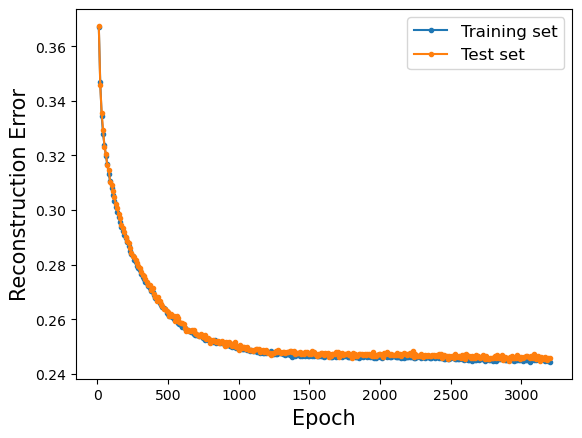

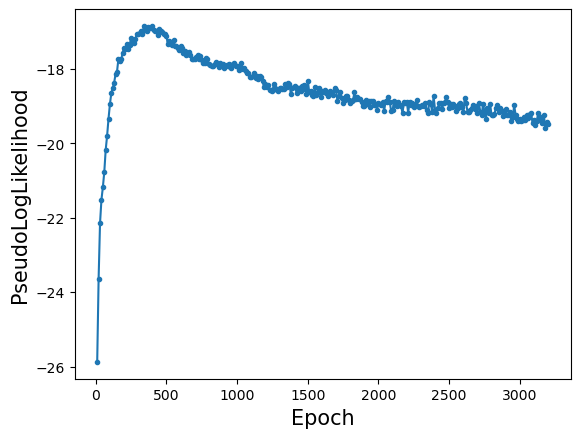

Training RBM 63/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365834 (train), 0.365756 (test), Pseud_Lik: -25.882650, Time: 1.174891, 
Ep 20, Rec er: 0.347205 (train), 0.347653 (test), Pseud_Lik: -23.540040, Time: 1.177917, 
Ep 30, Rec er: 0.335757 (train), 0.336350 (test), Pseud_Lik: -22.478170, Time: 1.200191, 
Ep 40, Rec er: 0.329385 (train), 0.329080 (test), Pseud_Lik: -21.731287, Time: 1.197086, 
Ep 50, Rec er: 0.323338 (train), 0.324433 (test), Pseud_Lik: -21.121169, Time: 1.203355, 
Ep 60, Rec er: 0.318312 (train), 0.319009 (test), Pseud_Lik: -20.574068, Time: 1.209697, 
Ep 70, Rec er: 0.314439 (train), 0.314764 (test), Pseud_Lik: -20.029799, Time: 1.209234, 
Ep 80, Rec er: 0.311382 (train), 0.312933 (test), Pseud_Lik: -19.608663, Time: 1.216748, 
Ep 90, Rec er: 0.309099 (train), 0.309358 (test), Pseud_Lik: -19.253298, Time: 1.218119, 
Ep 100, Rec er: 0.306462 (train), 0.307416 (test), Pse

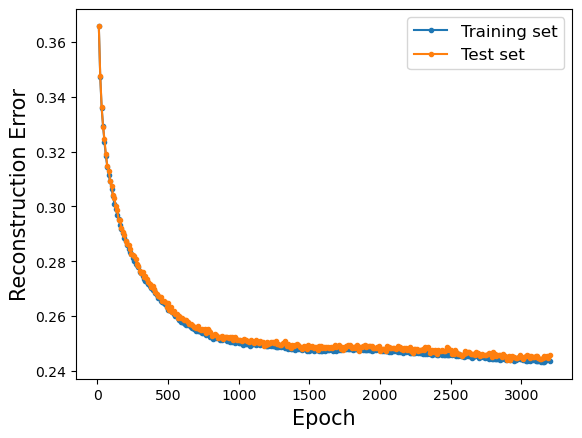

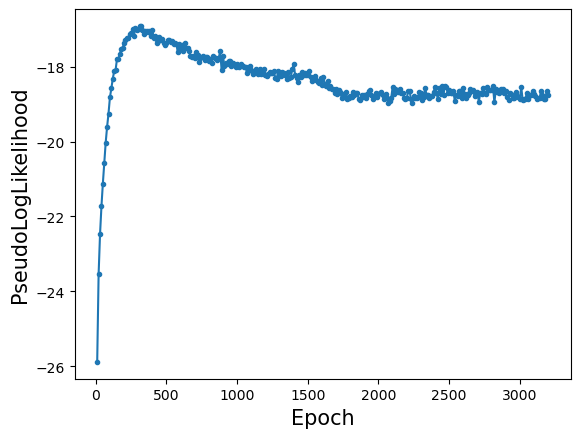

Training RBM 64/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367276 (train), 0.367417 (test), Pseud_Lik: -25.985658, Time: 1.175587, 
Ep 20, Rec er: 0.349135 (train), 0.348588 (test), Pseud_Lik: -23.692393, Time: 1.195224, 
Ep 30, Rec er: 0.336064 (train), 0.336145 (test), Pseud_Lik: -22.485089, Time: 1.214768, 
Ep 40, Rec er: 0.329541 (train), 0.330564 (test), Pseud_Lik: -21.834763, Time: 1.260444, 
Ep 50, Rec er: 0.323924 (train), 0.324667 (test), Pseud_Lik: -21.233635, Time: 1.208645, 
Ep 60, Rec er: 0.319107 (train), 0.319842 (test), Pseud_Lik: -20.544841, Time: 1.219242, 
Ep 70, Rec er: 0.314613 (train), 0.316483 (test), Pseud_Lik: -20.019506, Time: 1.217915, 
Ep 80, Rec er: 0.311202 (train), 0.311673 (test), Pseud_Lik: -19.458508, Time: 1.216501, 
Ep 90, Rec er: 0.308653 (train), 0.309369 (test), Pseud_Lik: -19.074146, Time: 1.218414, 
Ep 100, Rec er: 0.305757 (train), 0.307039 (test), Pse

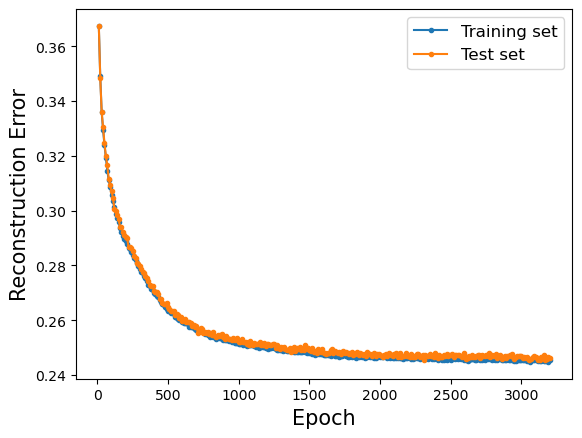

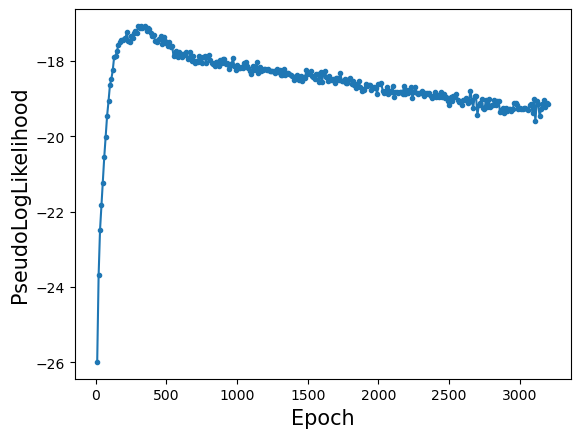

Training RBM 65/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365856 (train), 0.366100 (test), Pseud_Lik: -25.709800, Time: 1.171852, 
Ep 20, Rec er: 0.347413 (train), 0.347638 (test), Pseud_Lik: -23.542966, Time: 1.174385, 
Ep 30, Rec er: 0.335443 (train), 0.336236 (test), Pseud_Lik: -22.417322, Time: 1.188704, 
Ep 40, Rec er: 0.329615 (train), 0.331362 (test), Pseud_Lik: -21.860139, Time: 1.192147, 
Ep 50, Rec er: 0.324935 (train), 0.326209 (test), Pseud_Lik: -21.551623, Time: 1.200412, 
Ep 60, Rec er: 0.319815 (train), 0.319239 (test), Pseud_Lik: -21.075746, Time: 1.207514, 
Ep 70, Rec er: 0.315432 (train), 0.316181 (test), Pseud_Lik: -20.482906, Time: 1.210519, 
Ep 80, Rec er: 0.311832 (train), 0.313194 (test), Pseud_Lik: -19.685346, Time: 1.219812, 
Ep 90, Rec er: 0.309092 (train), 0.309439 (test), Pseud_Lik: -19.419847, Time: 1.212724, 
Ep 100, Rec er: 0.306791 (train), 0.307281 (test), Pse

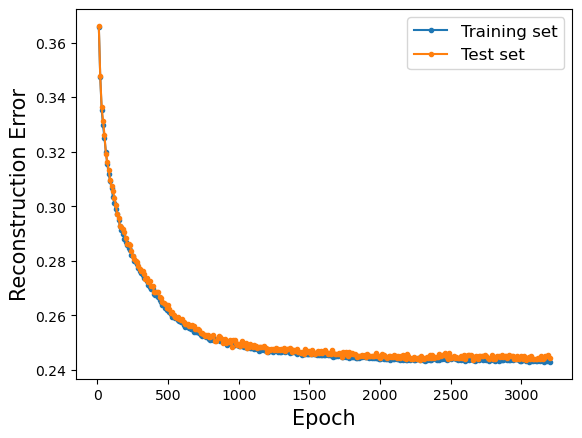

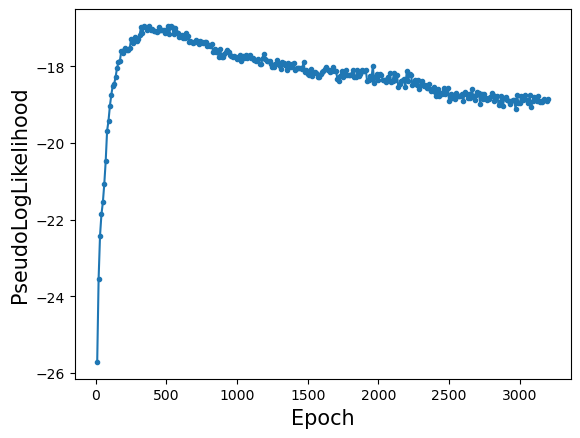

Training RBM 66/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366432 (train), 0.366133 (test), Pseud_Lik: -26.025039, Time: 1.177625, 
Ep 20, Rec er: 0.345267 (train), 0.345320 (test), Pseud_Lik: -23.560615, Time: 1.178398, 
Ep 30, Rec er: 0.335044 (train), 0.336581 (test), Pseud_Lik: -22.165572, Time: 1.191036, 
Ep 40, Rec er: 0.329399 (train), 0.330781 (test), Pseud_Lik: -21.554231, Time: 1.211079, 
Ep 50, Rec er: 0.325333 (train), 0.325350 (test), Pseud_Lik: -21.036274, Time: 1.229963, 
Ep 60, Rec er: 0.321418 (train), 0.322702 (test), Pseud_Lik: -20.658686, Time: 1.261750, 
Ep 70, Rec er: 0.318485 (train), 0.320338 (test), Pseud_Lik: -20.251941, Time: 1.247775, 
Ep 80, Rec er: 0.316120 (train), 0.317245 (test), Pseud_Lik: -19.964515, Time: 1.318377, 
Ep 90, Rec er: 0.313590 (train), 0.313916 (test), Pseud_Lik: -19.586259, Time: 1.318909, 
Ep 100, Rec er: 0.310643 (train), 0.311830 (test), Pse

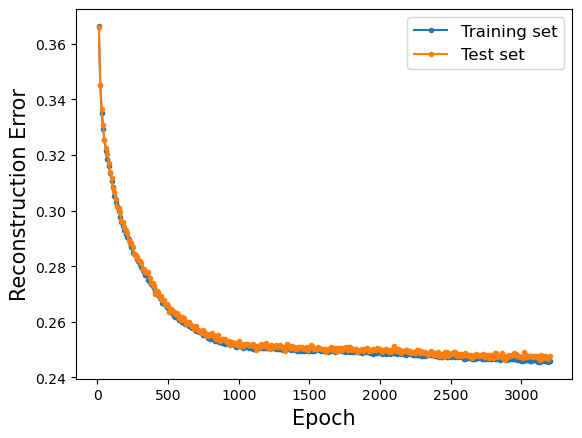

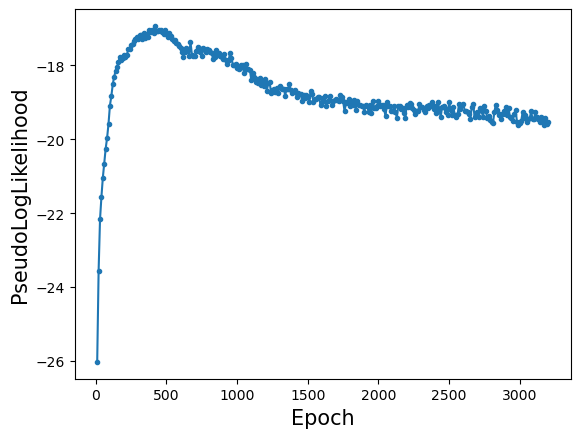

Training RBM 67/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365348 (train), 0.364125 (test), Pseud_Lik: -25.705245, Time: 1.229473, 
Ep 20, Rec er: 0.346297 (train), 0.345447 (test), Pseud_Lik: -23.411246, Time: 1.175879, 
Ep 30, Rec er: 0.334487 (train), 0.335198 (test), Pseud_Lik: -22.339076, Time: 1.186552, 
Ep 40, Rec er: 0.327880 (train), 0.330183 (test), Pseud_Lik: -21.607788, Time: 1.198655, 
Ep 50, Rec er: 0.322245 (train), 0.323598 (test), Pseud_Lik: -20.767494, Time: 1.199144, 
Ep 60, Rec er: 0.318236 (train), 0.318361 (test), Pseud_Lik: -20.354151, Time: 1.204004, 
Ep 70, Rec er: 0.314129 (train), 0.314828 (test), Pseud_Lik: -19.961207, Time: 1.212718, 
Ep 80, Rec er: 0.310754 (train), 0.311331 (test), Pseud_Lik: -19.657317, Time: 1.206662, 
Ep 90, Rec er: 0.308052 (train), 0.309047 (test), Pseud_Lik: -19.357897, Time: 1.206278, 
Ep 100, Rec er: 0.305848 (train), 0.305967 (test), Pse

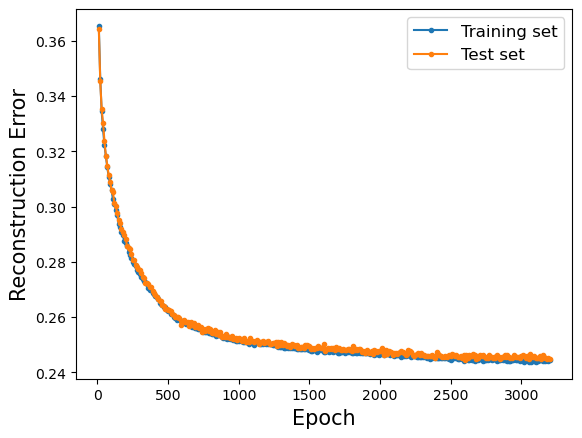

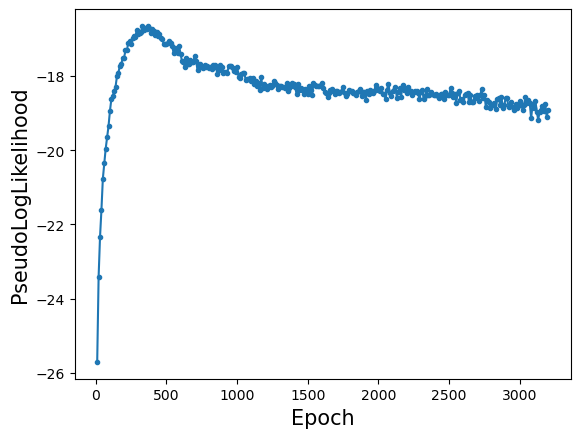

Training RBM 68/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366098 (train), 0.365494 (test), Pseud_Lik: -25.825627, Time: 1.185218, 
Ep 20, Rec er: 0.347864 (train), 0.347277 (test), Pseud_Lik: -23.536859, Time: 1.254787, 
Ep 30, Rec er: 0.335699 (train), 0.335509 (test), Pseud_Lik: -22.452360, Time: 1.191979, 
Ep 40, Rec er: 0.329652 (train), 0.330189 (test), Pseud_Lik: -21.711981, Time: 1.197327, 
Ep 50, Rec er: 0.323752 (train), 0.325069 (test), Pseud_Lik: -21.222382, Time: 1.203065, 
Ep 60, Rec er: 0.318522 (train), 0.318886 (test), Pseud_Lik: -20.743370, Time: 1.210332, 
Ep 70, Rec er: 0.314454 (train), 0.315566 (test), Pseud_Lik: -20.327426, Time: 1.213865, 
Ep 80, Rec er: 0.310870 (train), 0.312453 (test), Pseud_Lik: -19.751861, Time: 1.235432, 
Ep 90, Rec er: 0.307883 (train), 0.309048 (test), Pseud_Lik: -19.051407, Time: 1.235181, 
Ep 100, Rec er: 0.305165 (train), 0.306250 (test), Pse

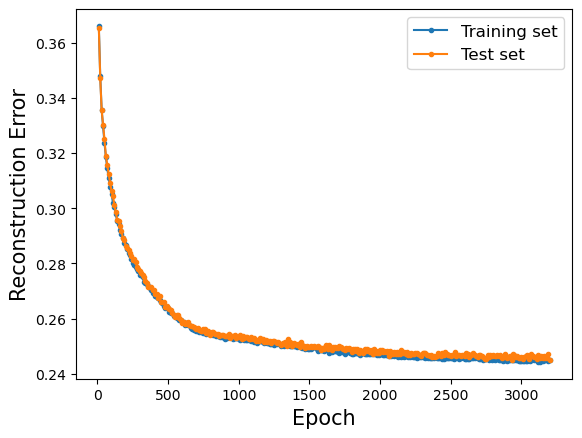

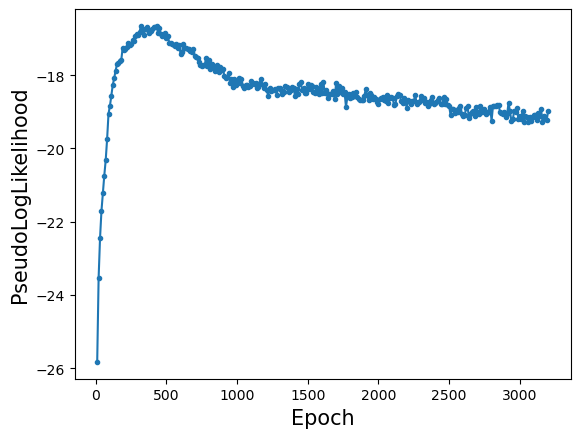

Training RBM 69/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.368910 (train), 0.367961 (test), Pseud_Lik: -26.342597, Time: 1.175479, 
Ep 20, Rec er: 0.347602 (train), 0.345852 (test), Pseud_Lik: -23.698165, Time: 1.176559, 
Ep 30, Rec er: 0.335539 (train), 0.336863 (test), Pseud_Lik: -22.227656, Time: 1.195402, 
Ep 40, Rec er: 0.329725 (train), 0.331573 (test), Pseud_Lik: -21.448028, Time: 1.207244, 
Ep 50, Rec er: 0.324558 (train), 0.325602 (test), Pseud_Lik: -20.903041, Time: 1.205430, 
Ep 60, Rec er: 0.320502 (train), 0.321897 (test), Pseud_Lik: -20.220135, Time: 1.206115, 
Ep 70, Rec er: 0.317996 (train), 0.319431 (test), Pseud_Lik: -19.857757, Time: 1.210129, 
Ep 80, Rec er: 0.315583 (train), 0.316470 (test), Pseud_Lik: -19.531065, Time: 1.211635, 
Ep 90, Rec er: 0.313866 (train), 0.314845 (test), Pseud_Lik: -19.217157, Time: 1.216101, 
Ep 100, Rec er: 0.311367 (train), 0.312242 (test), Pse

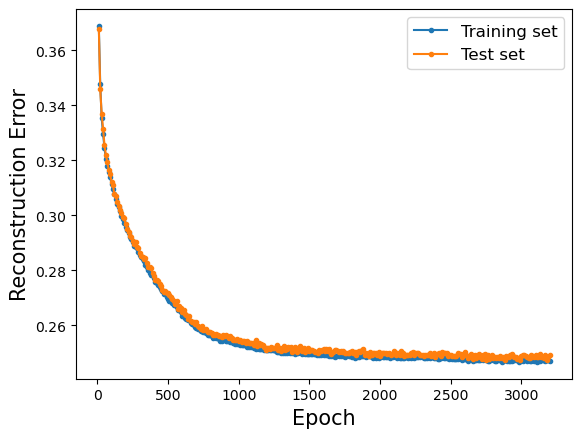

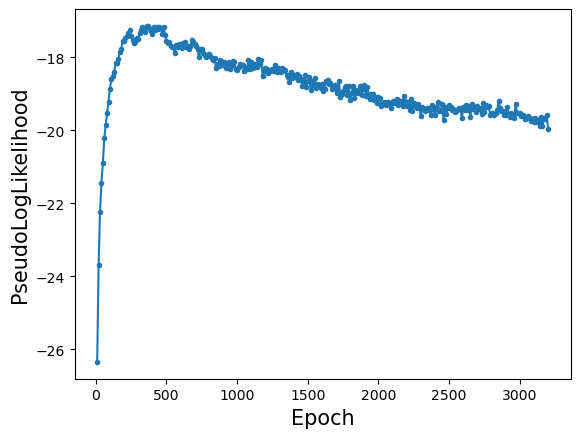

Training RBM 70/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365760 (train), 0.365328 (test), Pseud_Lik: -25.571192, Time: 1.202179, 
Ep 20, Rec er: 0.347994 (train), 0.348745 (test), Pseud_Lik: -23.759225, Time: 1.177039, 
Ep 30, Rec er: 0.335621 (train), 0.334277 (test), Pseud_Lik: -22.556455, Time: 1.239124, 
Ep 40, Rec er: 0.328771 (train), 0.329391 (test), Pseud_Lik: -21.781979, Time: 1.231543, 
Ep 50, Rec er: 0.322853 (train), 0.322987 (test), Pseud_Lik: -21.139374, Time: 1.226762, 
Ep 60, Rec er: 0.317089 (train), 0.318128 (test), Pseud_Lik: -20.394950, Time: 1.326207, 
Ep 70, Rec er: 0.313623 (train), 0.313472 (test), Pseud_Lik: -19.784031, Time: 1.282904, 
Ep 80, Rec er: 0.309236 (train), 0.309891 (test), Pseud_Lik: -19.284674, Time: 1.213860, 
Ep 90, Rec er: 0.306554 (train), 0.307909 (test), Pseud_Lik: -18.921518, Time: 1.215803, 
Ep 100, Rec er: 0.304498 (train), 0.305197 (test), Pse

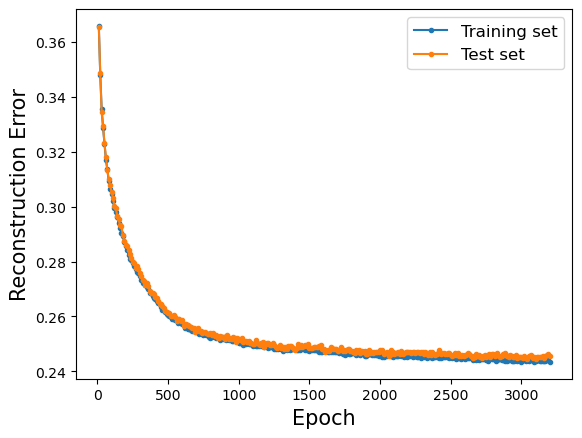

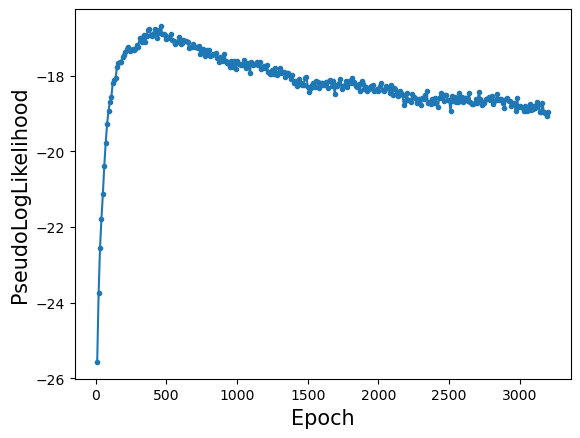

Training RBM 71/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365159 (train), 0.364852 (test), Pseud_Lik: -25.608150, Time: 1.176911, 
Ep 20, Rec er: 0.347382 (train), 0.347589 (test), Pseud_Lik: -23.501628, Time: 1.171474, 
Ep 30, Rec er: 0.335371 (train), 0.335614 (test), Pseud_Lik: -22.471415, Time: 1.199161, 
Ep 40, Rec er: 0.329492 (train), 0.329691 (test), Pseud_Lik: -21.996876, Time: 1.210849, 
Ep 50, Rec er: 0.324793 (train), 0.325858 (test), Pseud_Lik: -21.492883, Time: 1.221893, 
Ep 60, Rec er: 0.319704 (train), 0.320316 (test), Pseud_Lik: -20.829795, Time: 1.229994, 
Ep 70, Rec er: 0.314605 (train), 0.315292 (test), Pseud_Lik: -20.218841, Time: 1.247449, 
Ep 80, Rec er: 0.310533 (train), 0.312214 (test), Pseud_Lik: -19.576541, Time: 1.251981, 
Ep 90, Rec er: 0.307405 (train), 0.308895 (test), Pseud_Lik: -19.205153, Time: 1.255287, 
Ep 100, Rec er: 0.304350 (train), 0.304938 (test), Pse

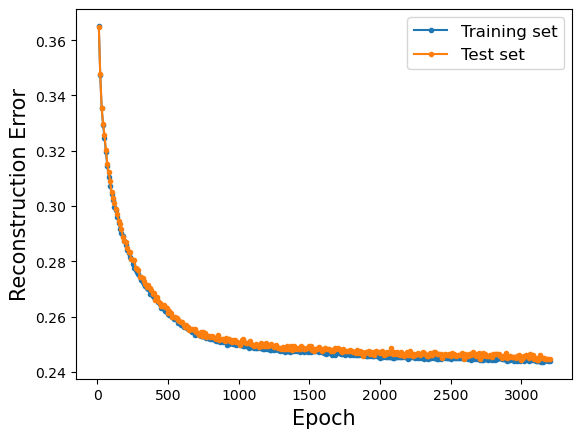

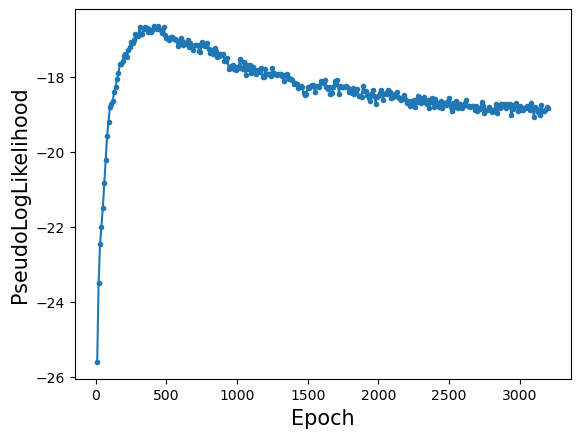

Training RBM 72/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.364937 (train), 0.364250 (test), Pseud_Lik: -25.596515, Time: 1.175076, 
Ep 20, Rec er: 0.348591 (train), 0.347728 (test), Pseud_Lik: -23.591459, Time: 1.178481, 
Ep 30, Rec er: 0.335197 (train), 0.334863 (test), Pseud_Lik: -22.356002, Time: 1.185264, 
Ep 40, Rec er: 0.328158 (train), 0.329136 (test), Pseud_Lik: -21.748998, Time: 1.215254, 
Ep 50, Rec er: 0.322438 (train), 0.323862 (test), Pseud_Lik: -21.122389, Time: 1.204492, 
Ep 60, Rec er: 0.317925 (train), 0.318606 (test), Pseud_Lik: -20.632455, Time: 1.206210, 
Ep 70, Rec er: 0.314405 (train), 0.313781 (test), Pseud_Lik: -19.924308, Time: 1.217648, 
Ep 80, Rec er: 0.310643 (train), 0.311837 (test), Pseud_Lik: -19.539992, Time: 1.237194, 
Ep 90, Rec er: 0.308571 (train), 0.308259 (test), Pseud_Lik: -19.048878, Time: 1.233654, 
Ep 100, Rec er: 0.305592 (train), 0.305445 (test), Pse

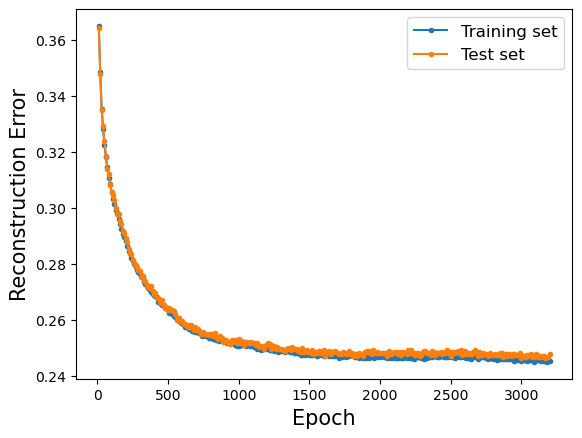

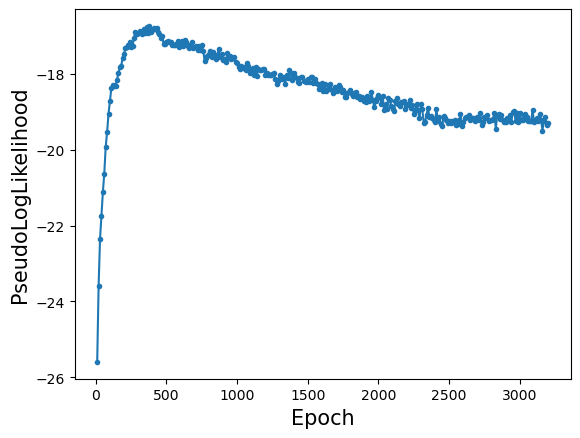

Training RBM 73/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365901 (train), 0.366394 (test), Pseud_Lik: -25.402226, Time: 1.184949, 
Ep 20, Rec er: 0.347940 (train), 0.348098 (test), Pseud_Lik: -23.611286, Time: 1.171079, 
Ep 30, Rec er: 0.335097 (train), 0.334802 (test), Pseud_Lik: -22.372910, Time: 1.188772, 
Ep 40, Rec er: 0.327698 (train), 0.328584 (test), Pseud_Lik: -21.620537, Time: 1.194334, 
Ep 50, Rec er: 0.322294 (train), 0.322272 (test), Pseud_Lik: -21.098163, Time: 1.201103, 
Ep 60, Rec er: 0.316999 (train), 0.316942 (test), Pseud_Lik: -20.479309, Time: 1.201524, 
Ep 70, Rec er: 0.313188 (train), 0.313900 (test), Pseud_Lik: -20.045523, Time: 1.206376, 
Ep 80, Rec er: 0.310109 (train), 0.310355 (test), Pseud_Lik: -19.626205, Time: 1.209954, 
Ep 90, Rec er: 0.307544 (train), 0.307245 (test), Pseud_Lik: -19.330866, Time: 1.216432, 
Ep 100, Rec er: 0.304546 (train), 0.305152 (test), Pse

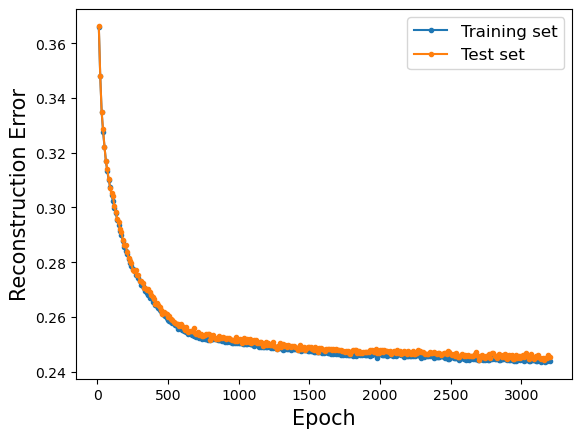

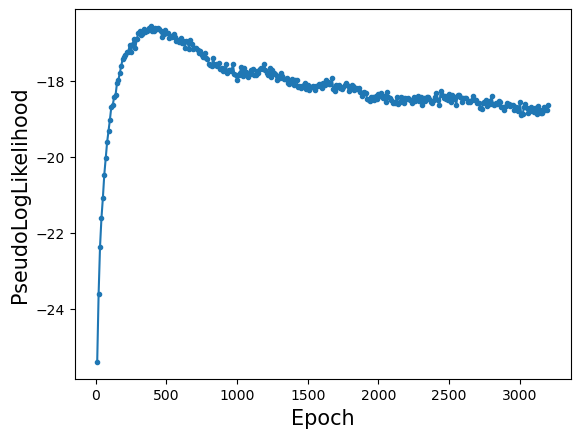

Training RBM 74/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365541 (train), 0.364386 (test), Pseud_Lik: -25.940976, Time: 1.180293, 
Ep 20, Rec er: 0.345155 (train), 0.344766 (test), Pseud_Lik: -23.490277, Time: 1.181827, 
Ep 30, Rec er: 0.334960 (train), 0.335347 (test), Pseud_Lik: -22.184458, Time: 1.200168, 
Ep 40, Rec er: 0.328926 (train), 0.329838 (test), Pseud_Lik: -21.482546, Time: 1.198460, 
Ep 50, Rec er: 0.324033 (train), 0.323917 (test), Pseud_Lik: -20.936736, Time: 1.204100, 
Ep 60, Rec er: 0.319725 (train), 0.320169 (test), Pseud_Lik: -20.424003, Time: 1.212953, 
Ep 70, Rec er: 0.315607 (train), 0.317044 (test), Pseud_Lik: -19.934480, Time: 1.213624, 
Ep 80, Rec er: 0.313419 (train), 0.313653 (test), Pseud_Lik: -19.584481, Time: 1.212428, 
Ep 90, Rec er: 0.309925 (train), 0.311489 (test), Pseud_Lik: -19.195800, Time: 1.212413, 
Ep 100, Rec er: 0.308361 (train), 0.309345 (test), Pse

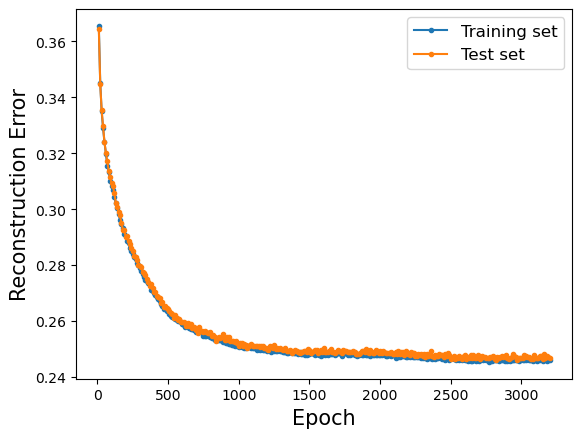

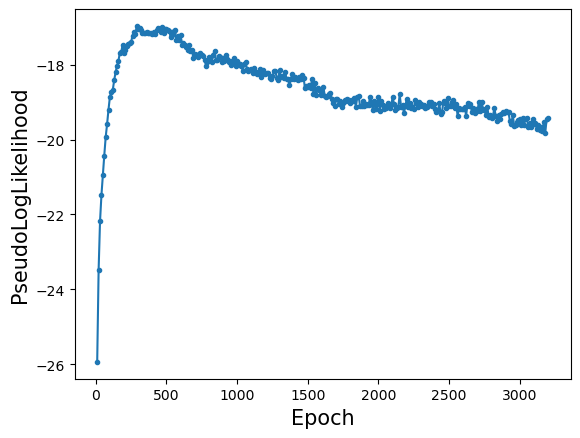

Training RBM 75/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365762 (train), 0.365228 (test), Pseud_Lik: -25.425210, Time: 1.236284, 
Ep 20, Rec er: 0.349855 (train), 0.350019 (test), Pseud_Lik: -23.713822, Time: 1.177433, 
Ep 30, Rec er: 0.336225 (train), 0.337183 (test), Pseud_Lik: -22.531867, Time: 1.199852, 
Ep 40, Rec er: 0.329588 (train), 0.331684 (test), Pseud_Lik: -22.013880, Time: 1.192997, 
Ep 50, Rec er: 0.324555 (train), 0.325933 (test), Pseud_Lik: -21.462505, Time: 1.192776, 
Ep 60, Rec er: 0.319194 (train), 0.319916 (test), Pseud_Lik: -20.789285, Time: 1.201726, 
Ep 70, Rec er: 0.314578 (train), 0.314809 (test), Pseud_Lik: -20.278013, Time: 1.202721, 
Ep 80, Rec er: 0.309818 (train), 0.310769 (test), Pseud_Lik: -19.797536, Time: 1.213249, 
Ep 90, Rec er: 0.305922 (train), 0.307586 (test), Pseud_Lik: -19.191129, Time: 1.208236, 
Ep 100, Rec er: 0.303376 (train), 0.304755 (test), Pse

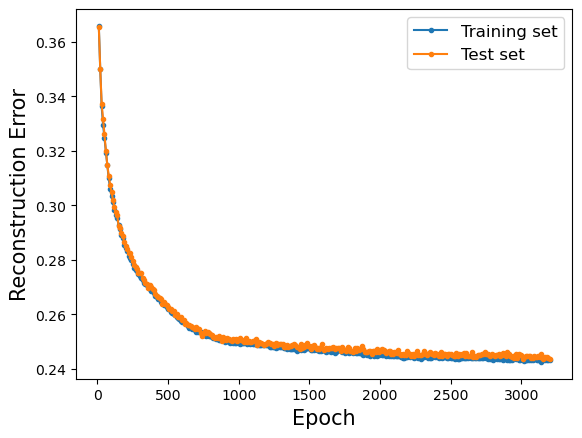

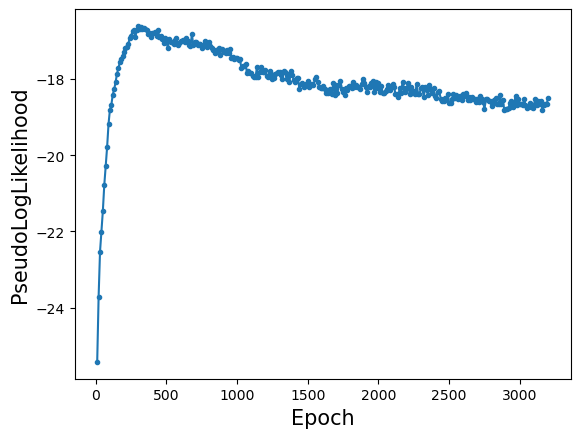

Training RBM 76/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365792 (train), 0.365989 (test), Pseud_Lik: -25.713424, Time: 1.191438, 
Ep 20, Rec er: 0.347321 (train), 0.346631 (test), Pseud_Lik: -23.532874, Time: 1.178340, 
Ep 30, Rec er: 0.334772 (train), 0.334234 (test), Pseud_Lik: -22.377666, Time: 1.221036, 
Ep 40, Rec er: 0.328858 (train), 0.328689 (test), Pseud_Lik: -21.560040, Time: 1.208681, 
Ep 50, Rec er: 0.323800 (train), 0.324531 (test), Pseud_Lik: -21.079417, Time: 1.247037, 
Ep 60, Rec er: 0.318836 (train), 0.319170 (test), Pseud_Lik: -20.506028, Time: 1.242315, 
Ep 70, Rec er: 0.314537 (train), 0.315823 (test), Pseud_Lik: -19.855942, Time: 1.253962, 
Ep 80, Rec er: 0.311651 (train), 0.312920 (test), Pseud_Lik: -19.445904, Time: 1.255252, 
Ep 90, Rec er: 0.308964 (train), 0.310106 (test), Pseud_Lik: -19.065826, Time: 1.263655, 
Ep 100, Rec er: 0.306648 (train), 0.308173 (test), Pse

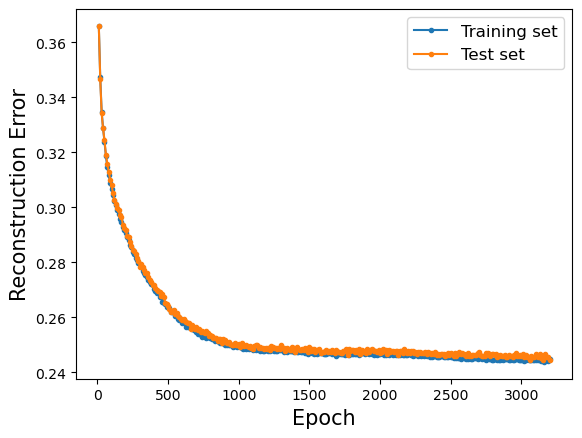

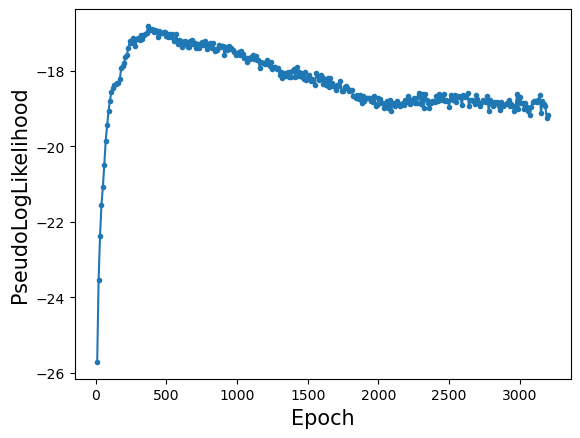

Training RBM 77/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365137 (train), 0.365427 (test), Pseud_Lik: -25.611829, Time: 1.195513, 
Ep 20, Rec er: 0.346489 (train), 0.346739 (test), Pseud_Lik: -23.531464, Time: 1.219579, 
Ep 30, Rec er: 0.336215 (train), 0.335345 (test), Pseud_Lik: -22.401547, Time: 1.191155, 
Ep 40, Rec er: 0.329711 (train), 0.330156 (test), Pseud_Lik: -21.859553, Time: 1.196462, 
Ep 50, Rec er: 0.323878 (train), 0.324641 (test), Pseud_Lik: -21.349569, Time: 1.248249, 
Ep 60, Rec er: 0.319634 (train), 0.320842 (test), Pseud_Lik: -20.818286, Time: 1.209802, 
Ep 70, Rec er: 0.315586 (train), 0.316112 (test), Pseud_Lik: -20.202142, Time: 1.210566, 
Ep 80, Rec er: 0.312061 (train), 0.313397 (test), Pseud_Lik: -19.782399, Time: 1.217726, 
Ep 90, Rec er: 0.308918 (train), 0.309533 (test), Pseud_Lik: -19.293723, Time: 1.212265, 
Ep 100, Rec er: 0.306221 (train), 0.307392 (test), Pse

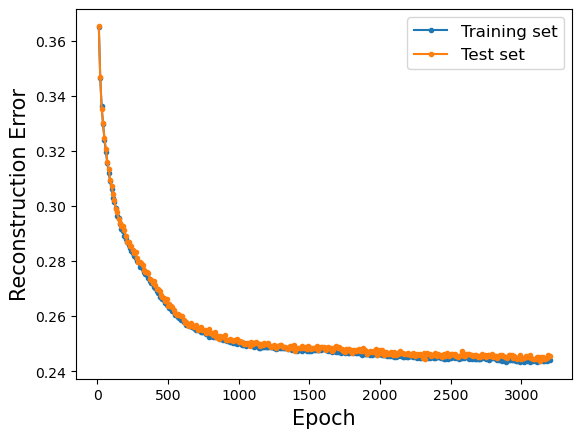

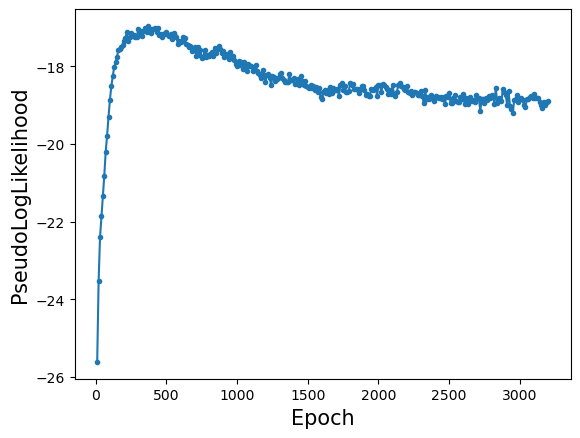

Training RBM 78/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365598 (train), 0.366194 (test), Pseud_Lik: -25.679342, Time: 1.176265, 
Ep 20, Rec er: 0.348163 (train), 0.350087 (test), Pseud_Lik: -23.656060, Time: 1.170616, 
Ep 30, Rec er: 0.335686 (train), 0.336072 (test), Pseud_Lik: -22.479549, Time: 1.192455, 
Ep 40, Rec er: 0.328950 (train), 0.329608 (test), Pseud_Lik: -21.677189, Time: 1.200938, 
Ep 50, Rec er: 0.322646 (train), 0.323981 (test), Pseud_Lik: -21.046604, Time: 1.219185, 
Ep 60, Rec er: 0.317383 (train), 0.317856 (test), Pseud_Lik: -20.612449, Time: 1.205530, 
Ep 70, Rec er: 0.313802 (train), 0.314405 (test), Pseud_Lik: -20.296078, Time: 1.206412, 
Ep 80, Rec er: 0.309888 (train), 0.310545 (test), Pseud_Lik: -19.880706, Time: 1.211328, 
Ep 90, Rec er: 0.306687 (train), 0.307280 (test), Pseud_Lik: -19.402167, Time: 1.214012, 
Ep 100, Rec er: 0.304771 (train), 0.305203 (test), Pse

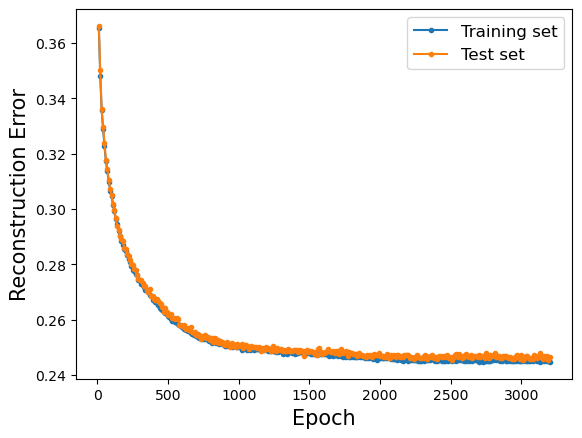

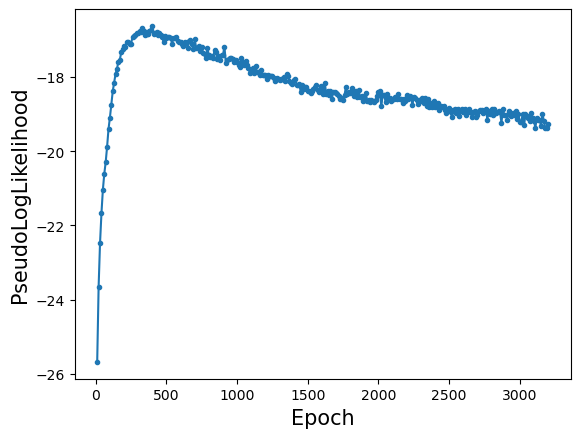

Training RBM 79/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366665 (train), 0.366398 (test), Pseud_Lik: -25.903439, Time: 1.179443, 
Ep 20, Rec er: 0.346746 (train), 0.346798 (test), Pseud_Lik: -23.528927, Time: 1.188686, 
Ep 30, Rec er: 0.335350 (train), 0.337027 (test), Pseud_Lik: -22.312767, Time: 1.194587, 
Ep 40, Rec er: 0.330086 (train), 0.330022 (test), Pseud_Lik: -21.454474, Time: 1.197180, 
Ep 50, Rec er: 0.325488 (train), 0.325795 (test), Pseud_Lik: -21.089078, Time: 1.240058, 
Ep 60, Rec er: 0.321255 (train), 0.321308 (test), Pseud_Lik: -20.813793, Time: 1.234004, 
Ep 70, Rec er: 0.318191 (train), 0.319009 (test), Pseud_Lik: -20.503717, Time: 1.323753, 
Ep 80, Rec er: 0.315316 (train), 0.315905 (test), Pseud_Lik: -20.260129, Time: 1.229928, 
Ep 90, Rec er: 0.312052 (train), 0.314172 (test), Pseud_Lik: -19.863521, Time: 1.214752, 
Ep 100, Rec er: 0.309875 (train), 0.310105 (test), Pse

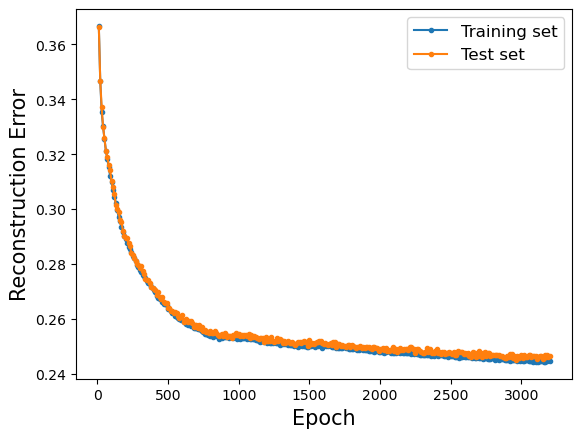

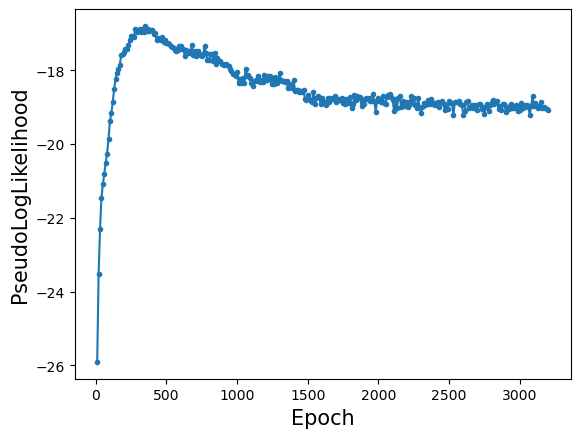

Training RBM 80/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365802 (train), 0.365131 (test), Pseud_Lik: -25.682636, Time: 1.168903, 
Ep 20, Rec er: 0.347354 (train), 0.345858 (test), Pseud_Lik: -23.614439, Time: 1.167421, 
Ep 30, Rec er: 0.335407 (train), 0.336147 (test), Pseud_Lik: -22.448721, Time: 1.179703, 
Ep 40, Rec er: 0.329574 (train), 0.329773 (test), Pseud_Lik: -21.928020, Time: 1.222840, 
Ep 50, Rec er: 0.322714 (train), 0.324408 (test), Pseud_Lik: -21.080415, Time: 1.197264, 
Ep 60, Rec er: 0.317701 (train), 0.317675 (test), Pseud_Lik: -20.209722, Time: 1.193939, 
Ep 70, Rec er: 0.312699 (train), 0.313827 (test), Pseud_Lik: -19.731100, Time: 1.203256, 
Ep 80, Rec er: 0.309381 (train), 0.309919 (test), Pseud_Lik: -19.212889, Time: 1.202278, 
Ep 90, Rec er: 0.306902 (train), 0.307280 (test), Pseud_Lik: -18.867732, Time: 1.210806, 
Ep 100, Rec er: 0.304280 (train), 0.305030 (test), Pse

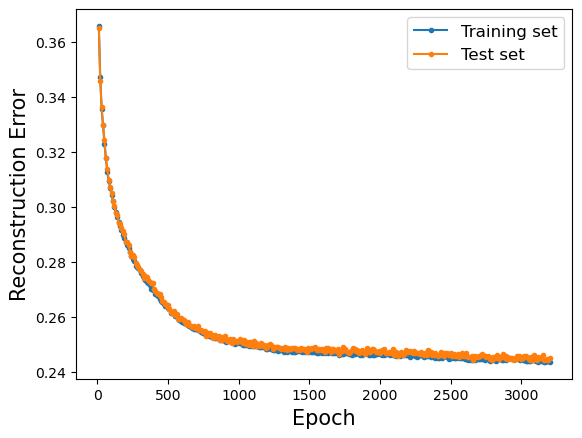

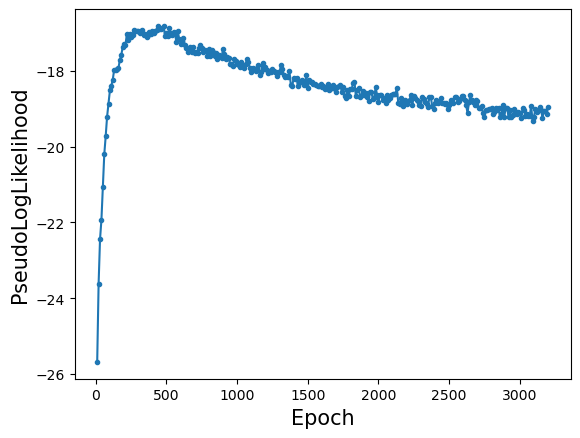

Training RBM 81/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365496 (train), 0.365486 (test), Pseud_Lik: -25.798889, Time: 1.170824, 
Ep 20, Rec er: 0.345889 (train), 0.345267 (test), Pseud_Lik: -23.530156, Time: 1.171132, 
Ep 30, Rec er: 0.334261 (train), 0.334811 (test), Pseud_Lik: -22.340245, Time: 1.185090, 
Ep 40, Rec er: 0.327880 (train), 0.328259 (test), Pseud_Lik: -21.818408, Time: 1.193671, 
Ep 50, Rec er: 0.323578 (train), 0.324911 (test), Pseud_Lik: -21.096168, Time: 1.198743, 
Ep 60, Rec er: 0.319054 (train), 0.319098 (test), Pseud_Lik: -20.551313, Time: 1.238778, 
Ep 70, Rec er: 0.315065 (train), 0.316259 (test), Pseud_Lik: -20.139240, Time: 1.249550, 
Ep 80, Rec er: 0.311913 (train), 0.313316 (test), Pseud_Lik: -19.589235, Time: 1.242886, 
Ep 90, Rec er: 0.308704 (train), 0.308923 (test), Pseud_Lik: -19.367834, Time: 1.254577, 
Ep 100, Rec er: 0.306399 (train), 0.307722 (test), Pse

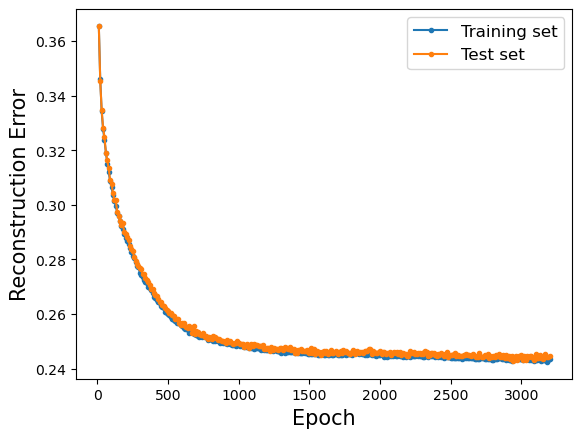

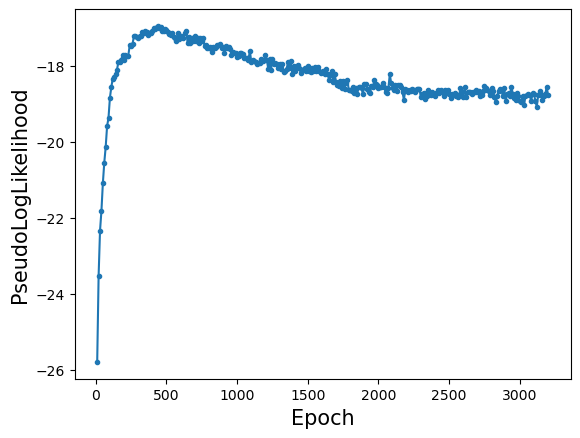

Training RBM 82/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365076 (train), 0.365939 (test), Pseud_Lik: -25.727099, Time: 1.172364, 
Ep 20, Rec er: 0.345931 (train), 0.346052 (test), Pseud_Lik: -23.628624, Time: 1.170542, 
Ep 30, Rec er: 0.334912 (train), 0.334792 (test), Pseud_Lik: -22.269311, Time: 1.191917, 
Ep 40, Rec er: 0.328926 (train), 0.329939 (test), Pseud_Lik: -21.619343, Time: 1.188828, 
Ep 50, Rec er: 0.323470 (train), 0.323936 (test), Pseud_Lik: -20.986381, Time: 1.194340, 
Ep 60, Rec er: 0.319326 (train), 0.320420 (test), Pseud_Lik: -20.467486, Time: 1.218546, 
Ep 70, Rec er: 0.315264 (train), 0.315597 (test), Pseud_Lik: -19.842093, Time: 1.226356, 
Ep 80, Rec er: 0.311627 (train), 0.311430 (test), Pseud_Lik: -19.538902, Time: 1.227924, 
Ep 90, Rec er: 0.308634 (train), 0.310156 (test), Pseud_Lik: -19.256604, Time: 1.250053, 
Ep 100, Rec er: 0.305578 (train), 0.306878 (test), Pse

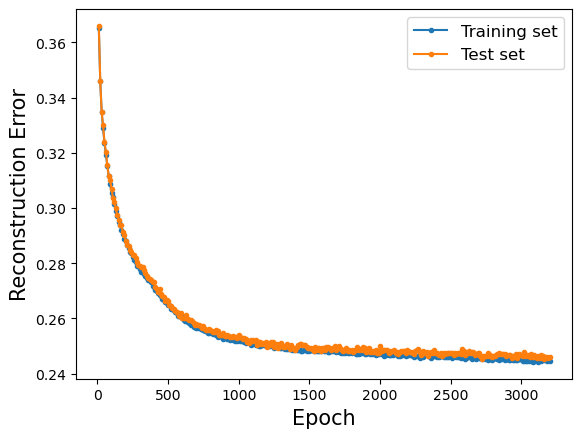

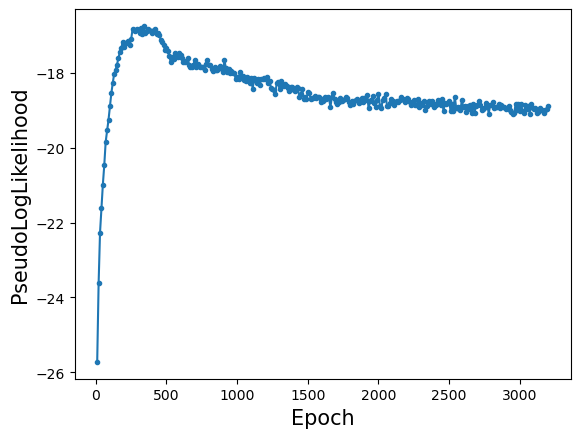

Training RBM 83/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.364481 (train), 0.364227 (test), Pseud_Lik: -25.552038, Time: 1.219172, 
Ep 20, Rec er: 0.345316 (train), 0.345708 (test), Pseud_Lik: -23.441094, Time: 1.202689, 
Ep 30, Rec er: 0.334389 (train), 0.334633 (test), Pseud_Lik: -22.300662, Time: 1.209397, 
Ep 40, Rec er: 0.327904 (train), 0.328400 (test), Pseud_Lik: -21.716076, Time: 1.193279, 
Ep 50, Rec er: 0.322158 (train), 0.322881 (test), Pseud_Lik: -21.164864, Time: 1.195343, 
Ep 60, Rec er: 0.317705 (train), 0.319155 (test), Pseud_Lik: -20.588219, Time: 1.204222, 
Ep 70, Rec er: 0.313759 (train), 0.314073 (test), Pseud_Lik: -20.011764, Time: 1.262671, 
Ep 80, Rec er: 0.310322 (train), 0.310723 (test), Pseud_Lik: -19.490240, Time: 1.212863, 
Ep 90, Rec er: 0.306873 (train), 0.309567 (test), Pseud_Lik: -19.086660, Time: 1.213742, 
Ep 100, Rec er: 0.304733 (train), 0.305975 (test), Pse

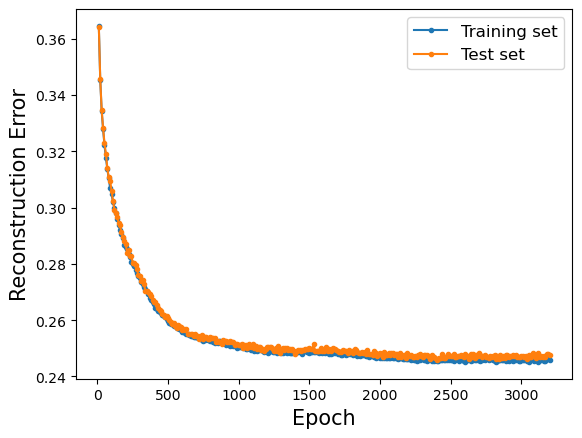

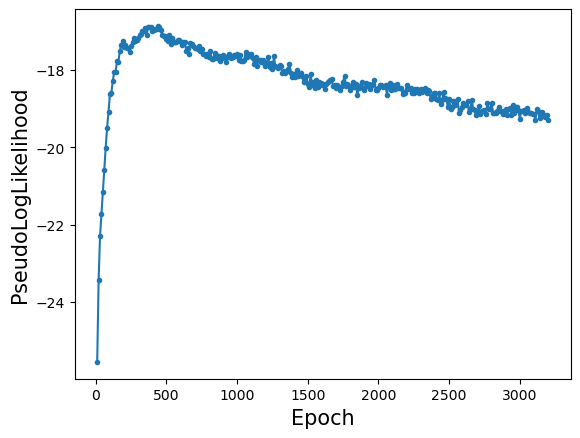

Training RBM 84/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365986 (train), 0.365389 (test), Pseud_Lik: -25.738574, Time: 1.175855, 
Ep 20, Rec er: 0.347898 (train), 0.347928 (test), Pseud_Lik: -23.650596, Time: 1.182307, 
Ep 30, Rec er: 0.335400 (train), 0.335380 (test), Pseud_Lik: -22.354584, Time: 1.194461, 
Ep 40, Rec er: 0.328566 (train), 0.328769 (test), Pseud_Lik: -21.681752, Time: 1.200876, 
Ep 50, Rec er: 0.323423 (train), 0.323872 (test), Pseud_Lik: -20.985891, Time: 1.212855, 
Ep 60, Rec er: 0.318416 (train), 0.319850 (test), Pseud_Lik: -20.471776, Time: 1.207346, 
Ep 70, Rec er: 0.315021 (train), 0.316141 (test), Pseud_Lik: -20.025649, Time: 1.214302, 
Ep 80, Rec er: 0.311445 (train), 0.312081 (test), Pseud_Lik: -19.669435, Time: 1.218435, 
Ep 90, Rec er: 0.308740 (train), 0.308914 (test), Pseud_Lik: -19.393080, Time: 1.211816, 
Ep 100, Rec er: 0.306346 (train), 0.306933 (test), Pse

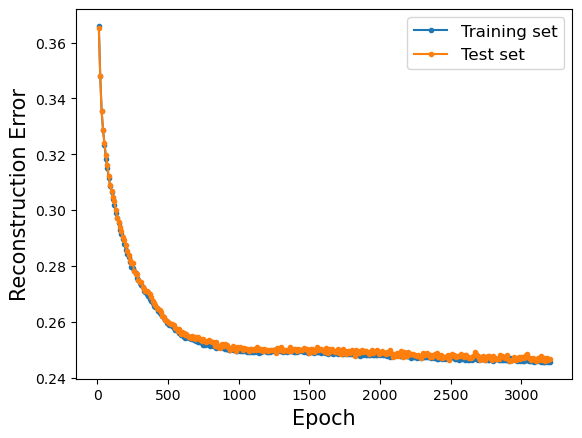

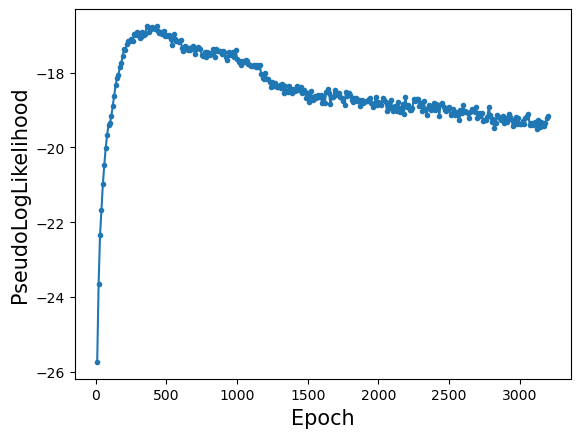

Training RBM 85/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366793 (train), 0.367369 (test), Pseud_Lik: -25.880245, Time: 1.180606, 
Ep 20, Rec er: 0.347694 (train), 0.347634 (test), Pseud_Lik: -23.709620, Time: 1.178190, 
Ep 30, Rec er: 0.334756 (train), 0.335678 (test), Pseud_Lik: -22.296366, Time: 1.200074, 
Ep 40, Rec er: 0.328508 (train), 0.329239 (test), Pseud_Lik: -21.634996, Time: 1.217056, 
Ep 50, Rec er: 0.323491 (train), 0.324886 (test), Pseud_Lik: -20.950995, Time: 1.238047, 
Ep 60, Rec er: 0.318854 (train), 0.320703 (test), Pseud_Lik: -20.248374, Time: 1.233317, 
Ep 70, Rec er: 0.316592 (train), 0.316961 (test), Pseud_Lik: -19.860485, Time: 1.285992, 
Ep 80, Rec er: 0.313662 (train), 0.313478 (test), Pseud_Lik: -19.584847, Time: 1.219081, 
Ep 90, Rec er: 0.311214 (train), 0.312292 (test), Pseud_Lik: -19.190046, Time: 1.218856, 
Ep 100, Rec er: 0.309530 (train), 0.310408 (test), Pse

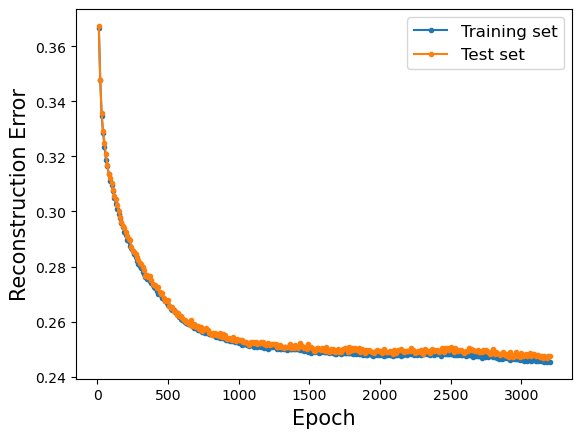

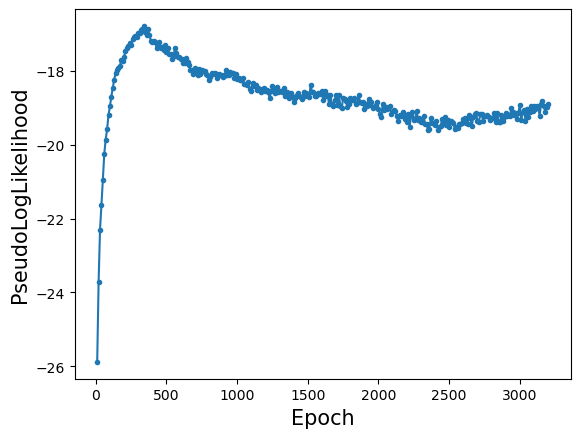

Training RBM 86/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366853 (train), 0.366895 (test), Pseud_Lik: -25.816713, Time: 1.188568, 
Ep 20, Rec er: 0.347848 (train), 0.348528 (test), Pseud_Lik: -23.698931, Time: 1.173659, 
Ep 30, Rec er: 0.335395 (train), 0.334137 (test), Pseud_Lik: -22.384746, Time: 1.192586, 
Ep 40, Rec er: 0.329096 (train), 0.328870 (test), Pseud_Lik: -21.689966, Time: 1.230324, 
Ep 50, Rec er: 0.323463 (train), 0.323984 (test), Pseud_Lik: -21.030338, Time: 1.201143, 
Ep 60, Rec er: 0.318661 (train), 0.319634 (test), Pseud_Lik: -20.413181, Time: 1.222617, 
Ep 70, Rec er: 0.314731 (train), 0.315883 (test), Pseud_Lik: -19.927432, Time: 1.229912, 
Ep 80, Rec er: 0.311593 (train), 0.312803 (test), Pseud_Lik: -19.485448, Time: 1.243440, 
Ep 90, Rec er: 0.308729 (train), 0.311066 (test), Pseud_Lik: -19.227305, Time: 1.262497, 
Ep 100, Rec er: 0.307220 (train), 0.307427 (test), Pse

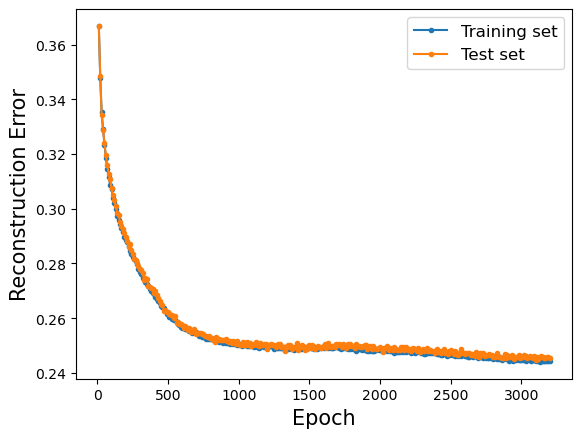

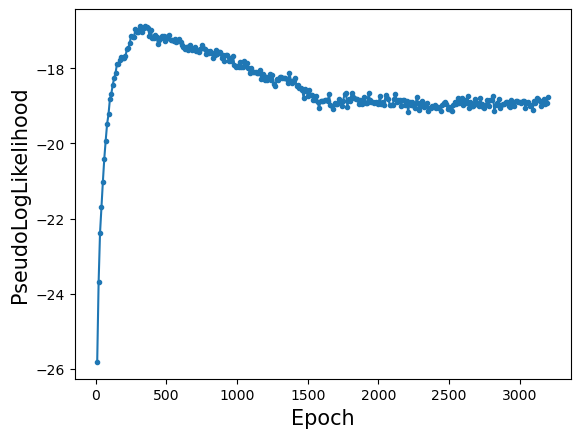

Training RBM 87/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366371 (train), 0.366530 (test), Pseud_Lik: -25.750021, Time: 1.179949, 
Ep 20, Rec er: 0.346088 (train), 0.345766 (test), Pseud_Lik: -23.493143, Time: 1.168305, 
Ep 30, Rec er: 0.335248 (train), 0.335909 (test), Pseud_Lik: -22.327837, Time: 1.183352, 
Ep 40, Rec er: 0.330381 (train), 0.331742 (test), Pseud_Lik: -21.760835, Time: 1.188041, 
Ep 50, Rec er: 0.324533 (train), 0.325925 (test), Pseud_Lik: -21.265006, Time: 1.191807, 
Ep 60, Rec er: 0.320035 (train), 0.320370 (test), Pseud_Lik: -20.642175, Time: 1.196168, 
Ep 70, Rec er: 0.315343 (train), 0.316842 (test), Pseud_Lik: -20.200602, Time: 1.208197, 
Ep 80, Rec er: 0.312159 (train), 0.313648 (test), Pseud_Lik: -19.592611, Time: 1.208340, 
Ep 90, Rec er: 0.308986 (train), 0.310250 (test), Pseud_Lik: -19.141255, Time: 1.209516, 
Ep 100, Rec er: 0.306354 (train), 0.308041 (test), Pse

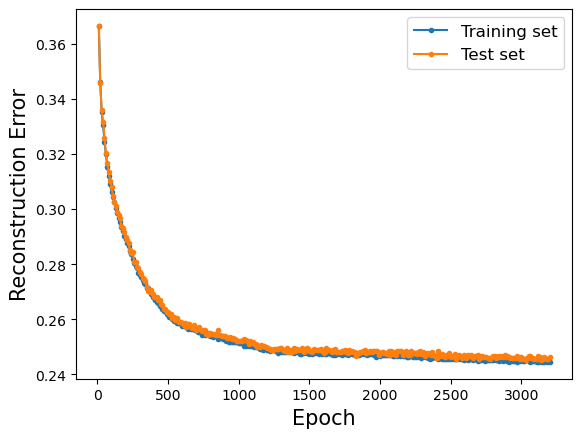

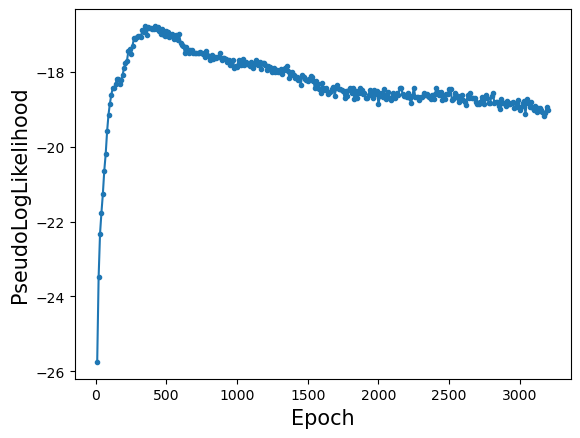

Training RBM 88/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366516 (train), 0.366742 (test), Pseud_Lik: -25.592884, Time: 1.175425, 
Ep 20, Rec er: 0.349801 (train), 0.349156 (test), Pseud_Lik: -23.713609, Time: 1.174031, 
Ep 30, Rec er: 0.336663 (train), 0.336873 (test), Pseud_Lik: -22.526687, Time: 1.189649, 
Ep 40, Rec er: 0.328754 (train), 0.329952 (test), Pseud_Lik: -21.817571, Time: 1.201666, 
Ep 50, Rec er: 0.323655 (train), 0.323905 (test), Pseud_Lik: -21.127441, Time: 1.217267, 
Ep 60, Rec er: 0.318446 (train), 0.318822 (test), Pseud_Lik: -20.628314, Time: 1.235976, 
Ep 70, Rec er: 0.314127 (train), 0.314317 (test), Pseud_Lik: -20.074316, Time: 1.280798, 
Ep 80, Rec er: 0.310140 (train), 0.311666 (test), Pseud_Lik: -19.558148, Time: 1.230488, 
Ep 90, Rec er: 0.307578 (train), 0.308077 (test), Pseud_Lik: -19.204557, Time: 1.213649, 
Ep 100, Rec er: 0.305089 (train), 0.306153 (test), Pse

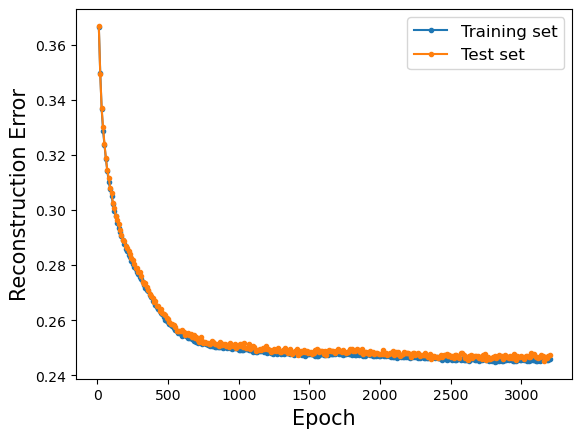

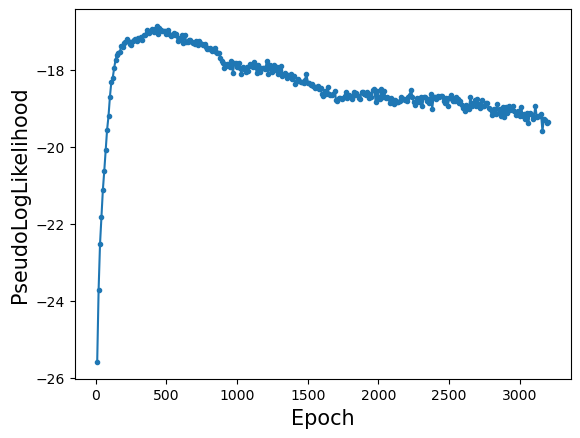

Training RBM 89/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366121 (train), 0.366095 (test), Pseud_Lik: -25.715655, Time: 1.176124, 
Ep 20, Rec er: 0.347274 (train), 0.347209 (test), Pseud_Lik: -23.640427, Time: 1.179606, 
Ep 30, Rec er: 0.335131 (train), 0.335328 (test), Pseud_Lik: -22.427844, Time: 1.223622, 
Ep 40, Rec er: 0.329220 (train), 0.330630 (test), Pseud_Lik: -21.791917, Time: 1.214982, 
Ep 50, Rec er: 0.323846 (train), 0.324552 (test), Pseud_Lik: -21.360723, Time: 1.198377, 
Ep 60, Rec er: 0.318569 (train), 0.319808 (test), Pseud_Lik: -20.636078, Time: 1.215975, 
Ep 70, Rec er: 0.314366 (train), 0.316028 (test), Pseud_Lik: -19.957108, Time: 1.211659, 
Ep 80, Rec er: 0.310686 (train), 0.312298 (test), Pseud_Lik: -19.594919, Time: 1.210624, 
Ep 90, Rec er: 0.307407 (train), 0.308205 (test), Pseud_Lik: -19.219212, Time: 1.206626, 
Ep 100, Rec er: 0.305323 (train), 0.304966 (test), Pse

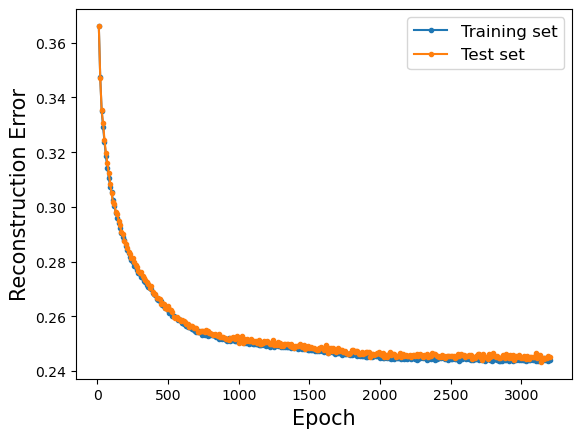

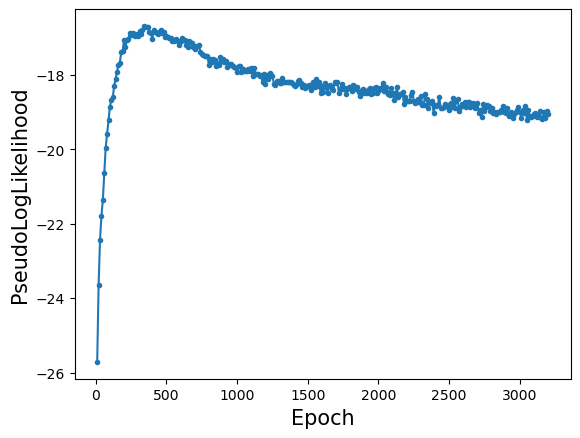

Training RBM 90/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365476 (train), 0.364987 (test), Pseud_Lik: -25.701425, Time: 1.181491, 
Ep 20, Rec er: 0.347282 (train), 0.346522 (test), Pseud_Lik: -23.558800, Time: 1.167072, 
Ep 30, Rec er: 0.337151 (train), 0.337123 (test), Pseud_Lik: -22.448347, Time: 1.177207, 
Ep 40, Rec er: 0.330634 (train), 0.331758 (test), Pseud_Lik: -21.861811, Time: 1.185091, 
Ep 50, Rec er: 0.325772 (train), 0.326125 (test), Pseud_Lik: -21.247598, Time: 1.195822, 
Ep 60, Rec er: 0.319817 (train), 0.320564 (test), Pseud_Lik: -20.673660, Time: 1.196724, 
Ep 70, Rec er: 0.315832 (train), 0.316295 (test), Pseud_Lik: -20.001461, Time: 1.200802, 
Ep 80, Rec er: 0.312421 (train), 0.311808 (test), Pseud_Lik: -19.613048, Time: 1.201607, 
Ep 90, Rec er: 0.309404 (train), 0.310520 (test), Pseud_Lik: -19.129781, Time: 1.208876, 
Ep 100, Rec er: 0.307022 (train), 0.306853 (test), Pse

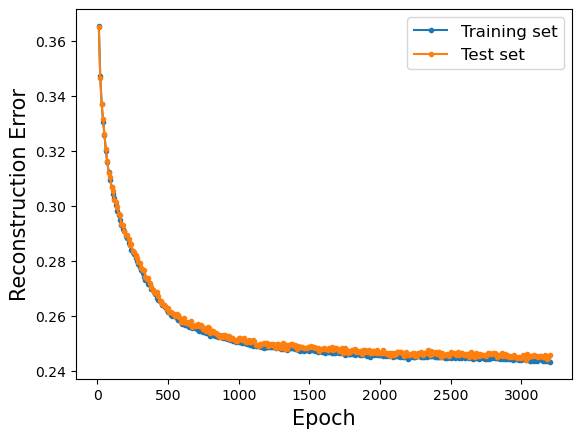

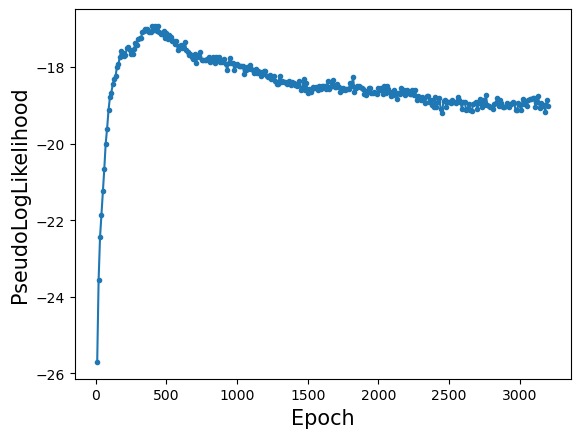

Training RBM 91/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366870 (train), 0.366698 (test), Pseud_Lik: -25.831023, Time: 1.175200, 
Ep 20, Rec er: 0.348729 (train), 0.347081 (test), Pseud_Lik: -23.657895, Time: 1.182916, 
Ep 30, Rec er: 0.336077 (train), 0.336603 (test), Pseud_Lik: -22.391926, Time: 1.211843, 
Ep 40, Rec er: 0.328705 (train), 0.328436 (test), Pseud_Lik: -21.442987, Time: 1.222357, 
Ep 50, Rec er: 0.324147 (train), 0.325337 (test), Pseud_Lik: -21.001129, Time: 1.246865, 
Ep 60, Rec er: 0.319674 (train), 0.320713 (test), Pseud_Lik: -20.756331, Time: 1.311603, 
Ep 70, Rec er: 0.317129 (train), 0.317522 (test), Pseud_Lik: -20.483371, Time: 1.240369, 
Ep 80, Rec er: 0.313312 (train), 0.314466 (test), Pseud_Lik: -20.083770, Time: 1.236012, 
Ep 90, Rec er: 0.310570 (train), 0.312177 (test), Pseud_Lik: -19.704328, Time: 1.233433, 
Ep 100, Rec er: 0.307608 (train), 0.309372 (test), Pse

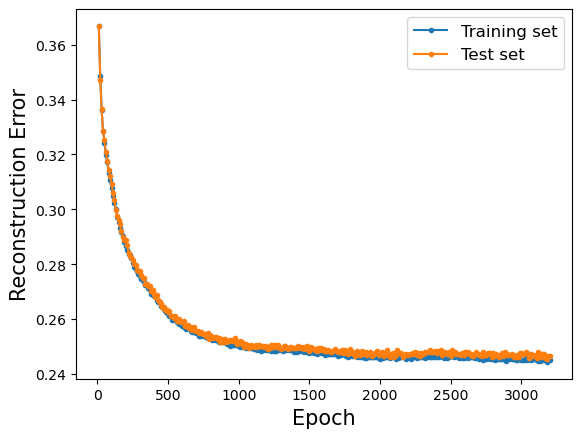

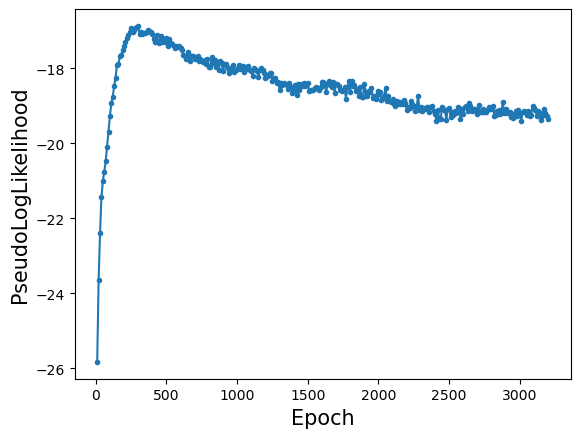

Training RBM 92/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365810 (train), 0.365094 (test), Pseud_Lik: -25.802359, Time: 1.177166, 
Ep 20, Rec er: 0.347437 (train), 0.346370 (test), Pseud_Lik: -23.594041, Time: 1.170180, 
Ep 30, Rec er: 0.334835 (train), 0.334716 (test), Pseud_Lik: -22.459610, Time: 1.187264, 
Ep 40, Rec er: 0.329252 (train), 0.330436 (test), Pseud_Lik: -21.903022, Time: 1.192904, 
Ep 50, Rec er: 0.323770 (train), 0.322681 (test), Pseud_Lik: -21.227941, Time: 1.193187, 
Ep 60, Rec er: 0.319080 (train), 0.321052 (test), Pseud_Lik: -20.843249, Time: 1.197490, 
Ep 70, Rec er: 0.315191 (train), 0.315423 (test), Pseud_Lik: -20.318894, Time: 1.259080, 
Ep 80, Rec er: 0.310888 (train), 0.311581 (test), Pseud_Lik: -19.714115, Time: 1.228179, 
Ep 90, Rec er: 0.308937 (train), 0.308727 (test), Pseud_Lik: -19.382478, Time: 1.212163, 
Ep 100, Rec er: 0.305882 (train), 0.306323 (test), Pse

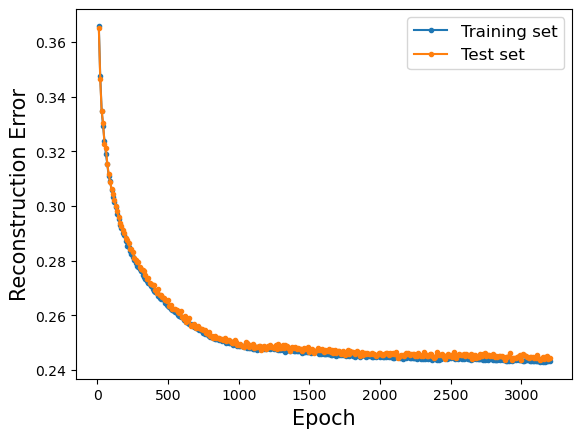

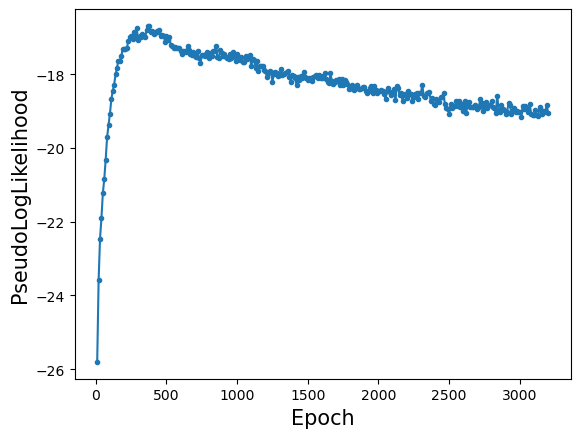

Training RBM 93/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366234 (train), 0.366688 (test), Pseud_Lik: -25.848978, Time: 1.173196, 
Ep 20, Rec er: 0.347656 (train), 0.348509 (test), Pseud_Lik: -23.715931, Time: 1.175291, 
Ep 30, Rec er: 0.335584 (train), 0.336222 (test), Pseud_Lik: -22.540341, Time: 1.190641, 
Ep 40, Rec er: 0.329529 (train), 0.330028 (test), Pseud_Lik: -21.741241, Time: 1.195290, 
Ep 50, Rec er: 0.323509 (train), 0.325378 (test), Pseud_Lik: -21.236415, Time: 1.201281, 
Ep 60, Rec er: 0.317627 (train), 0.319156 (test), Pseud_Lik: -20.351755, Time: 1.209487, 
Ep 70, Rec er: 0.313727 (train), 0.314639 (test), Pseud_Lik: -19.906020, Time: 1.218332, 
Ep 80, Rec er: 0.310608 (train), 0.311053 (test), Pseud_Lik: -19.396738, Time: 1.207255, 
Ep 90, Rec er: 0.307798 (train), 0.308675 (test), Pseud_Lik: -18.923274, Time: 1.224567, 
Ep 100, Rec er: 0.304652 (train), 0.305384 (test), Pse

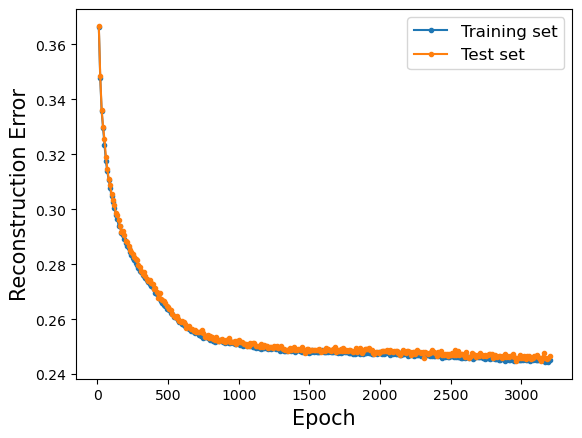

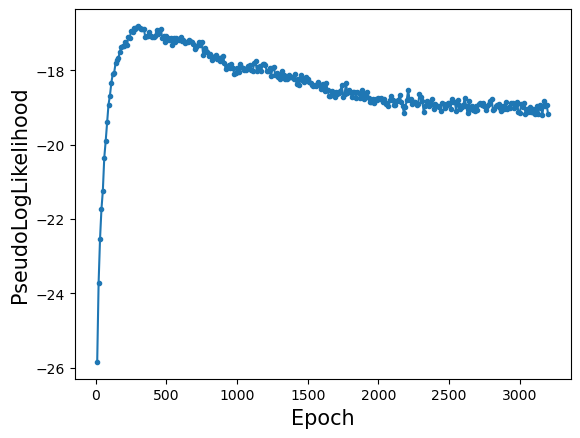

Training RBM 94/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.367148 (train), 0.366784 (test), Pseud_Lik: -25.814803, Time: 1.180496, 
Ep 20, Rec er: 0.348508 (train), 0.347514 (test), Pseud_Lik: -23.703499, Time: 1.176665, 
Ep 30, Rec er: 0.335320 (train), 0.337341 (test), Pseud_Lik: -22.273049, Time: 1.188781, 
Ep 40, Rec er: 0.329671 (train), 0.329877 (test), Pseud_Lik: -21.651412, Time: 1.198297, 
Ep 50, Rec er: 0.323857 (train), 0.324884 (test), Pseud_Lik: -21.045426, Time: 1.205097, 
Ep 60, Rec er: 0.319433 (train), 0.321403 (test), Pseud_Lik: -20.339217, Time: 1.203634, 
Ep 70, Rec er: 0.316101 (train), 0.317477 (test), Pseud_Lik: -19.901770, Time: 1.209984, 
Ep 80, Rec er: 0.313341 (train), 0.313505 (test), Pseud_Lik: -19.423603, Time: 1.212381, 
Ep 90, Rec er: 0.310660 (train), 0.311777 (test), Pseud_Lik: -19.288944, Time: 1.219711, 
Ep 100, Rec er: 0.309073 (train), 0.309103 (test), Pse

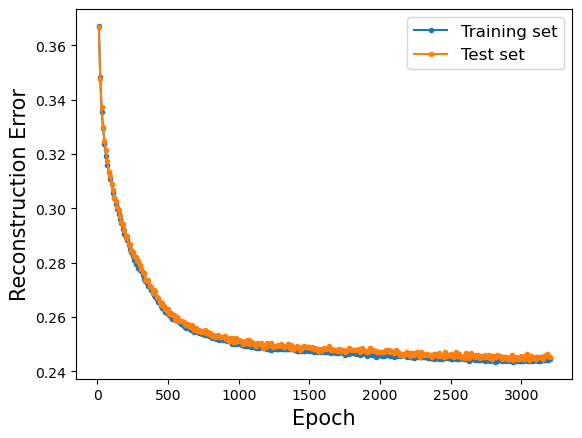

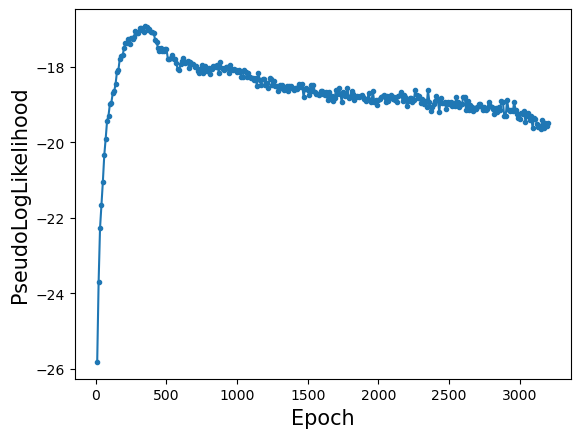

Training RBM 95/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365484 (train), 0.364648 (test), Pseud_Lik: -25.614434, Time: 1.176799, 
Ep 20, Rec er: 0.350410 (train), 0.348708 (test), Pseud_Lik: -23.672147, Time: 1.165680, 
Ep 30, Rec er: 0.336611 (train), 0.336258 (test), Pseud_Lik: -22.590754, Time: 1.182898, 
Ep 40, Rec er: 0.329716 (train), 0.329141 (test), Pseud_Lik: -21.980749, Time: 1.195104, 
Ep 50, Rec er: 0.323442 (train), 0.324527 (test), Pseud_Lik: -21.569815, Time: 1.197736, 
Ep 60, Rec er: 0.318239 (train), 0.318573 (test), Pseud_Lik: -20.796120, Time: 1.200102, 
Ep 70, Rec er: 0.313727 (train), 0.313859 (test), Pseud_Lik: -20.156176, Time: 1.222691, 
Ep 80, Rec er: 0.309521 (train), 0.310033 (test), Pseud_Lik: -19.525074, Time: 1.229675, 
Ep 90, Rec er: 0.306446 (train), 0.307217 (test), Pseud_Lik: -19.264029, Time: 1.232209, 
Ep 100, Rec er: 0.303684 (train), 0.304031 (test), Pse

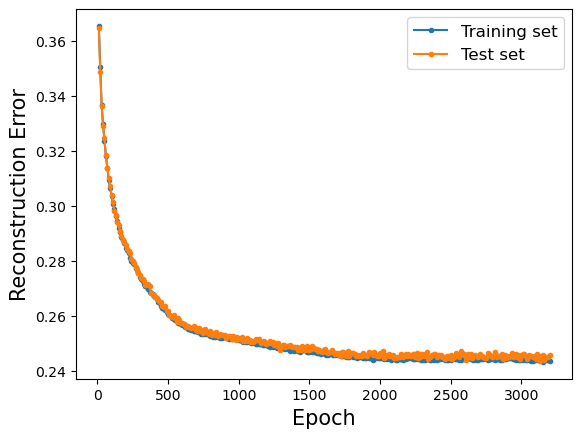

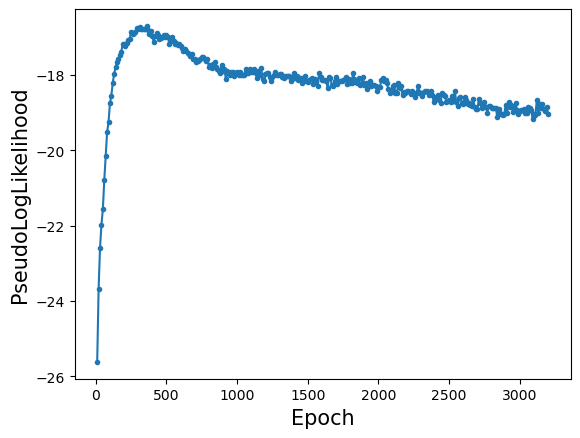

Training RBM 96/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365080 (train), 0.364675 (test), Pseud_Lik: -25.924704, Time: 1.218831, 
Ep 20, Rec er: 0.345486 (train), 0.344805 (test), Pseud_Lik: -23.499291, Time: 1.243369, 
Ep 30, Rec er: 0.334921 (train), 0.334744 (test), Pseud_Lik: -22.327358, Time: 1.197192, 
Ep 40, Rec er: 0.329113 (train), 0.330355 (test), Pseud_Lik: -21.813500, Time: 1.199741, 
Ep 50, Rec er: 0.324475 (train), 0.324930 (test), Pseud_Lik: -21.223061, Time: 1.217673, 
Ep 60, Rec er: 0.319605 (train), 0.319756 (test), Pseud_Lik: -20.860406, Time: 1.228166, 
Ep 70, Rec er: 0.316140 (train), 0.317638 (test), Pseud_Lik: -20.301743, Time: 1.252710, 
Ep 80, Rec er: 0.313670 (train), 0.314852 (test), Pseud_Lik: -20.111032, Time: 1.260928, 
Ep 90, Rec er: 0.310227 (train), 0.310609 (test), Pseud_Lik: -19.614399, Time: 1.264601, 
Ep 100, Rec er: 0.307905 (train), 0.308759 (test), Pse

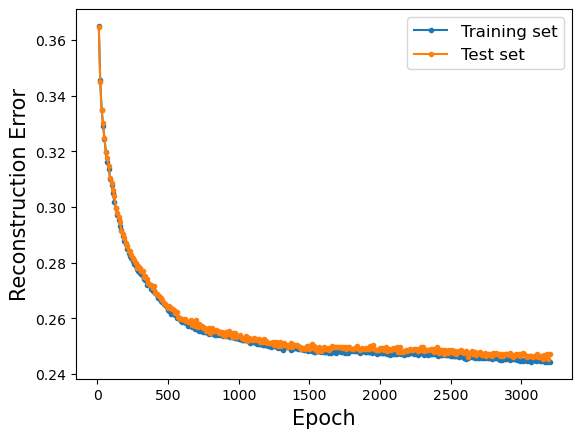

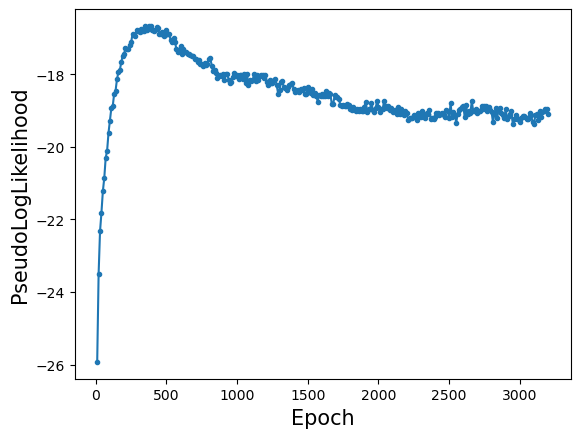

Training RBM 97/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366820 (train), 0.366356 (test), Pseud_Lik: -25.724437, Time: 1.180604, 
Ep 20, Rec er: 0.348602 (train), 0.348831 (test), Pseud_Lik: -23.587791, Time: 1.169756, 
Ep 30, Rec er: 0.336031 (train), 0.337378 (test), Pseud_Lik: -22.330559, Time: 1.193073, 
Ep 40, Rec er: 0.330327 (train), 0.330875 (test), Pseud_Lik: -22.045230, Time: 1.197190, 
Ep 50, Rec er: 0.325278 (train), 0.327059 (test), Pseud_Lik: -21.461899, Time: 1.203504, 
Ep 60, Rec er: 0.321379 (train), 0.321438 (test), Pseud_Lik: -21.031681, Time: 1.207506, 
Ep 70, Rec er: 0.316515 (train), 0.317533 (test), Pseud_Lik: -20.422908, Time: 1.218968, 
Ep 80, Rec er: 0.312885 (train), 0.313108 (test), Pseud_Lik: -19.814013, Time: 1.215801, 
Ep 90, Rec er: 0.309062 (train), 0.309897 (test), Pseud_Lik: -19.394560, Time: 1.223654, 
Ep 100, Rec er: 0.306121 (train), 0.306198 (test), Pse

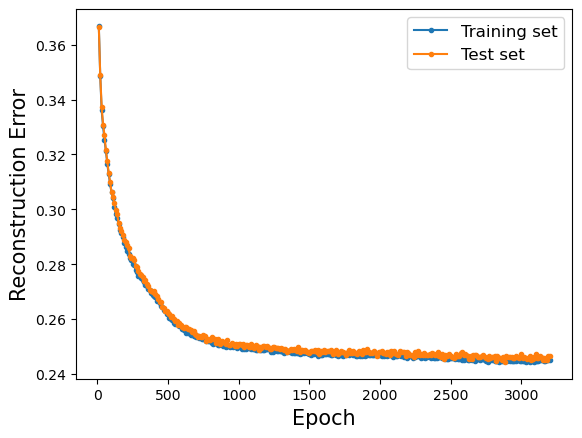

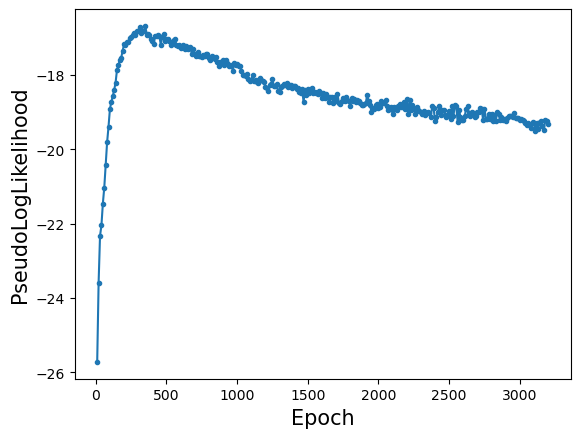

Training RBM 98/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366001 (train), 0.366498 (test), Pseud_Lik: -25.577442, Time: 1.196888, 
Ep 20, Rec er: 0.348050 (train), 0.348250 (test), Pseud_Lik: -23.512800, Time: 1.193295, 
Ep 30, Rec er: 0.336390 (train), 0.337419 (test), Pseud_Lik: -22.470943, Time: 1.282855, 
Ep 40, Rec er: 0.331444 (train), 0.331825 (test), Pseud_Lik: -21.933319, Time: 1.221814, 
Ep 50, Rec er: 0.326175 (train), 0.326866 (test), Pseud_Lik: -21.524418, Time: 1.207164, 
Ep 60, Rec er: 0.321127 (train), 0.321525 (test), Pseud_Lik: -21.020758, Time: 1.253548, 
Ep 70, Rec er: 0.315775 (train), 0.316173 (test), Pseud_Lik: -20.426151, Time: 1.283509, 
Ep 80, Rec er: 0.311678 (train), 0.311891 (test), Pseud_Lik: -19.752976, Time: 1.254768, 
Ep 90, Rec er: 0.308590 (train), 0.309166 (test), Pseud_Lik: -19.330543, Time: 1.229179, 
Ep 100, Rec er: 0.305259 (train), 0.306477 (test), Pse

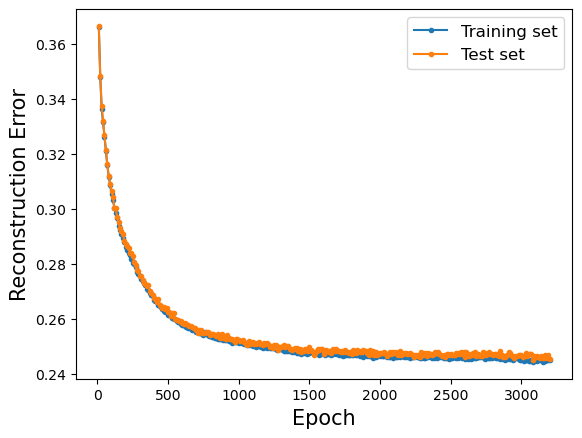

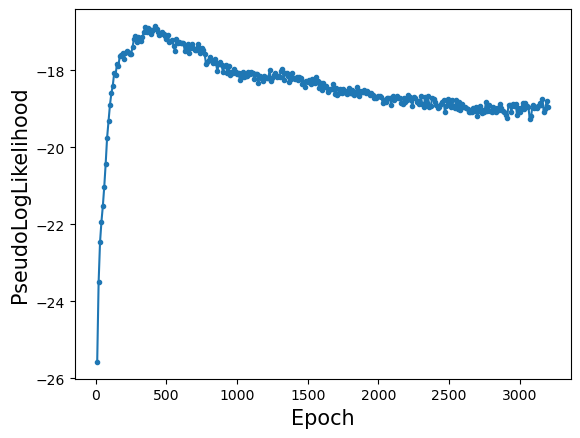

Training RBM 99/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366830 (train), 0.366589 (test), Pseud_Lik: -25.908056, Time: 1.180422, 
Ep 20, Rec er: 0.346230 (train), 0.345495 (test), Pseud_Lik: -23.467028, Time: 1.192877, 
Ep 30, Rec er: 0.335354 (train), 0.335809 (test), Pseud_Lik: -22.273965, Time: 1.239577, 
Ep 40, Rec er: 0.329182 (train), 0.330555 (test), Pseud_Lik: -21.379381, Time: 1.271062, 
Ep 50, Rec er: 0.324058 (train), 0.323780 (test), Pseud_Lik: -20.910346, Time: 1.230896, 
Ep 60, Rec er: 0.318709 (train), 0.320602 (test), Pseud_Lik: -20.544389, Time: 1.210390, 
Ep 70, Rec er: 0.315370 (train), 0.316497 (test), Pseud_Lik: -20.087157, Time: 1.210775, 
Ep 80, Rec er: 0.312873 (train), 0.313433 (test), Pseud_Lik: -19.447897, Time: 1.212488, 
Ep 90, Rec er: 0.310064 (train), 0.310775 (test), Pseud_Lik: -19.041203, Time: 1.217718, 
Ep 100, Rec er: 0.307632 (train), 0.309230 (test), Pse

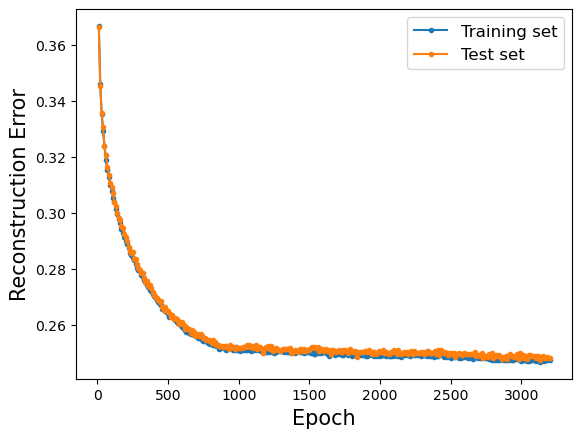

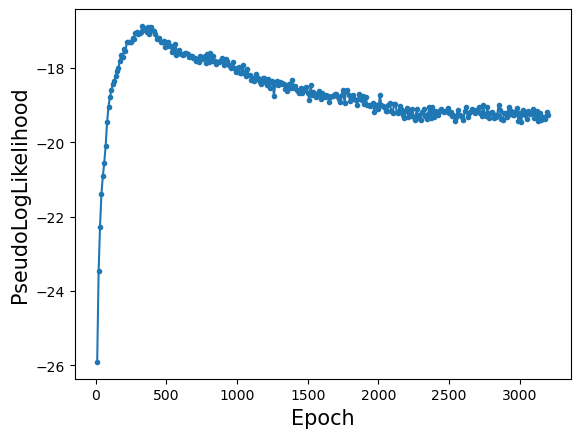

Training RBM 100/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.365904 (train), 0.366081 (test), Pseud_Lik: -25.739297, Time: 1.185782, 
Ep 20, Rec er: 0.348237 (train), 0.348266 (test), Pseud_Lik: -23.642652, Time: 1.188223, 
Ep 30, Rec er: 0.335348 (train), 0.335384 (test), Pseud_Lik: -22.357677, Time: 1.231882, 
Ep 40, Rec er: 0.329120 (train), 0.329345 (test), Pseud_Lik: -21.634096, Time: 1.234602, 
Ep 50, Rec er: 0.324268 (train), 0.323719 (test), Pseud_Lik: -21.080718, Time: 1.253344, 
Ep 60, Rec er: 0.319659 (train), 0.320812 (test), Pseud_Lik: -20.619323, Time: 1.225573, 
Ep 70, Rec er: 0.315818 (train), 0.317305 (test), Pseud_Lik: -20.391179, Time: 1.261185, 
Ep 80, Rec er: 0.312554 (train), 0.314169 (test), Pseud_Lik: -19.898698, Time: 1.337644, 
Ep 90, Rec er: 0.309913 (train), 0.310608 (test), Pseud_Lik: -19.628177, Time: 1.487143, 
Ep 100, Rec er: 0.307129 (train), 0.308916 (test), Ps

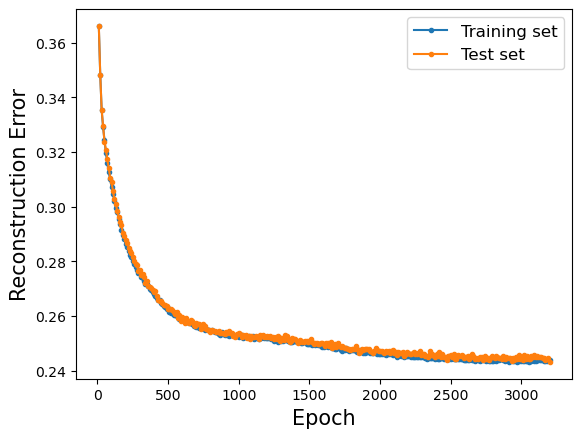

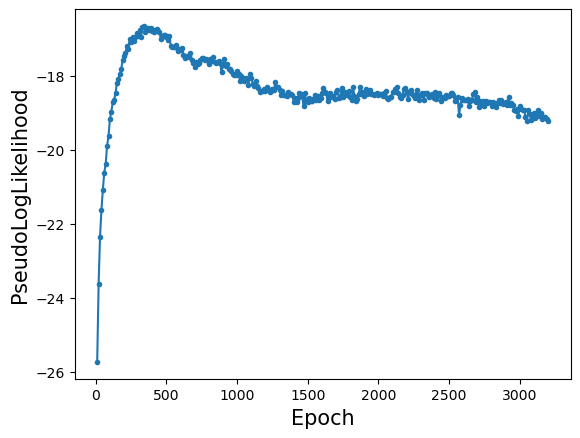

Training RBM 101/250
RBM --- Nv= 64, Nh= 64, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 3200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.366500 (train), 0.366202 (test), Pseud_Lik: -25.967041, Time: 1.210071, 
Ep 20, Rec er: 0.346764 (train), 0.346747 (test), Pseud_Lik: -23.650091, Time: 1.199074, 
Ep 30, Rec er: 0.335006 (train), 0.335886 (test), Pseud_Lik: -22.261279, Time: 1.208337, 
Ep 40, Rec er: 0.328685 (train), 0.328859 (test), Pseud_Lik: -21.345127, Time: 1.282486, 
Ep 50, Rec er: 0.323647 (train), 0.324481 (test), Pseud_Lik: -20.955406, Time: 1.221361, 
Ep 60, Rec er: 0.320770 (train), 0.320619 (test), Pseud_Lik: -20.826008, Time: 1.257190, 
Ep 70, Rec er: 0.317601 (train), 0.318264 (test), Pseud_Lik: -20.386230, Time: 1.242877, 
Ep 80, Rec er: 0.314485 (train), 0.315013 (test), Pseud_Lik: -19.789172, Time: 1.263366, 
Ep 90, Rec er: 0.311993 (train), 0.312178 (test), Pseud_Lik: -19.414899, Time: 1.255508, 
Ep 100, Rec er: 0.309973 (train), 0.310259 (test), Ps

KeyboardInterrupt: 

In [13]:

lr = 0.01
k_learning = 1
batch_size = 100
nb_epoch = 3200
k_sampling = 1

total_rbms = 250  # Total number of RBMs to train
rbms_per_batch = 5  # Number of RBMs per batch
temp_storage = []  # Temporary storage for each batch of RBMs

for rbm_index in range(total_rbms):
    print(f"Training RBM {rbm_index + 1}/{total_rbms}")

    # Initialize a new RBM
    rbm = RBM(num_visible=training_set.shape[1], 
              num_hidden=training_set.shape[1], 
              bias=False,
              T=1.0,
              use_cuda=False)

    # Train the RBM
    rbm.learn(training_set=training_set, 
              test_set=test_set,
              lr=lr, 
              nb_epoch=nb_epoch, 
              batch_size=batch_size,
              k_learning=k_learning,
              k_sampling=k_sampling,
              verbose=10)

    # Add the trained RBM to the temporary storage
    temp_storage.append(rbm)

    # Save 2 RBMs as a batch
    if (rbm_index + 1) % rbms_per_batch == 0 or (rbm_index + 1) == total_rbms:
        batch_index = (rbm_index + 1) // rbms_per_batch
        torch.save(temp_storage, f'rbms_group_{batch_index}.pt')
        temp_storage = []  # Clear the temporary storage for the next batch


In [ ]:
all_rbms = []  # List to store all RBMs

# Loop through each file and load the RBMs
for i in range(1, 101):  # Assuming file names are from 1 to 100
    file_name = f'rbms_group_{i}.pt'
    rbms_batch = torch.load(file_name)
    all_rbms.extend(rbms_batch)  # Add the loaded RBMs to the list

# Save all RBMs into one file
# torch.save(all_rbms, '200epochs__250_rbms.pt')

<Axes: >

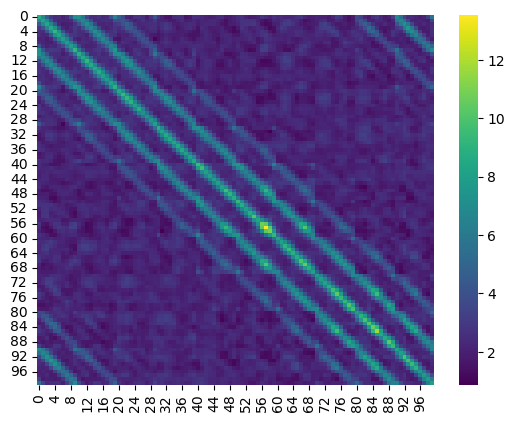

In [12]:
loaded_rbms = torch.load('rbms_group_1.pt')
w = loaded_rbms[0].parameters()[0]
w = torch.mm(w.t(),w)
sns.heatmap(w, linewidths= 0.0, cmap= 'viridis')

### Saving the multiple batches into 1

In [9]:
nb_epoch= rbm.num_train_epochs()
Nv= training_set.shape[1]
Nh= training_set.shape[1]

name = 'RBM_model_T_complete_nv%d_nh%d_lr%.1E_k%d_bsize%d_nepochs%d' % (Nv,
                                                                        Nh,
                                                                        lr,
                                                                        k_learning,
                                                                        batch_size,
                                                                        nb_epoch)

PATH = name + '.pt'

torch.save(rbm, PATH)

### Weights distribution

In [10]:
W, v, h = rbm.parameters()

del v
del h
torch.cuda.empty_cache()

In [11]:
W_layers = rbm.W_layers()

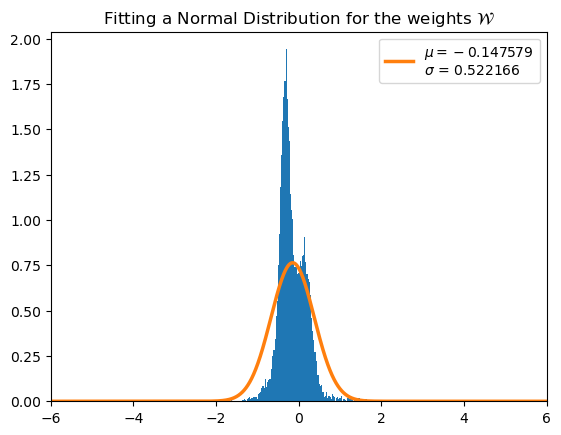

In [12]:
W_ = W.cpu().numpy().reshape((W.shape[0]*W.shape[1]))

# Plot normalized histogram 
plt.hist(W_, 
         bins= 1000, 
         density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W}$')
plt.xlim([-6, 6])
plt.legend()
plt.show()

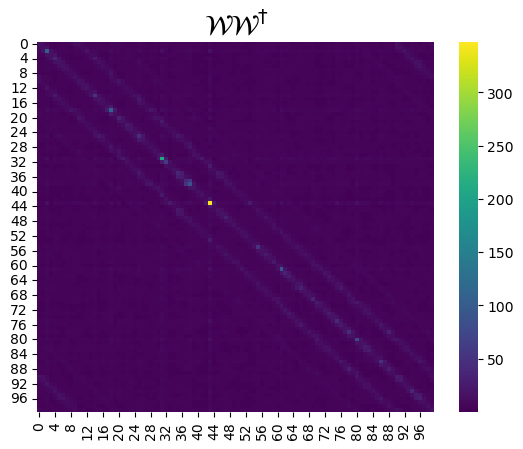

In [13]:
WW = torch.mm(W.t(), W)
sns.heatmap(WW, linewidths= 0.0, cmap= 'viridis')
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
plt.show()

### Comparing this weight distribution with the one from MF trainining set

In [14]:
rbm = torch.load('RBM_model_T_complete_nv100_nh100_lr1.0E-02_k1_bsize100_nepochs8000.pt')

In [15]:
W, v, h = rbm.parameters()

del v
del h
torch.cuda.empty_cache()

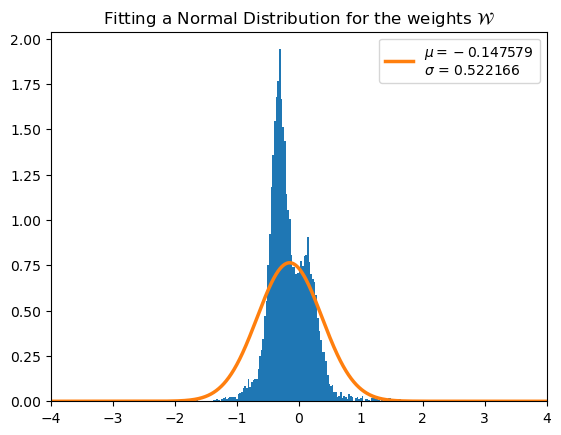

In [16]:
W_ = W.cpu().numpy().reshape((W.shape[0]*W.shape[1]))

# Plot normalized histogram 
plt.hist(W_, 
         bins= 1000, 
         density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W}$')
plt.xlim([-4, 4])
plt.legend()
plt.show()

In [17]:
rbm_MF = torch.load('RBM_model_T_complete_MF_nv100_nh100_lr1.0E-03_k1_bsize100_nepochs20000.pt')

W_MF, v_MF, h_MF = rbm_MF.parameters()

del v_MF
del h_MF
torch.cuda.empty_cache()


FileNotFoundError: [Errno 2] No such file or directory: 'RBM_model_T_complete_MF_nv100_nh100_lr1.0E-03_k1_bsize100_nepochs20000.pt'

In [19]:
W_ = W_MF.cpu().numpy().reshape((W_MF.shape[0]*W_MF.shape[1]))

# Plot normalized histogram 
plt.hist(W_, 
         bins= 100, 
         density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_MF, sigmaW_MF = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_MF, sigmaW_MF) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_MF, sigmaW_MF ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W} - MF$')
plt.xlim([-4, 4])
plt.legend()
plt.show()

NameError: name 'W_MF' is not defined

In [91]:
def distr_comp(muW_,
               sigmaW_,
               muW_MF,
               sigmaW_MF,
               L= 10,
               x_min= -5,
               x_max= 5,
               x_num= 500,
               loc_legend= 'lower right',
               training_set= 'COMPLETE',
               save= False, 
               publication= False):
              
    if publication:
        plt.figure(figsize=(3.375, 0.678*3.375))
        plt.xticks(fontsize= 6)
        plt.yticks(fontsize= 6)
        markersize = 4.0
        linewidth= 0.4
        alpha= 0.1
        fontsize_t = 6.0
        linewidth_v= 0.5
        
    else:
        markersize = 10.0
        linewidth= 1.5
        alpha= 0.1
        fontsize_t = 12.0
        linewidth_v= 0.8
        
           
    x = np.linspace(x_min, x_max, x_num)
    plot_pdf = stats.norm.pdf(x, muW_, sigmaW_)
    plot_pdf_MF = stats.norm.pdf(x, muW_MF, sigmaW_MF)

    plt.plot(x, 
             plot_pdf, 
             linewidth= linewidth,
             label= 'Nearest Neig')

    plt.fill_between(x, 
                     plot_pdf,
                     alpha= alpha)

    plt.plot(x, 
             plot_pdf_MF,
             linewidth= linewidth,
             label= 'Mean Field')

    plt.fill_between(x,
                     plot_pdf_MF,
                     alpha= alpha)
    
    plt.axvline(x= 0.0, linestyle= ':', linewidth= linewidth_v, color= 'black')

    plt.ylim([0, plt.ylim()[1]])
    plt.legend(loc= loc_legend,
              fontsize= fontsize_t)
    
    if save:
        if publication:
            path_fig = '../figures/PUB_DISTRIB_COMP_NN_vs_MF_L%d_Train%s.pdf' % (L, training_set)   
            plt.savefig(path_fig , bbox_inches='tight')
        else:
            path_fig = '../figures/DISTRIB_COMP_NN_vs_MF_L%d_Train%s.pdf' % (L, training_set)   
            plt.savefig(path_fig, bbox_inches='tight')
    
    plt.show()

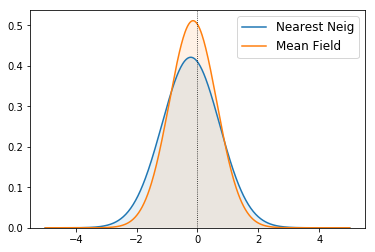

In [93]:
distr_comp(muW_= muW_,
           sigmaW_= sigmaW_,
           muW_MF= muW_MF,
           sigmaW_MF= sigmaW_MF,
           L= 10,
           x_min= -5,
           x_max= 5,
           x_num= 500,
           loc_legend= 'upper right',
           training_set= 'COMPLETE',
           save= False, 
           publication= False)